# <center> Nifty Fifty Momentum - Long/Neutral Approach </center>

### <center> Essentially AI research </center>

The research in this notebook is focused on the development of a momentum strategy for stocks on the National Stock Exchange of India (NSE). 

The strategy is developed as follows: 

1) The first step is to generate two stationary indicators based on:
- The target stock
- the Indian VIX 

Both indicators are constructed by differencing the raw time series, both target stock and Indian VIX, and then smooth/trend filter with moving averages. 



In this reseach, we observed leading signals on both 


In [1]:
# ## Note: restart after running this cell

# ! pip install plotly --upgrade
# ! pip install pmdarima

In [2]:
# Import libraries 

from datetime import datetime

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

### Import Kite data 

In [3]:
data1 = pd.read_csv('HDFC-2012-2016.csv')
data1.drop(columns=['Unnamed: 0', 'oi'], inplace=True)
data1.set_index('date', inplace=True)
data1.index = data1.index.astype('str').str.slice(stop=10)
data1.index = pd.to_datetime(data1.index)
data1 = data1.resample('d').sum()

data2 = pd.read_csv('HDFC-2017-2022.csv')
data2.drop(columns=['Unnamed: 0', 'oi'], inplace=True)
data2.set_index('date', inplace=True)
data2.index = data2.index.astype('str').str.slice(stop=10)
data2.index = pd.to_datetime(data2.index)
data2 = data2.resample('d').sum()


In [4]:
data = data1.append(data2)
data = data[data['open'] != 0.00]

data.dropna(inplace=True)
data['close_target'] = data['close'].shift(-1)
data.dropna(inplace=True)

data = data['2014':]
data.tail()

,open,high,low,close,volume,close_target
date,,,,,,
2022-05-25,1330.00,1335.95,1323.20,1328.80,6443556,1366.70
2022-05-26,1342.15,1371.00,1340.00,1366.70,13496214,1392.05
2022-05-27,1371.80,1394.70,1370.75,1392.05,12015859,1401.55
2022-05-30,1410.25,1420.50,1398.45,1401.55,6312337,1388.95
2022-05-31,1395.90,1404.80,1380.00,1388.95,6742694,1394.85


In [5]:
from nsepy import get_history

from datetime import date

VIX = get_history(symbol="INDIA VIX", start=date(2014,1,1),end=date(2022,5,23), index=True)


['open', 'high', 'low', 'close', 'volume', 'VIX']

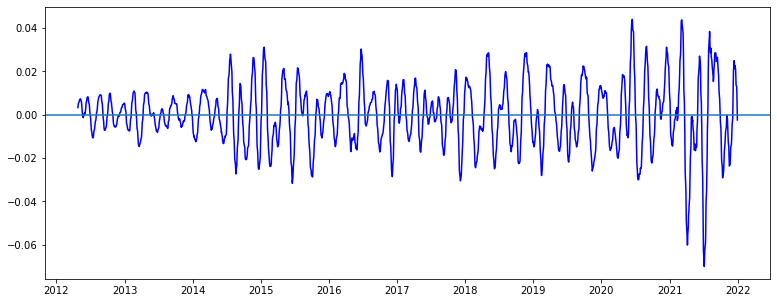

In [57]:
# ### Vix

# VIX1 = VIX.copy()
# VIX1.index = pd.to_datetime(VIX1.index)
# VIX1.rename(columns={'Close':'VIX'}, inplace=True)

# VIX1 = VIX1.diff()
# VIX1 = VIX1.rolling(30).mean()

# VIX1['VIX'] = VIX1['VIX'].rolling(20).mean() - VIX1['VIX'].rolling(30).mean() 


# ### Reli data 
# data_anal = data.copy()

# data_anal = data_anal.merge(VIX1, left_index=True, right_index=True)
# data_anal.drop(columns=['Open', 'High', 'Low', 'Volume', 'Turnover'], inplace=True)

# # data_anal['close'] = data_anal['close'].diff()
# columns = list(data_anal.columns)
# columns.remove('close_target')
# display(columns)

# data_anal[columns] = data_anal[columns].diff()

# data_anal[columns] = data_anal[columns].rolling(20).mean()
# data_anal['close'] = data_anal['close'].rolling(15).mean() - data_anal['close'].rolling(30).mean()

# data_anal['combined'] = (data_anal['close']/50) + (data_anal['VIX'])

# data_anal.dropna(inplace=True)


# fig, ax = plt.subplots(figsize=(13, 5))
                       

# ax.plot(data_anal['combined'], color='b')
# ax.axhline(y=0)

# #display((data_anal['VIX']['2020':]).plot(figsize=(10,5)))
# #display(data_anal['combined']['2019'].plot(figsize=(10,5)))

In [6]:
def moving_average_opt(VIX, data, vix_s, vix_l, data_s, data_l):
    
    # # Copy of the API extraction VIX
    VIX1 = VIX.copy()

    # Convert index to datetime
    VIX1.index = pd.to_datetime(VIX1.index)
    VIX1.rename(columns={'Close':'VIX'}, inplace=True)
    VIX1 = VIX1.diff()

    # Smooth of VIX
    VIX1 = VIX1.rolling(30).mean()
    
    
    ####### Optimization ######
    
    # # MA crossover of VIX
    VIX1['VIX'] = VIX1['VIX'].rolling(vix_s).mean() - VIX1['VIX'].rolling(vix_l).mean() 

    # Stock Price data
    data_anal = data.copy()

    # Merge of Stock Price and VIX
    data_anal = data_anal.merge(VIX1, left_index=True, right_index=True)

    # Drop Open, High, Low, Volume and Turnover
    data_anal.drop(columns=['Open', 'High', 'Low', 'Volume', 'Turnover', 'open', 'high', 'low', 'volume'], inplace=True)

    columns = list(data_anal.columns)
    columns.remove('close_target')

    data_anal[columns] = data_anal[columns].diff()

    data_anal[columns] = data_anal[columns].rolling(20).mean()

    data_anal['close'] = data_anal['close'].rolling(data_s).mean() - data_anal['close'].rolling(data_l).mean()

    data_anal['combined'] = (data_anal['close']/50) + (data_anal['VIX'])

    data_anal.dropna(inplace=True)


#     fig, ax = plt.subplots(figsize=(13, 5))


#     ax.plot(data_anal['combined'], color='b')
#     ax.axhline(y=0)
#     plt.show()

    return data_anal

    #display((data_anal['VIX']['2020':]).plot(figsize=(10,5)))
    #display(data_anal['combined']['2019'].plot(figsize=(10,5)))
    ####### optimization
    

[(5, 10), (5, 15), (5, 20), (5, 25), (5, 30), (5, 35), (10, 15), (10, 20), (10, 25), (10, 30), (10, 35), (15, 20), (15, 25), (15, 30), (15, 35), (20, 25), (20, 30), (20, 35), (25, 30), (25, 35), (30, 35)]
5 10 5 10


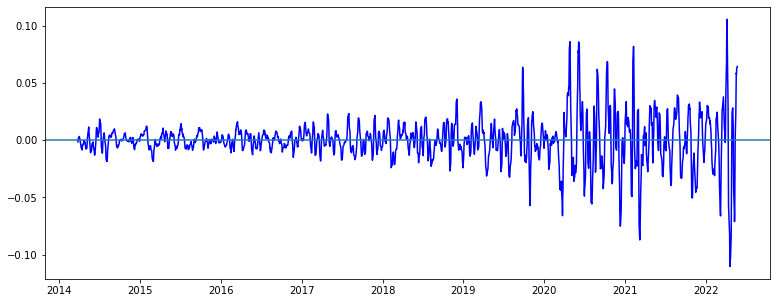

5 10 5 15


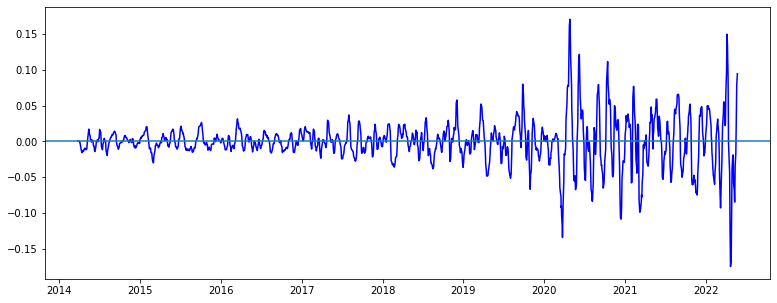

5 10 5 20


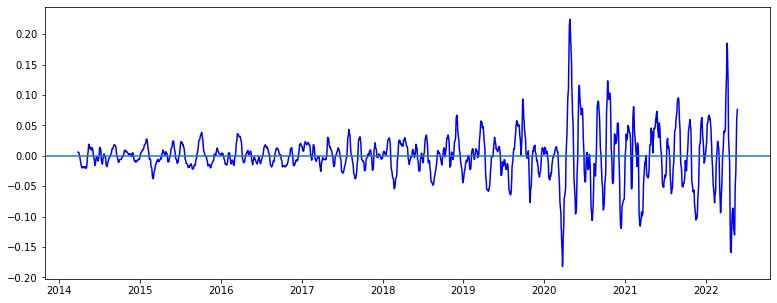

5 10 5 25


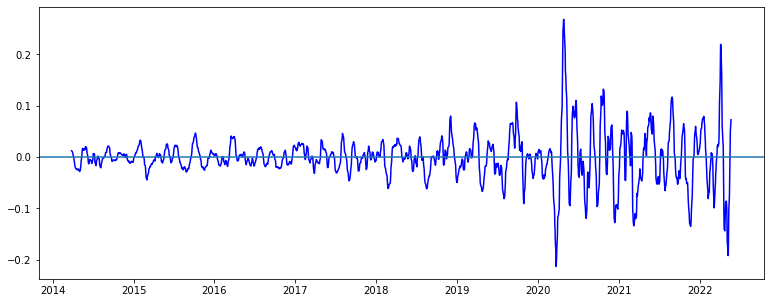

5 10 5 30


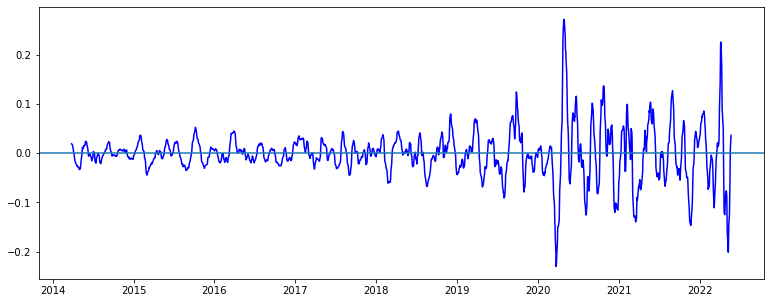

5 10 5 35


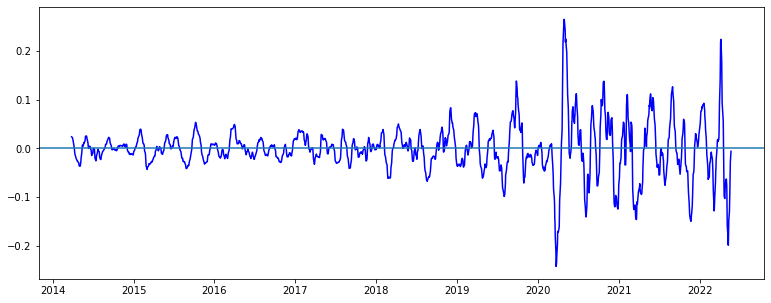

5 10 10 15


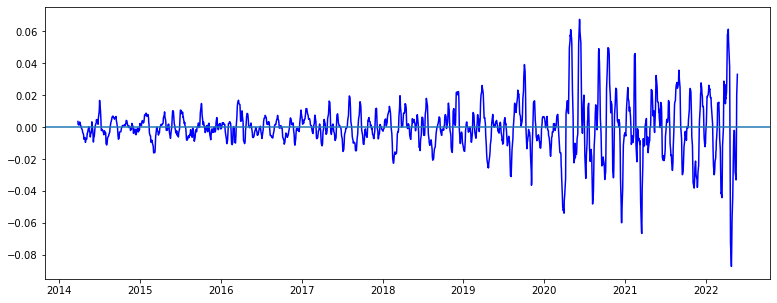

5 10 10 20


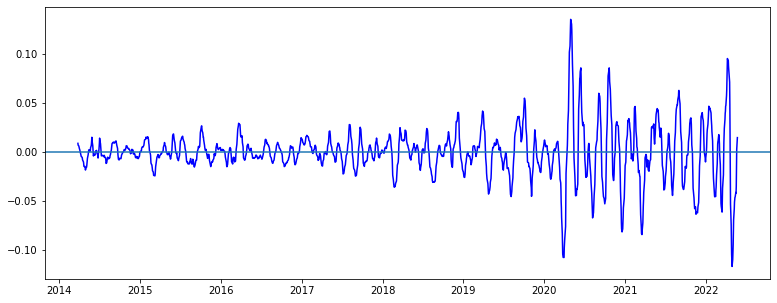

5 10 10 25


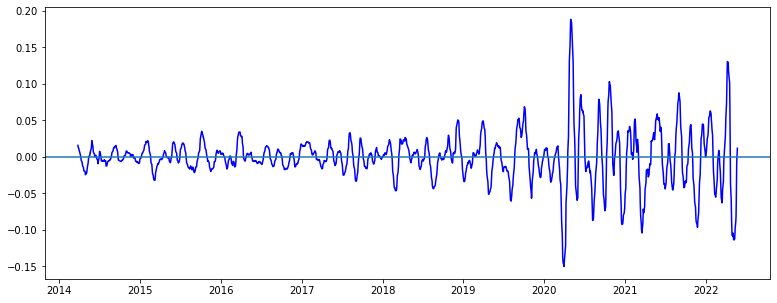

5 10 10 30


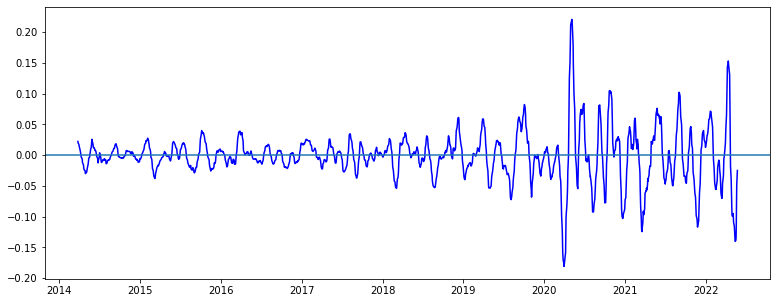

5 10 10 35


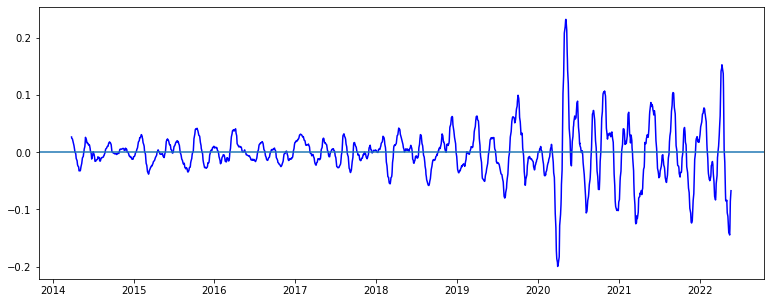

5 10 15 20


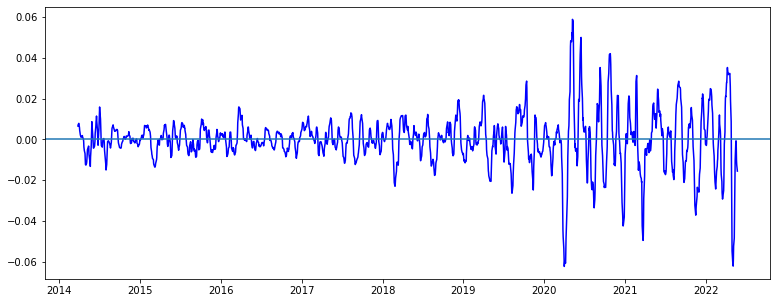

5 10 15 25


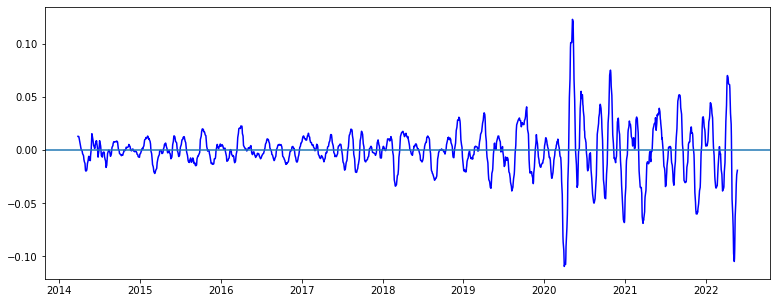

5 10 15 30


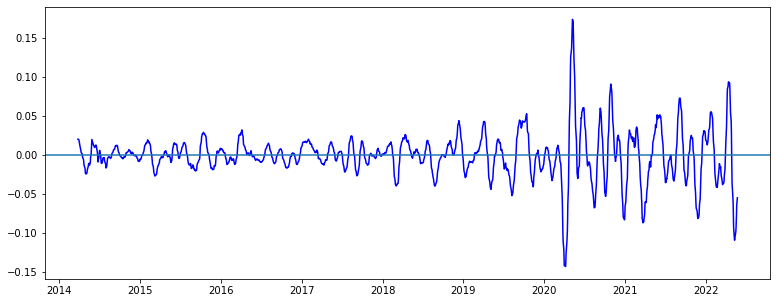

5 10 15 35


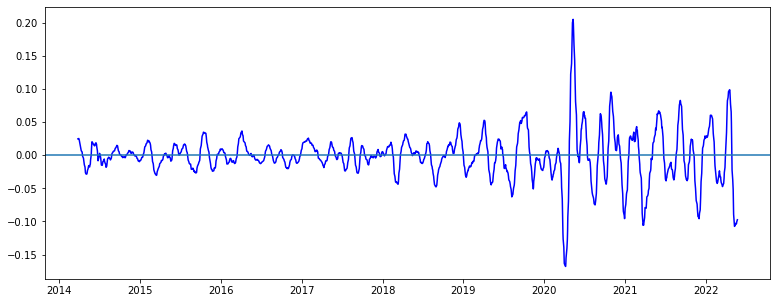

5 10 20 25


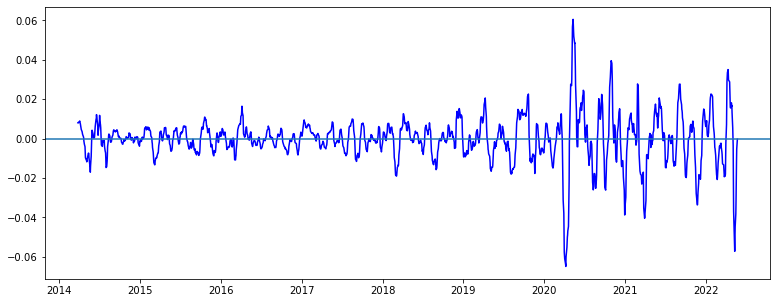

5 10 20 30


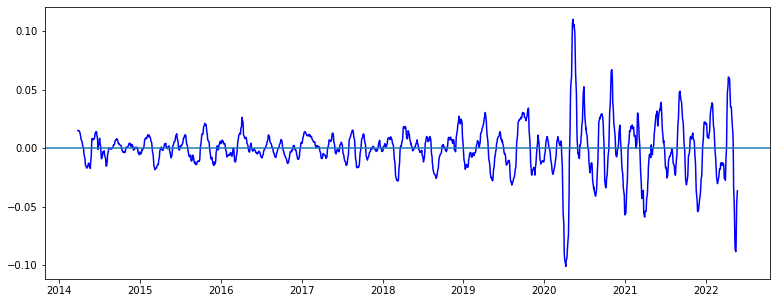

5 10 20 35


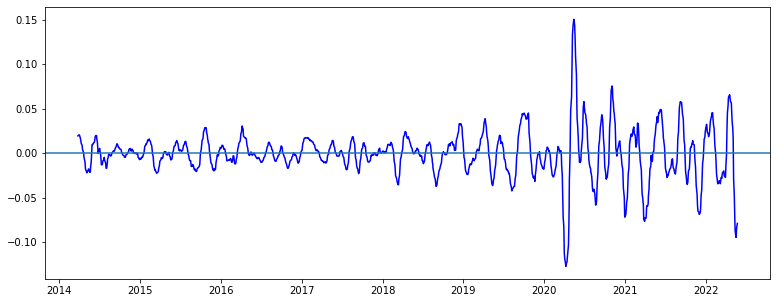

5 10 25 30


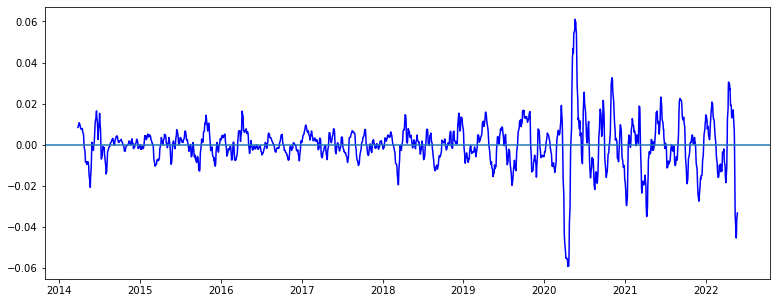

5 10 25 35


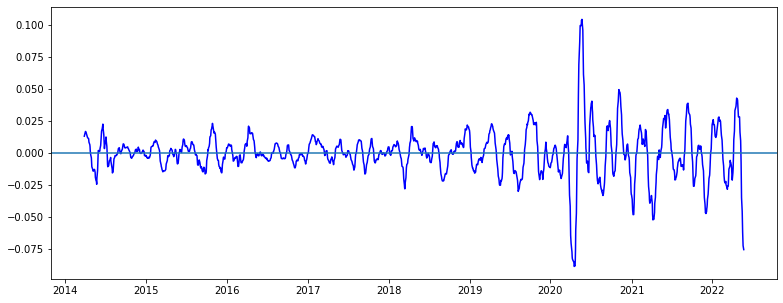

5 10 30 35


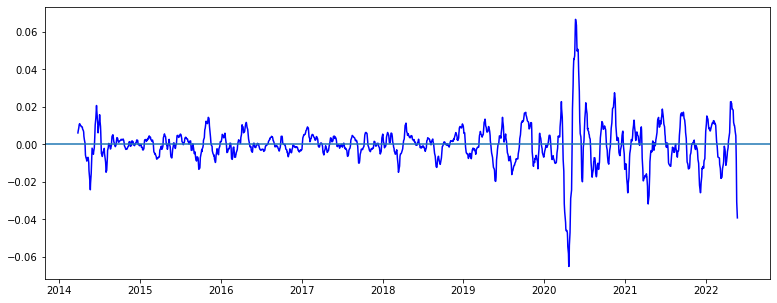

5 15 5 10


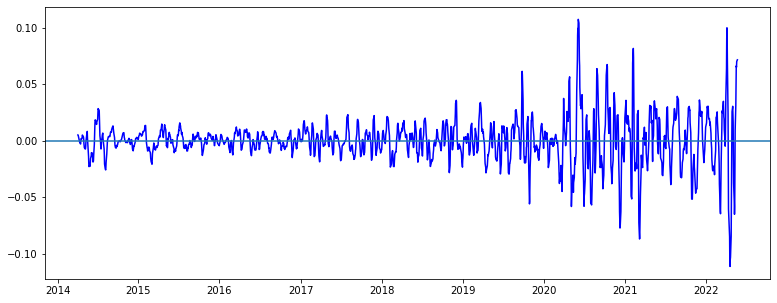

5 15 5 15


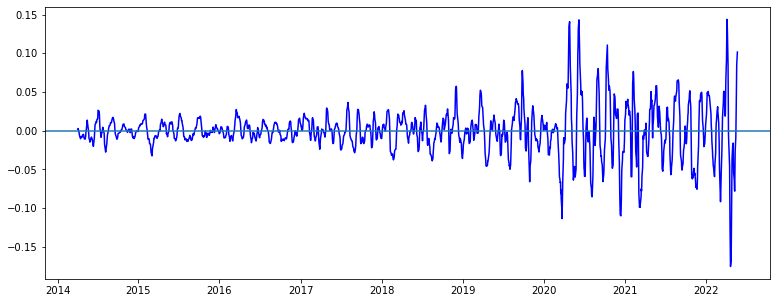

5 15 5 20


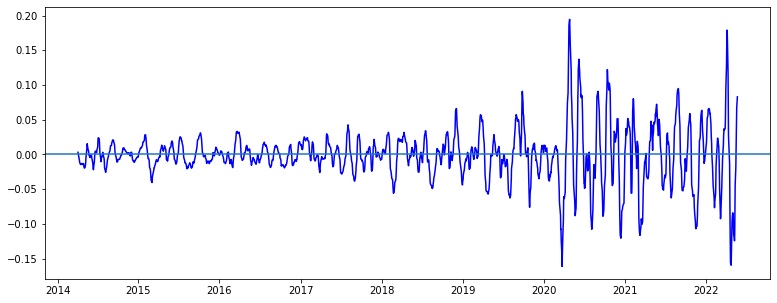

5 15 5 25


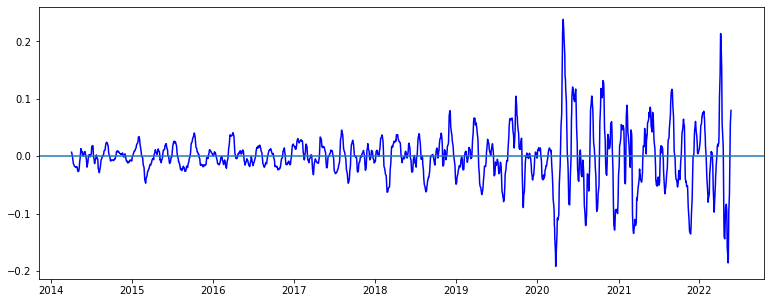

5 15 5 30


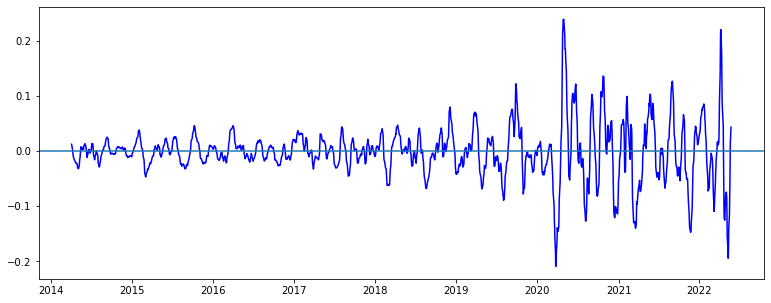

5 15 5 35


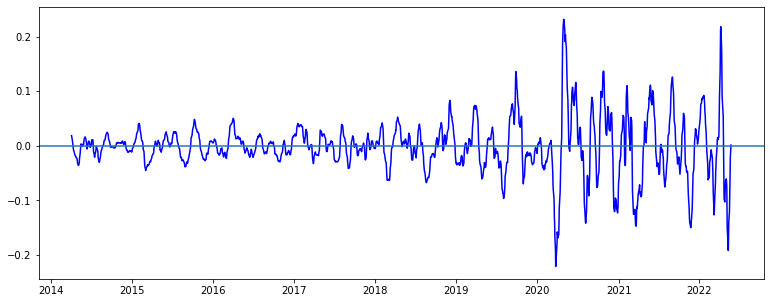

5 15 10 15


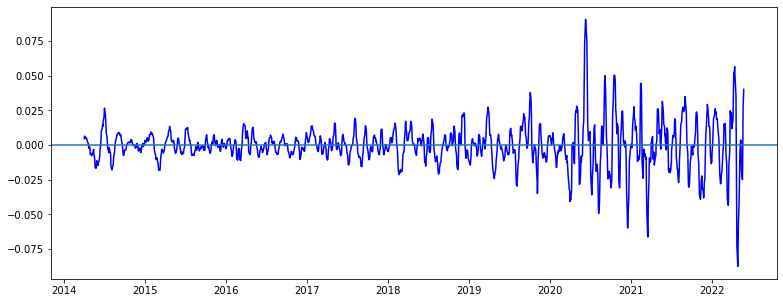

5 15 10 20


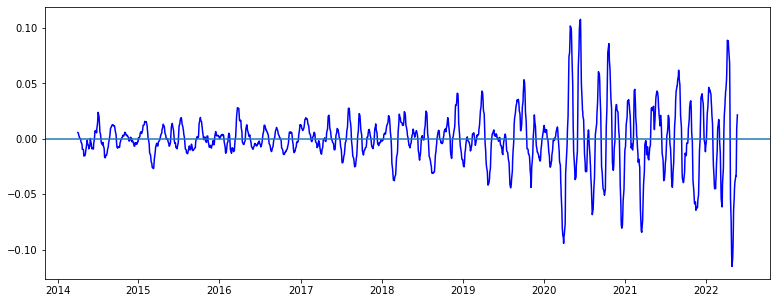

5 15 10 25


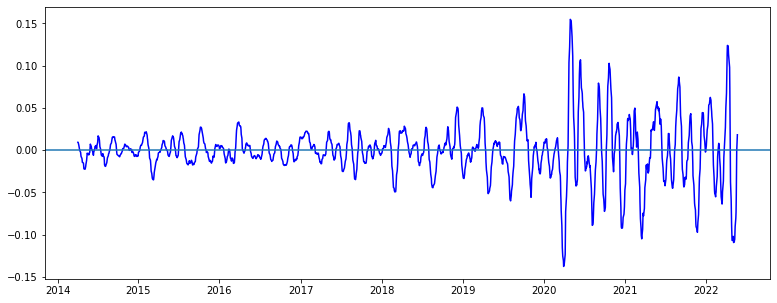

5 15 10 30


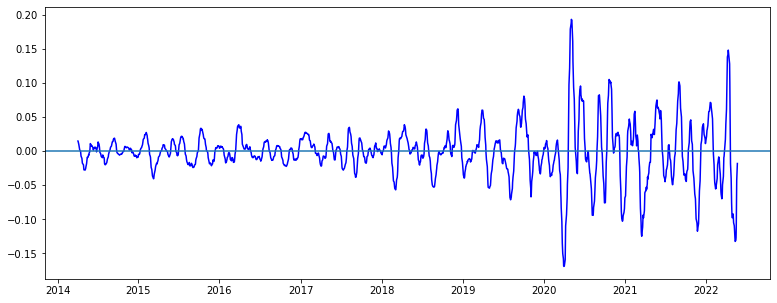

5 15 10 35


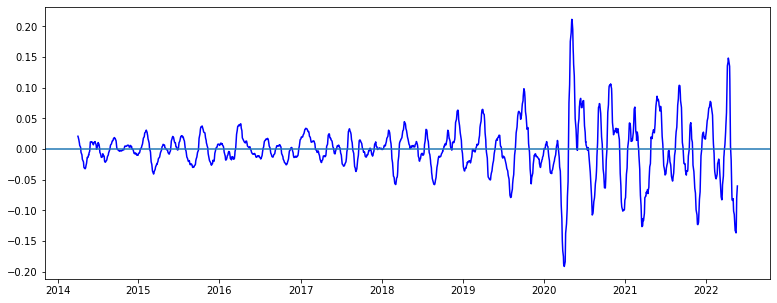

5 15 15 20


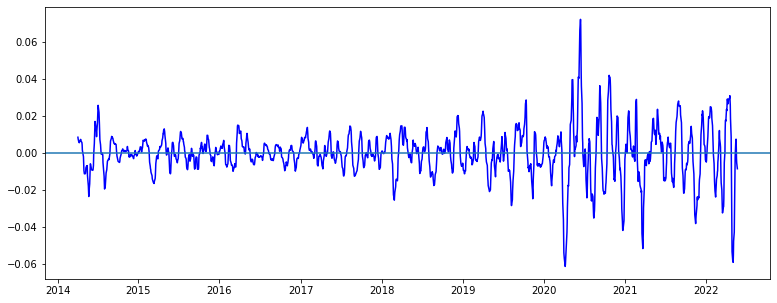

5 15 15 25


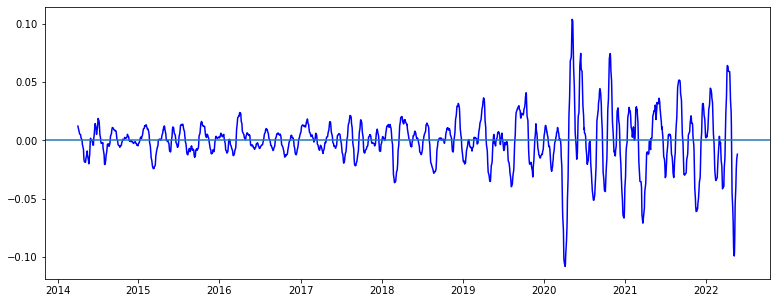

5 15 15 30


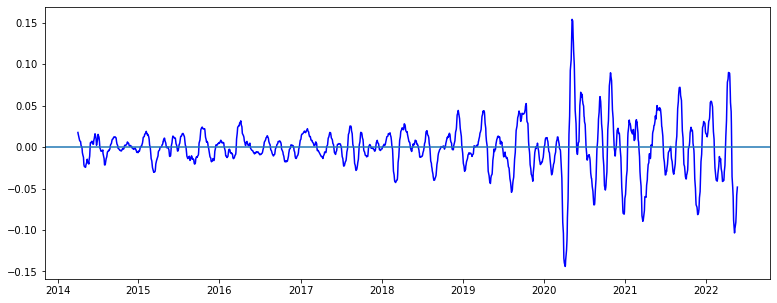

5 15 15 35


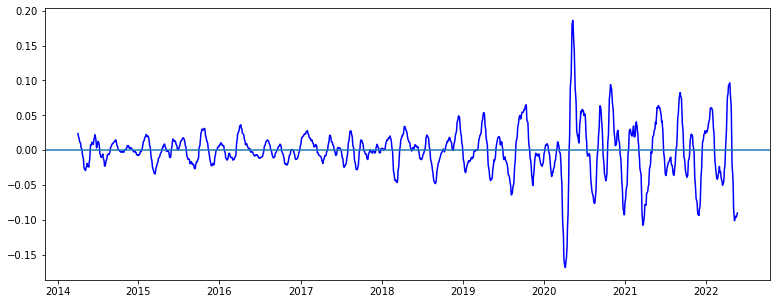

5 15 20 25


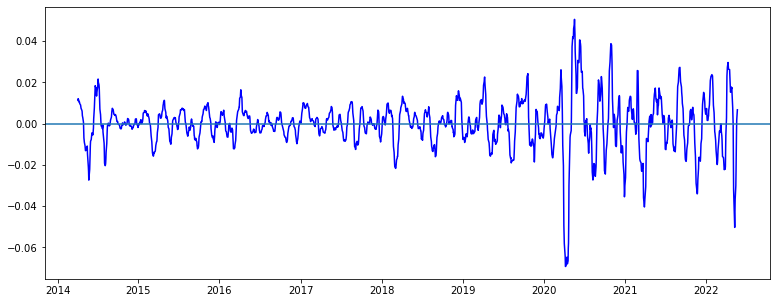

5 15 20 30


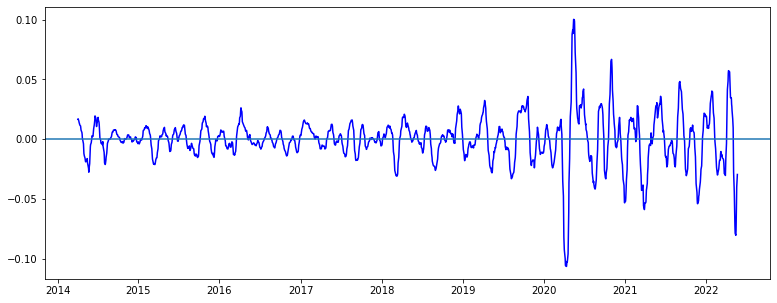

5 15 20 35


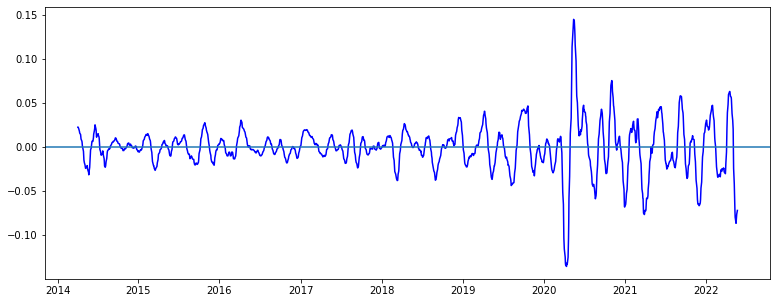

5 15 25 30


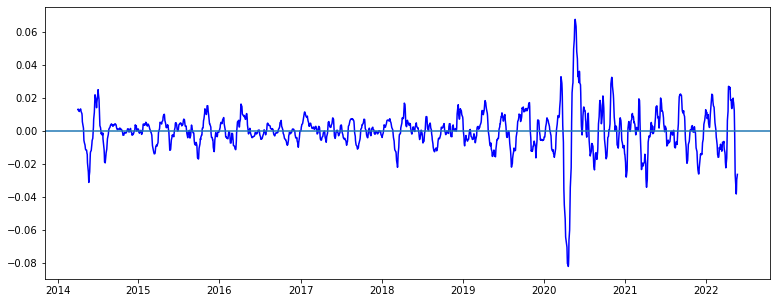

5 15 25 35


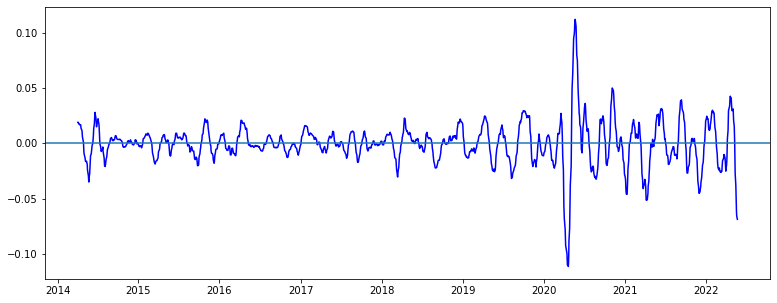

5 15 30 35


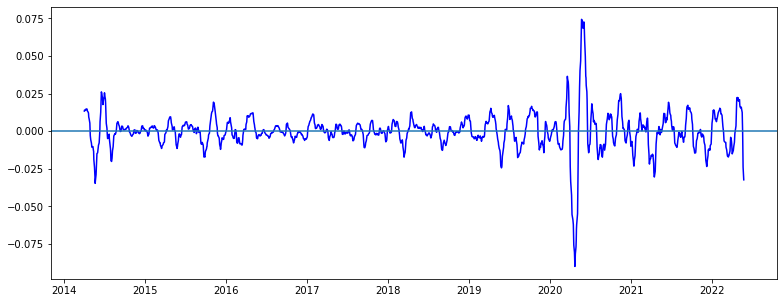

5 20 5 10


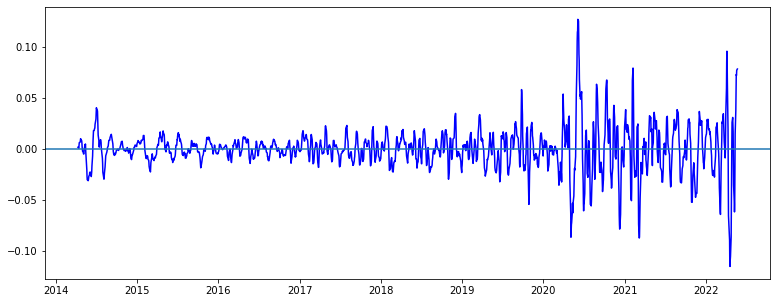

5 20 5 15


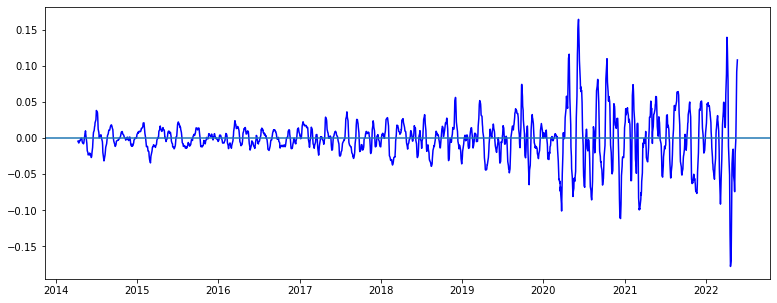

5 20 5 20


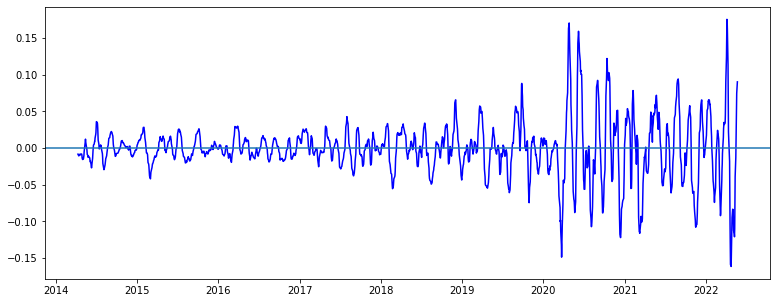

5 20 5 25


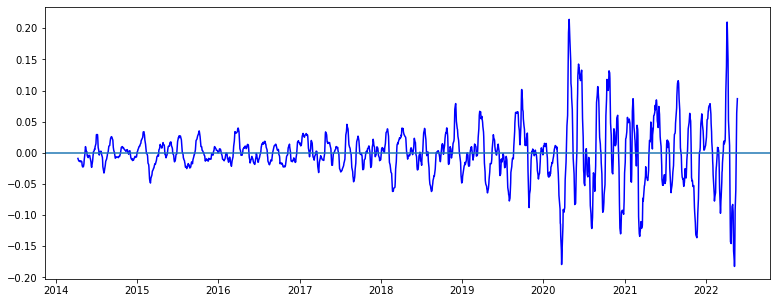

5 20 5 30


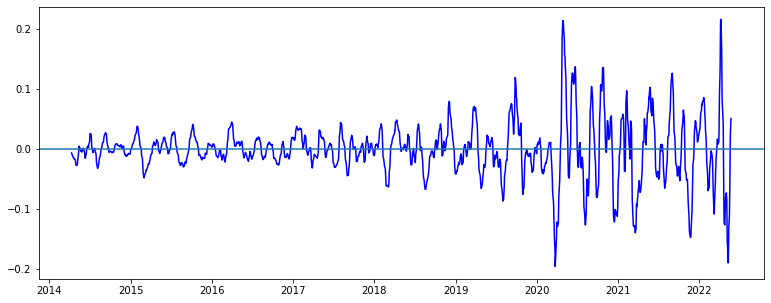

5 20 5 35


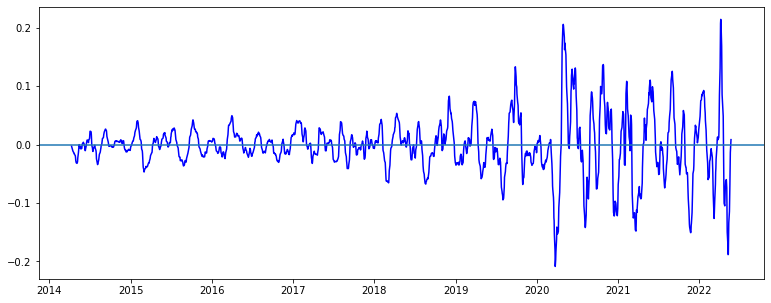

5 20 10 15


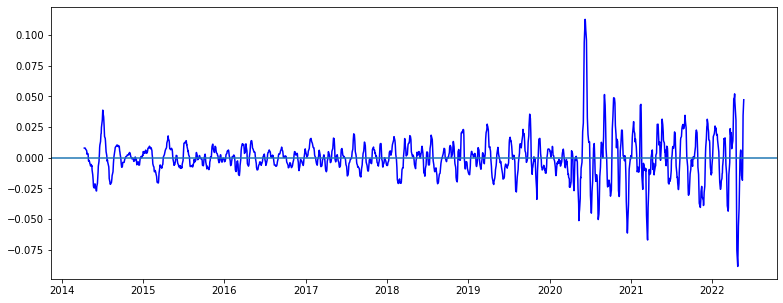

5 20 10 20


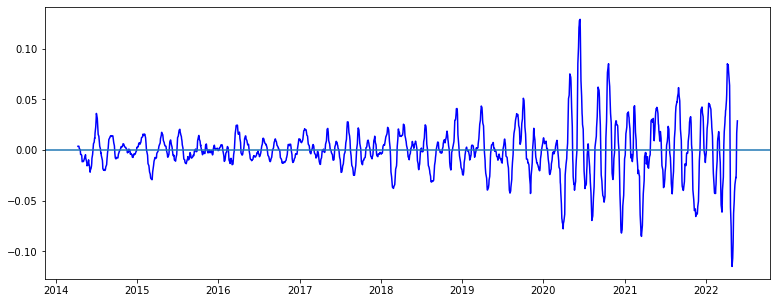

5 20 10 25


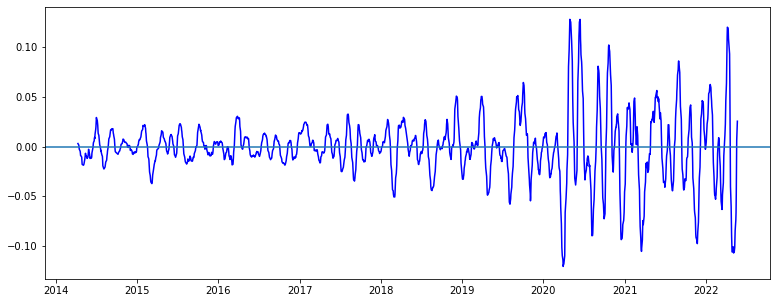

5 20 10 30


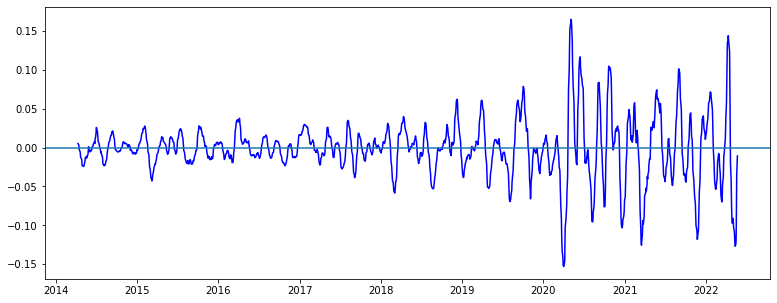

5 20 10 35


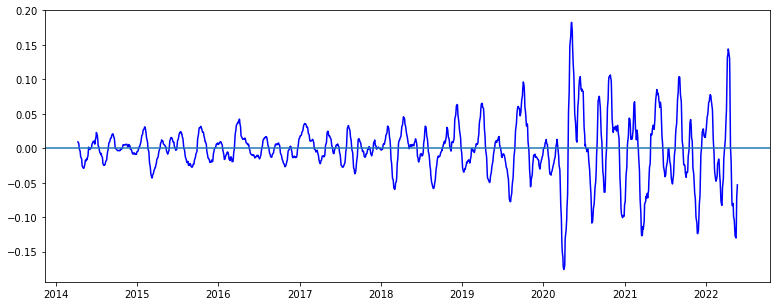

5 20 15 20


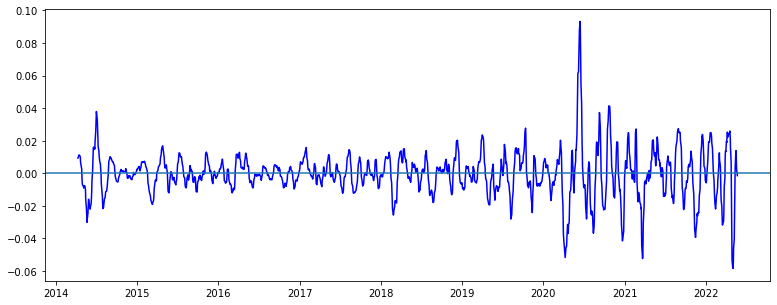

5 20 15 25


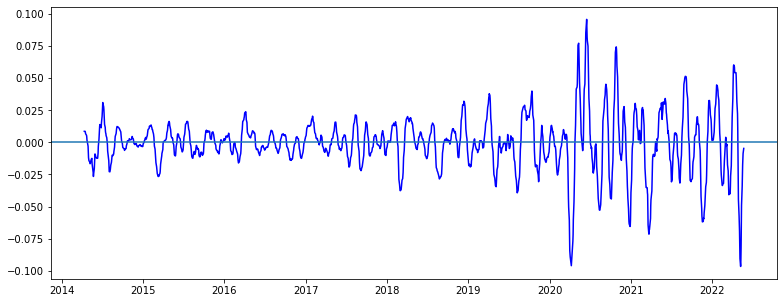

5 20 15 30


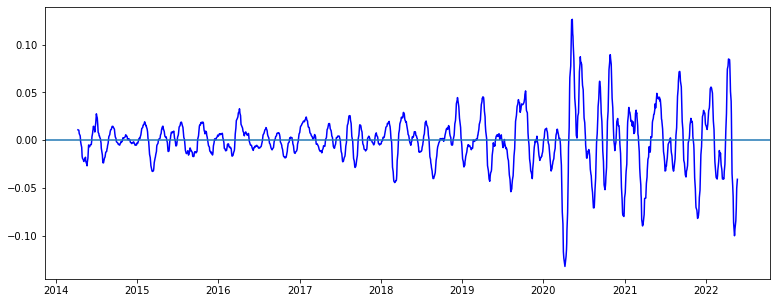

5 20 15 35


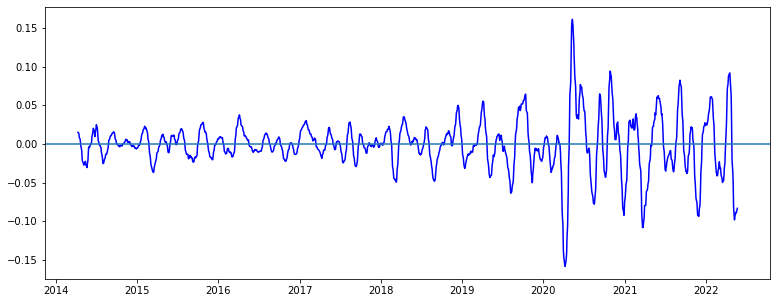

5 20 20 25


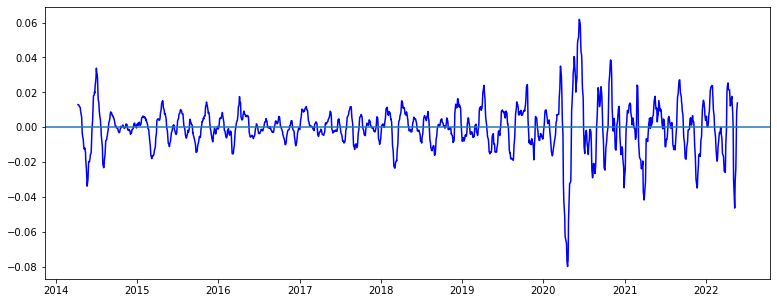

5 20 20 30


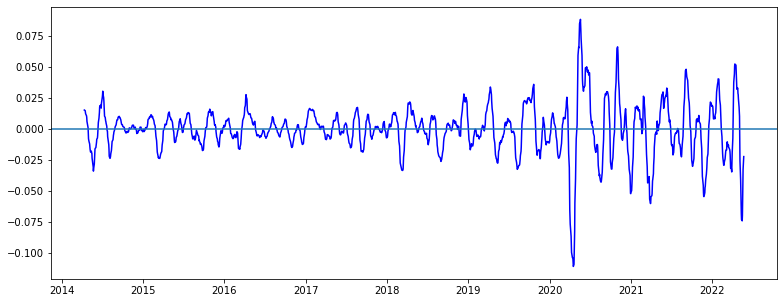

5 20 20 35


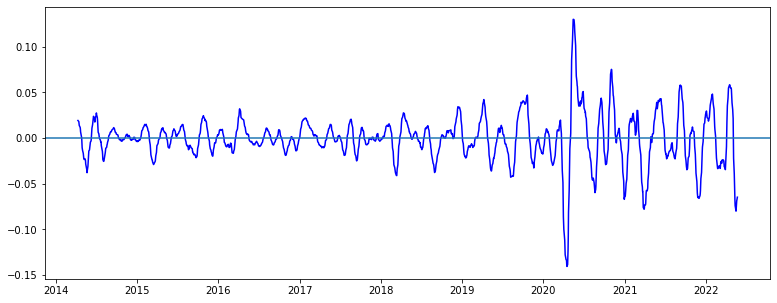

5 20 25 30


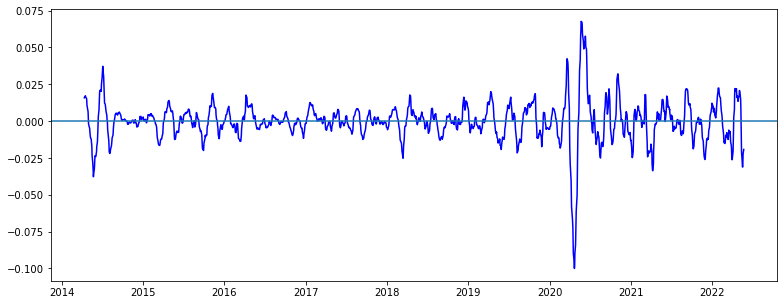

5 20 25 35


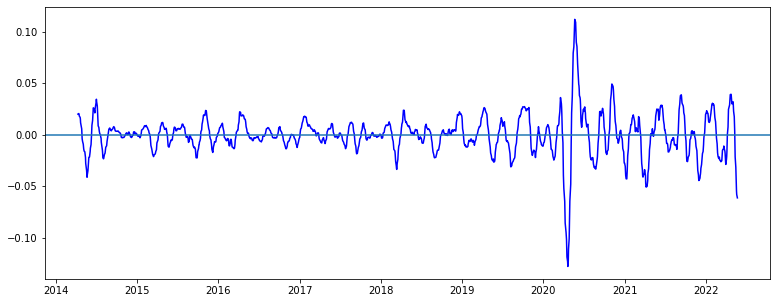

5 20 30 35


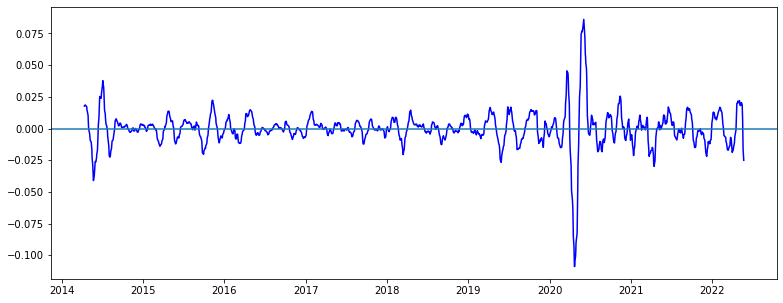

5 25 5 10


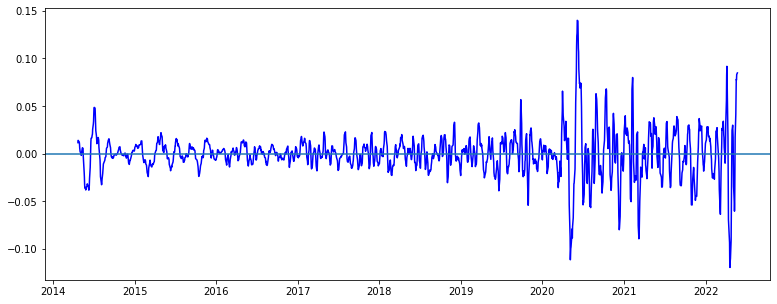

5 25 5 15


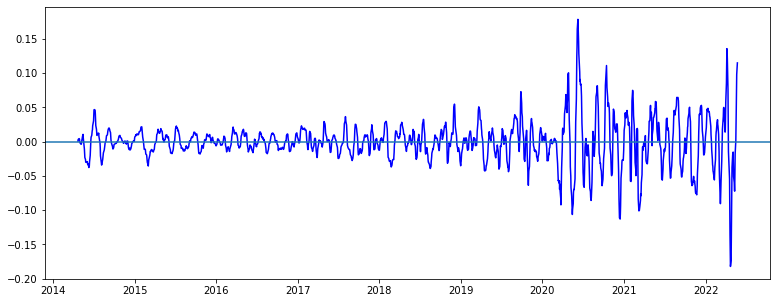

5 25 5 20


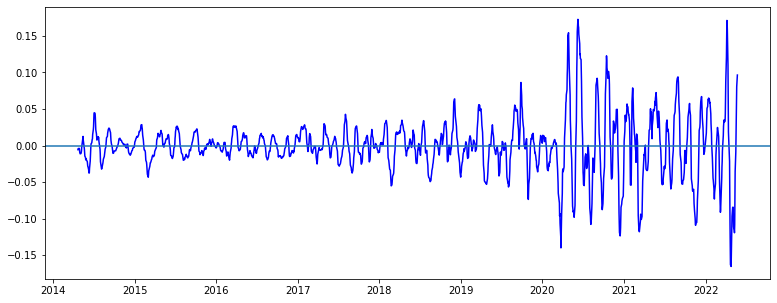

5 25 5 25


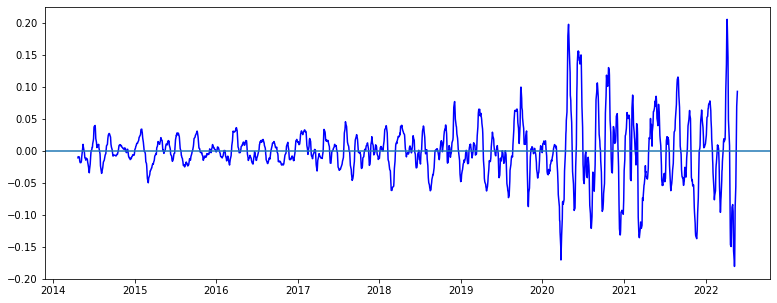

5 25 5 30


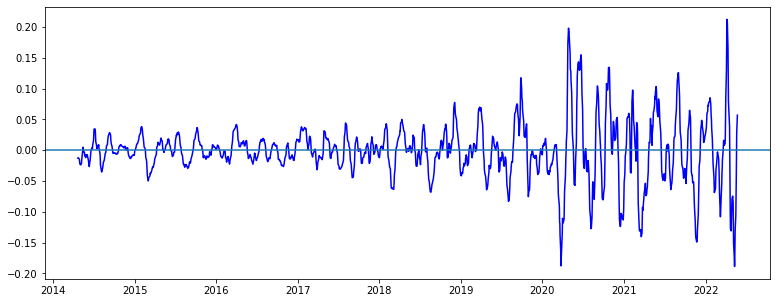

5 25 5 35


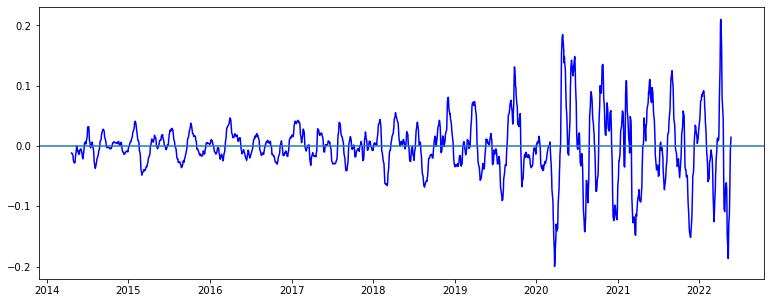

5 25 10 15


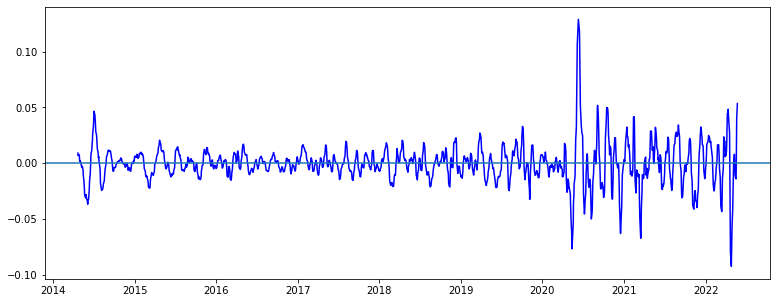

5 25 10 20


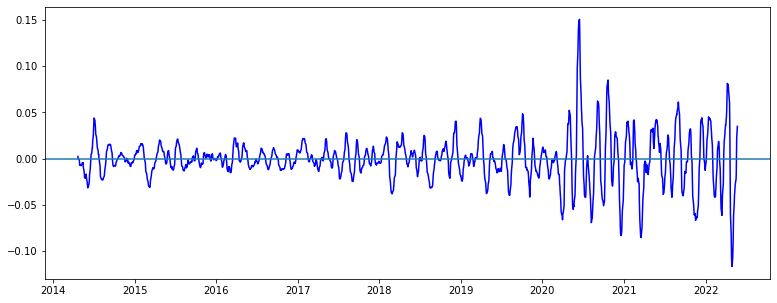

5 25 10 25


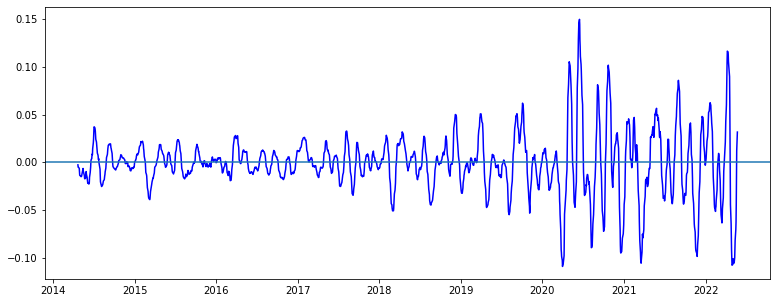

5 25 10 30


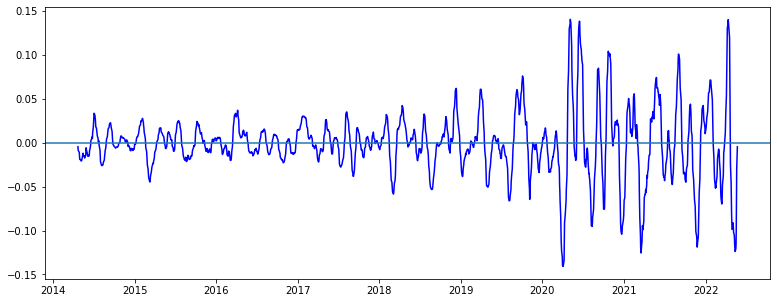

5 25 10 35


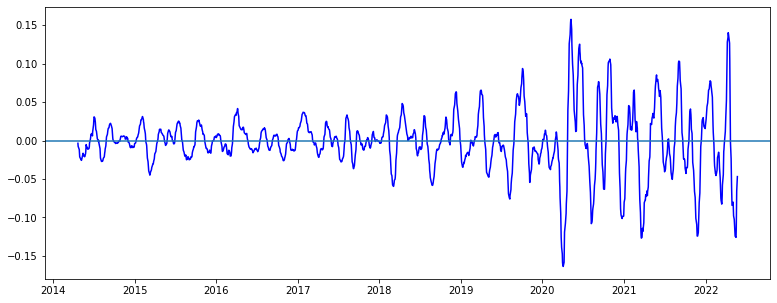

5 25 15 20


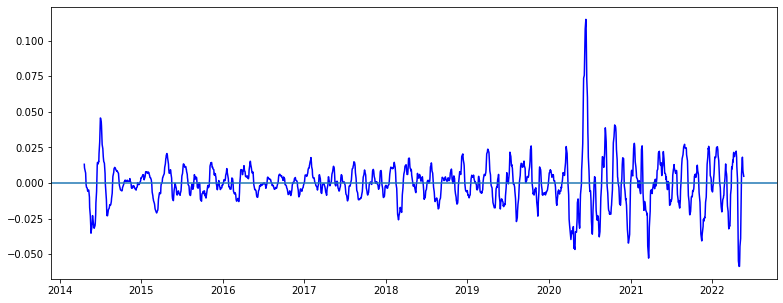

5 25 15 25


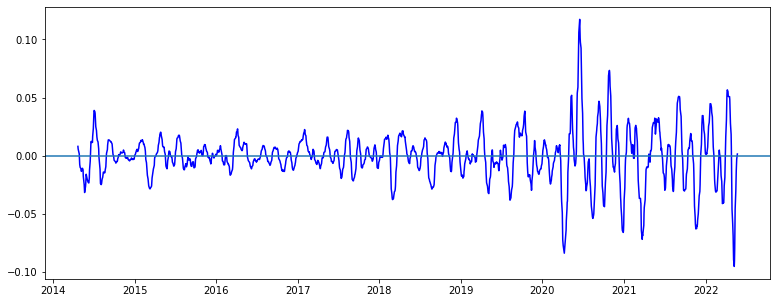

5 25 15 30


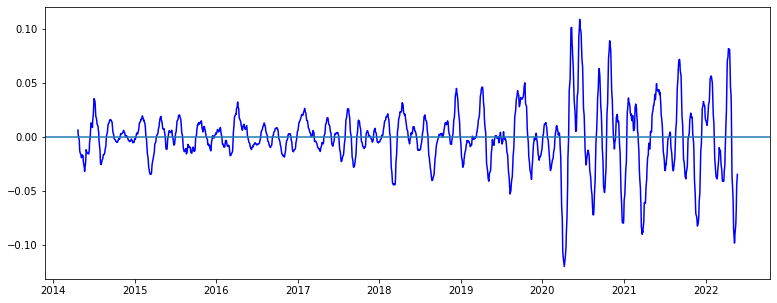

5 25 15 35


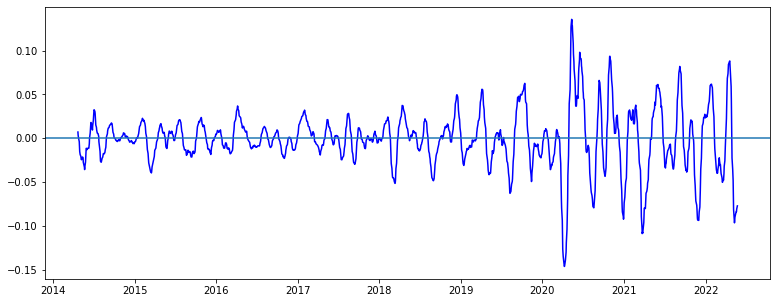

5 25 20 25


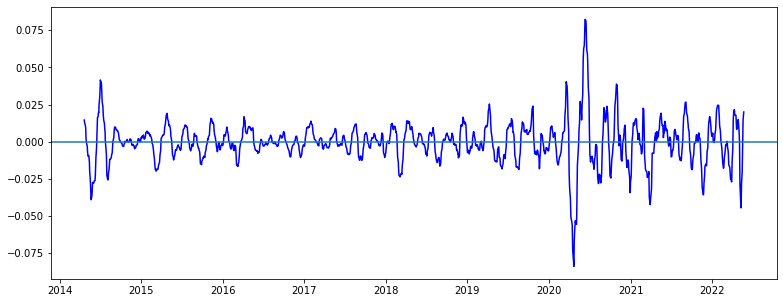

5 25 20 30


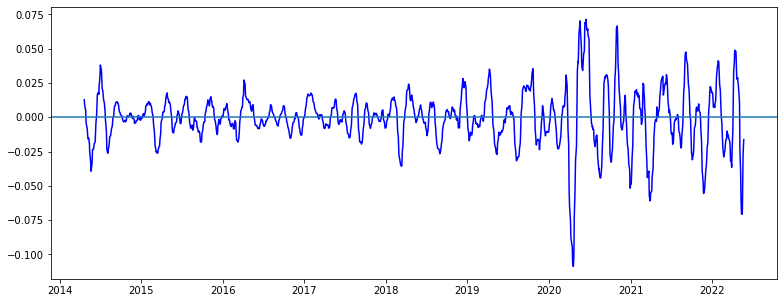

5 25 20 35


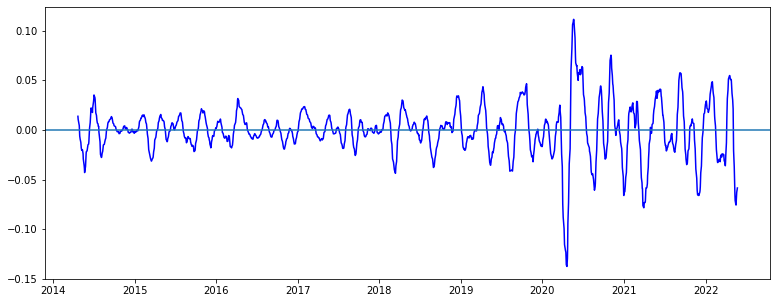

5 25 25 30


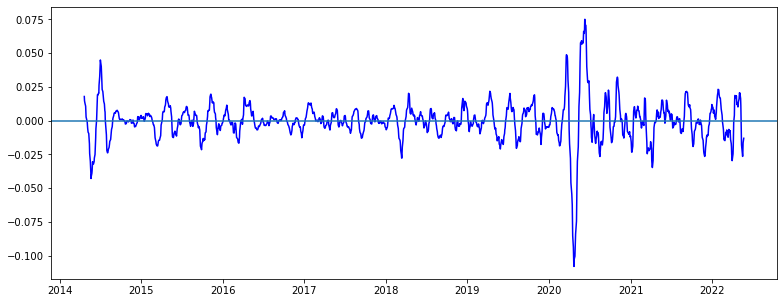

5 25 25 35


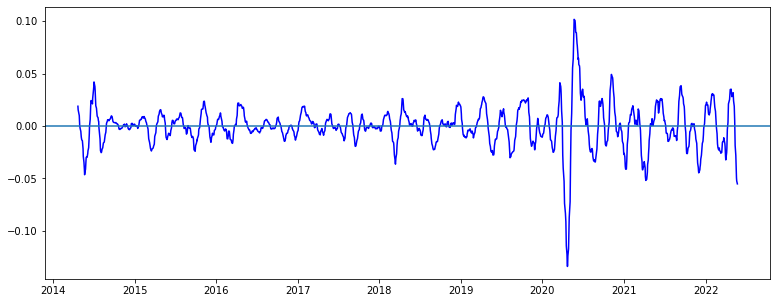

5 25 30 35


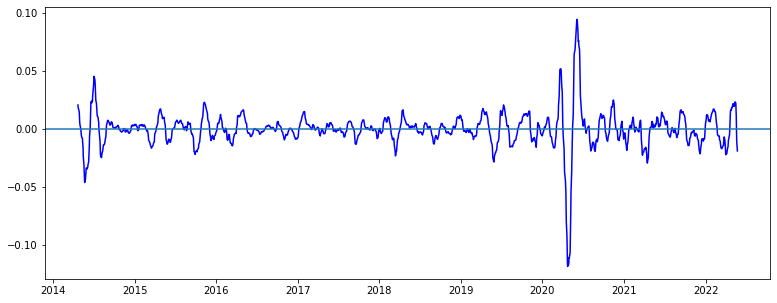

5 30 5 10


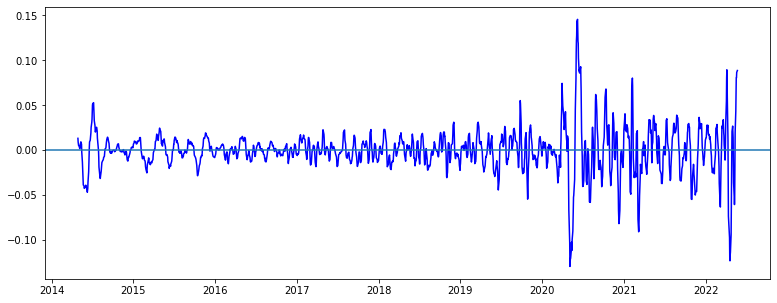

5 30 5 15


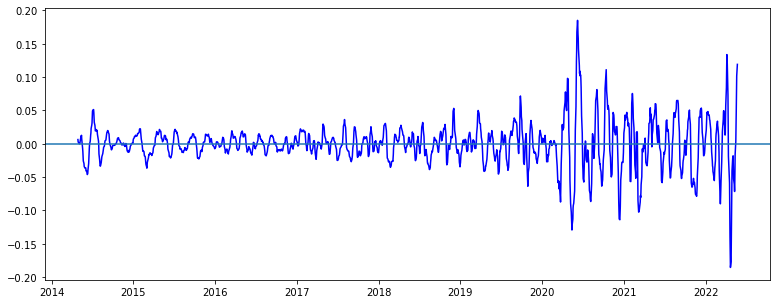

5 30 5 20


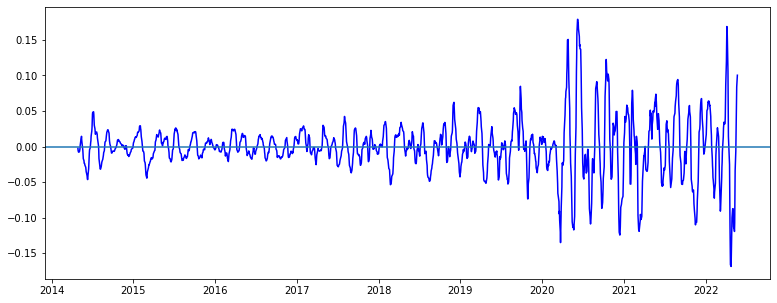

5 30 5 25


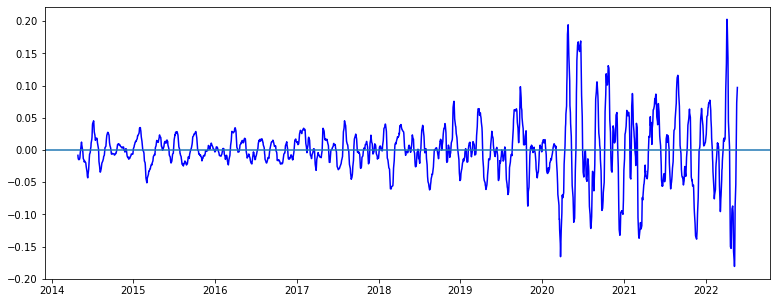

5 30 5 30


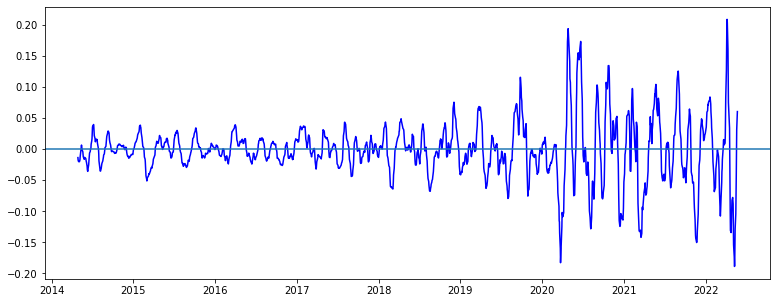

5 30 5 35


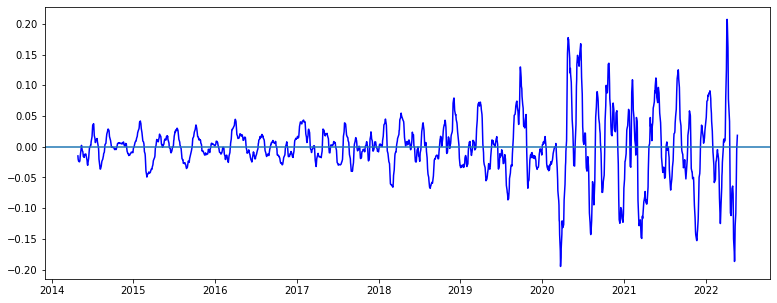

5 30 10 15


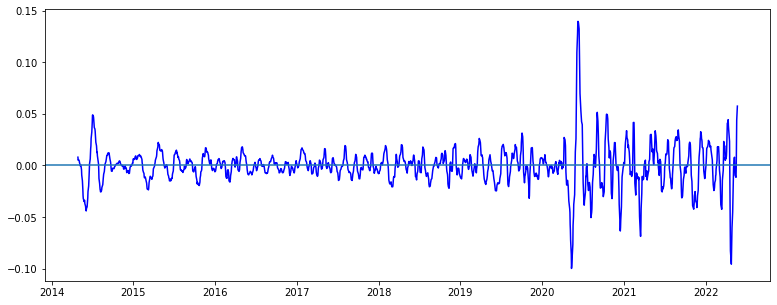

5 30 10 20


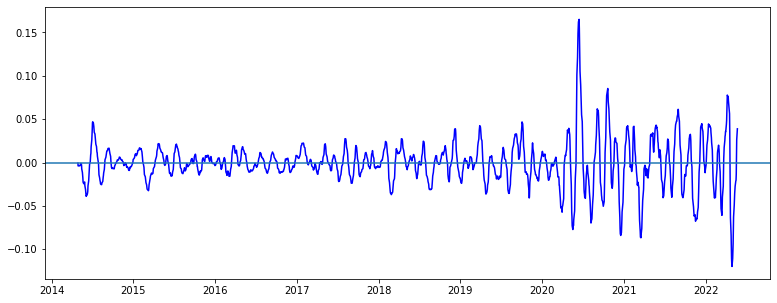

5 30 10 25


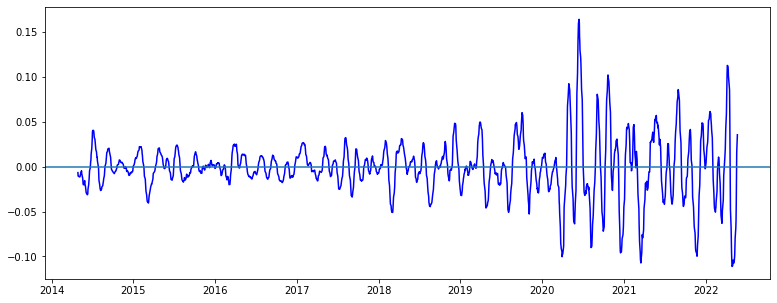

5 30 10 30


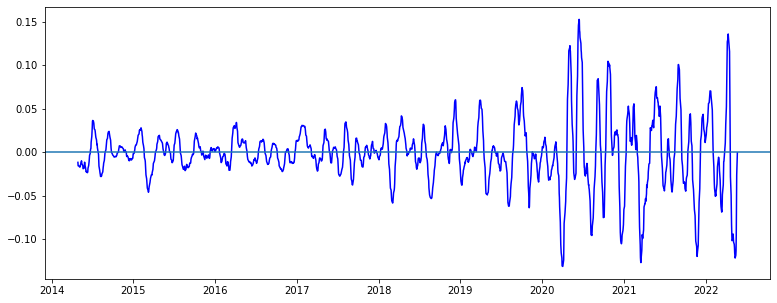

5 30 10 35


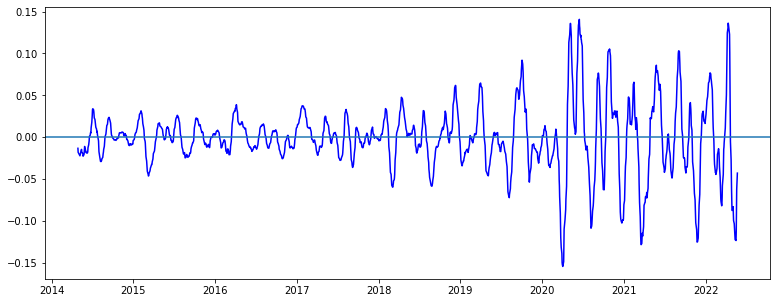

5 30 15 20


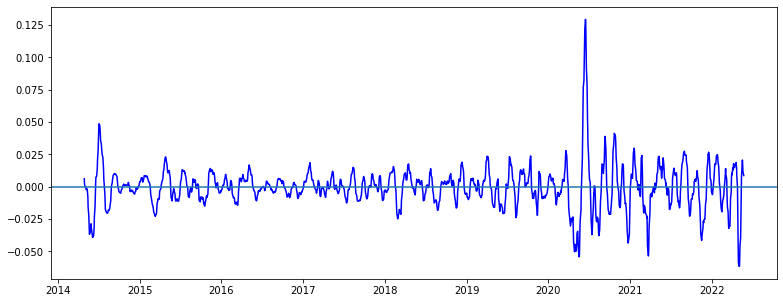

5 30 15 25


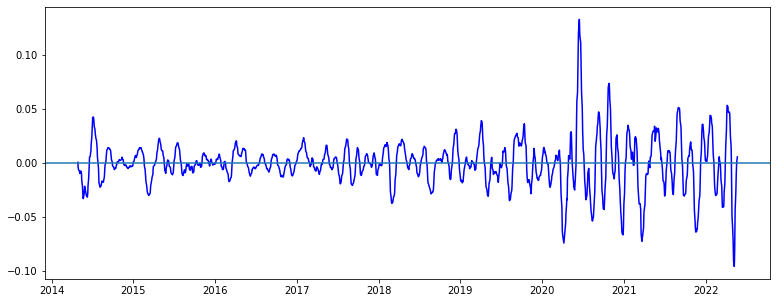

5 30 15 30


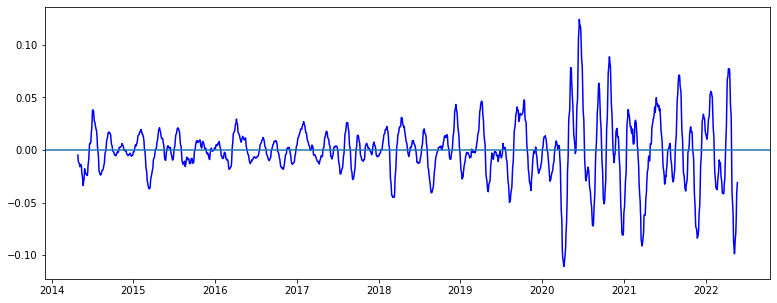

5 30 15 35


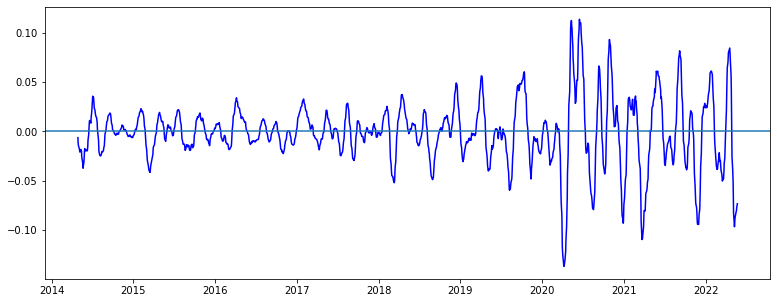

5 30 20 25


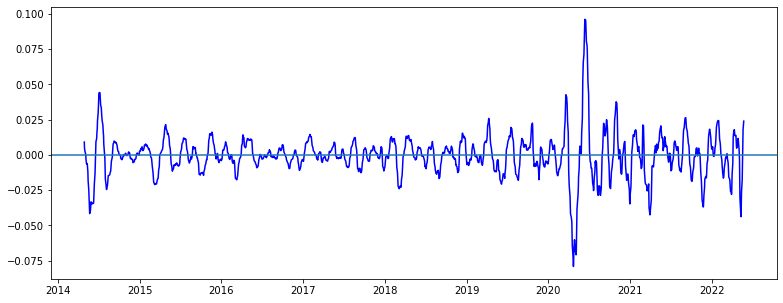

5 30 20 30


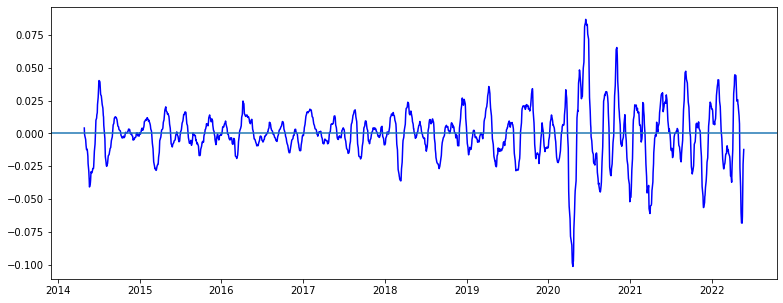

5 30 20 35


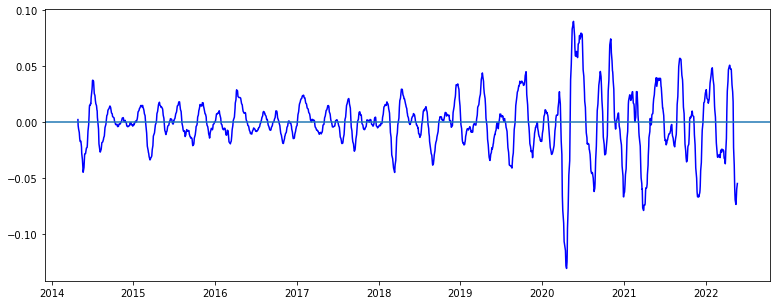

5 30 25 30


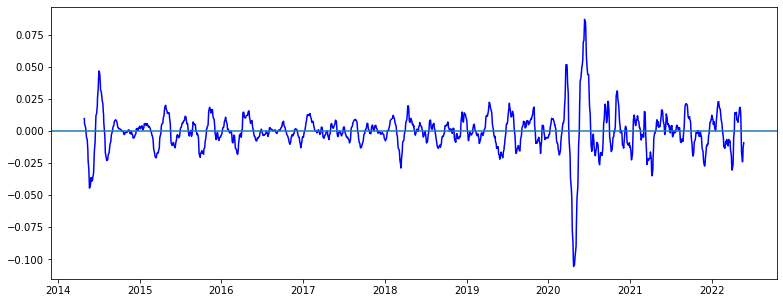

5 30 25 35


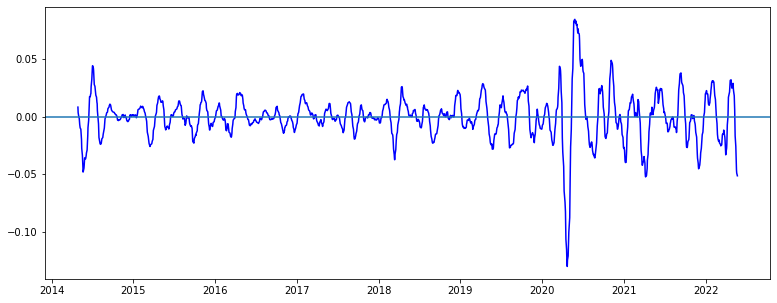

5 30 30 35


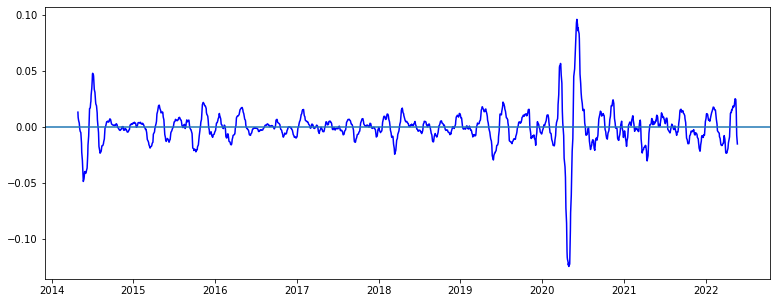

5 35 5 10


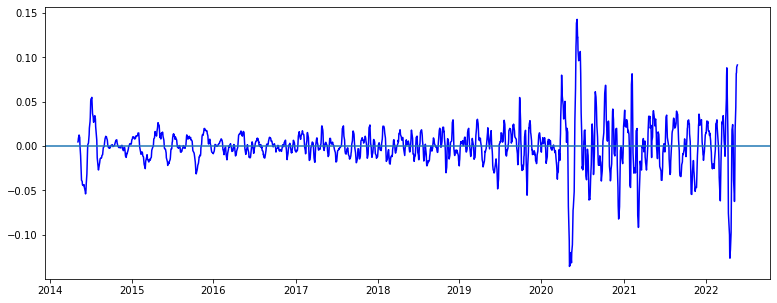

5 35 5 15


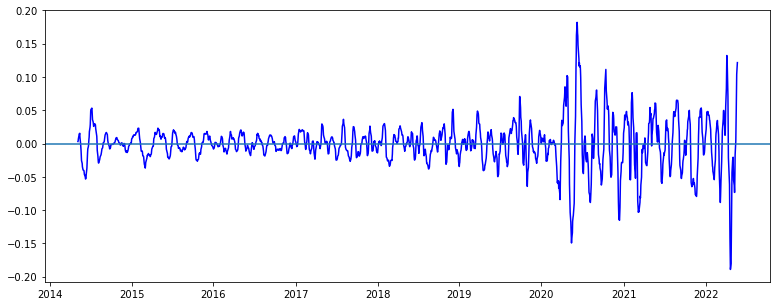

5 35 5 20


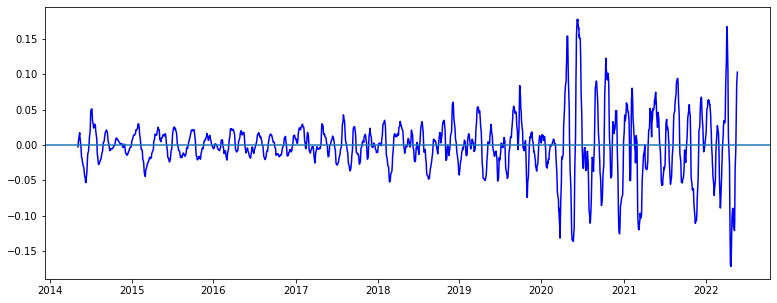

5 35 5 25


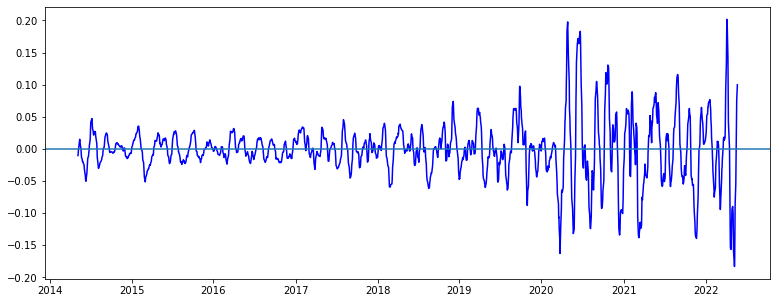

5 35 5 30


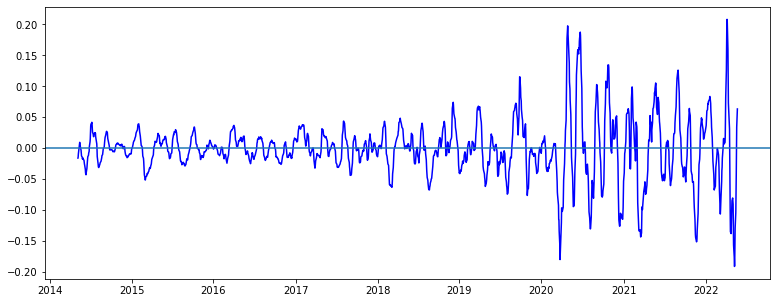

5 35 5 35


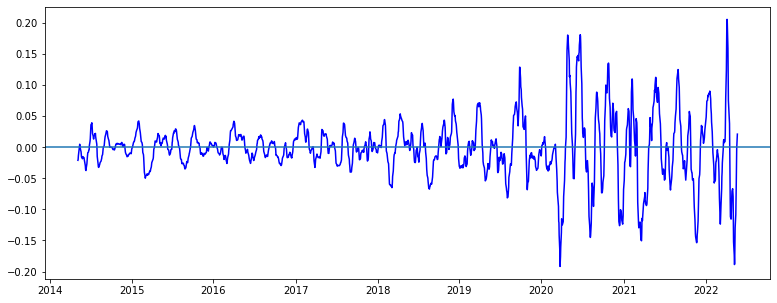

5 35 10 15


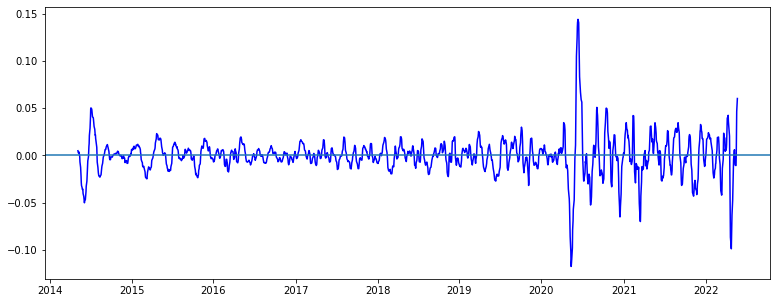

5 35 10 20


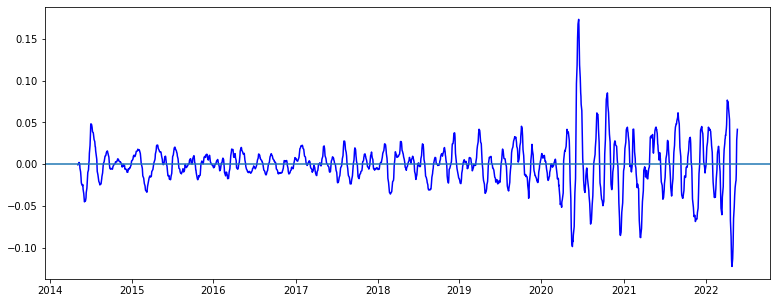

5 35 10 25


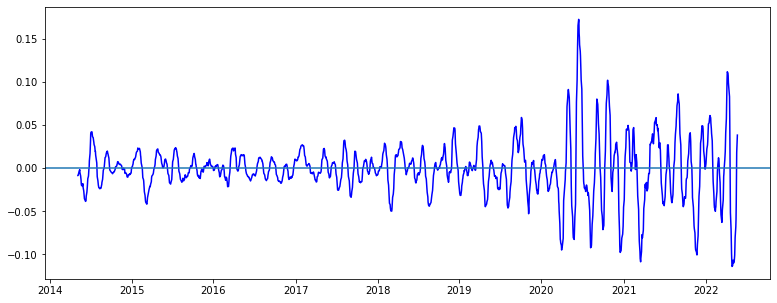

5 35 10 30


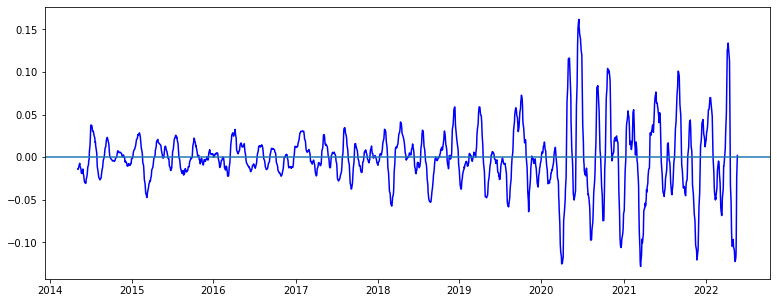

5 35 10 35


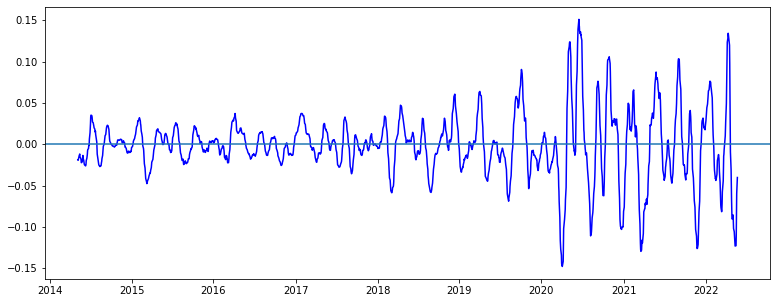

5 35 15 20


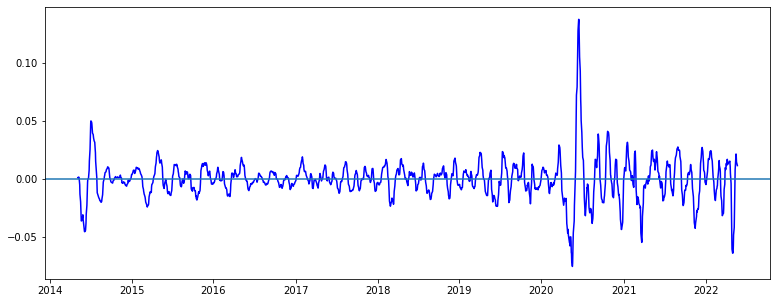

5 35 15 25


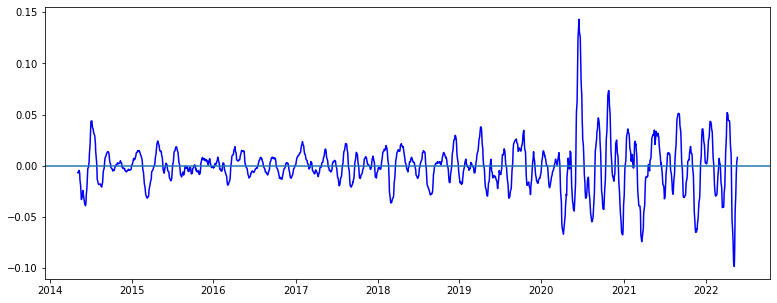

5 35 15 30


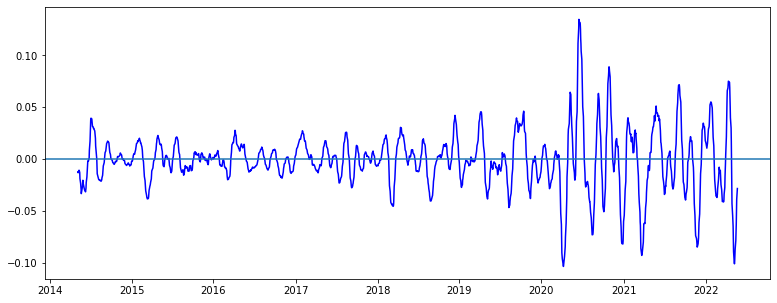

5 35 15 35


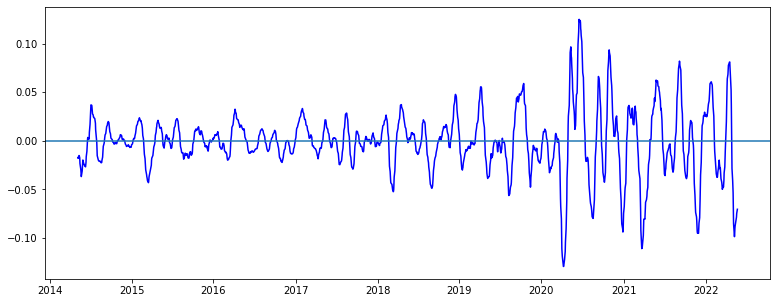

5 35 20 25


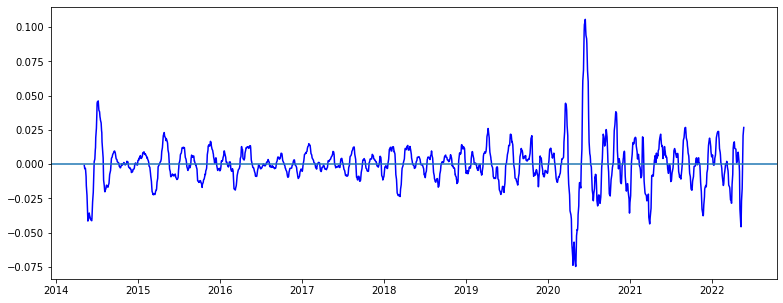

5 35 20 30


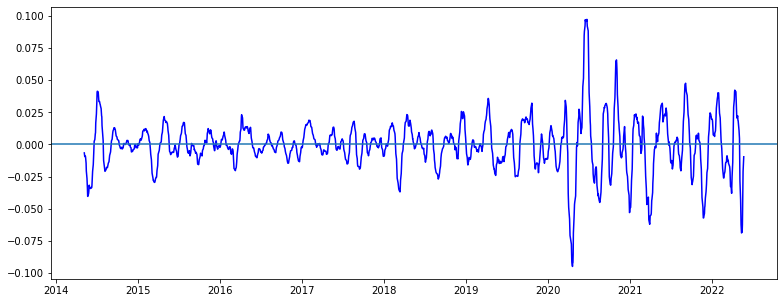

5 35 20 35


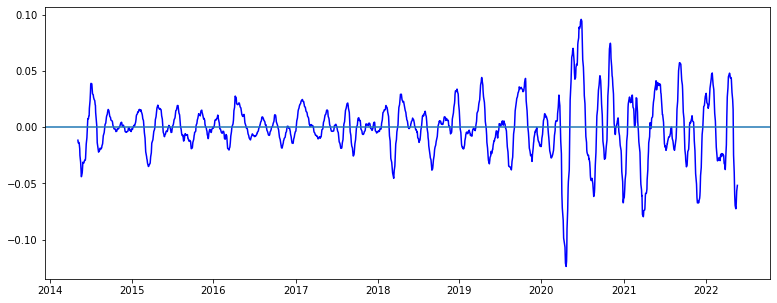

5 35 25 30


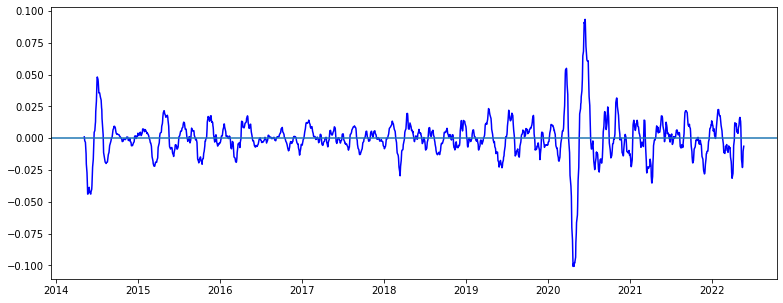

5 35 25 35


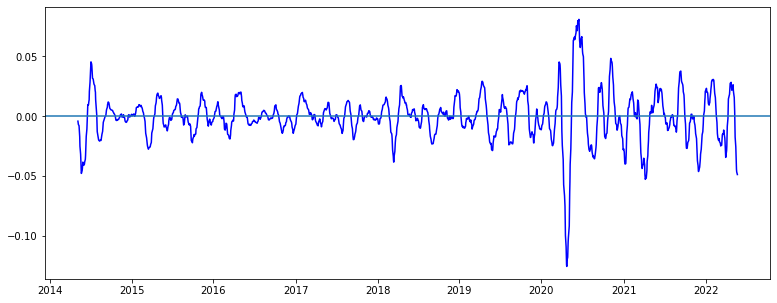

5 35 30 35


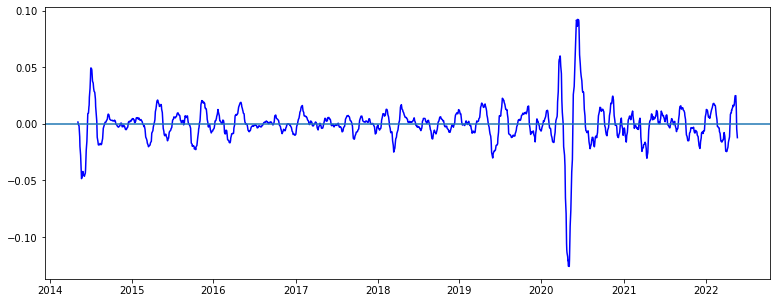

10 15 5 10


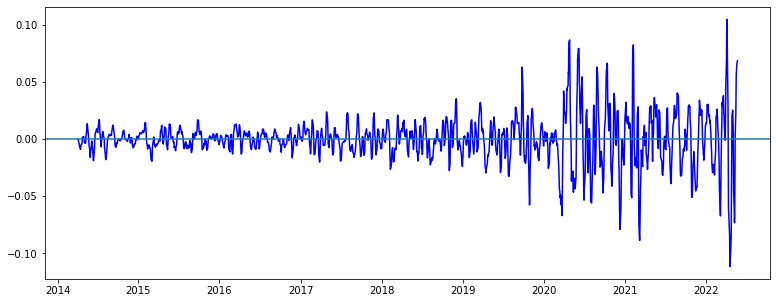

10 15 5 15


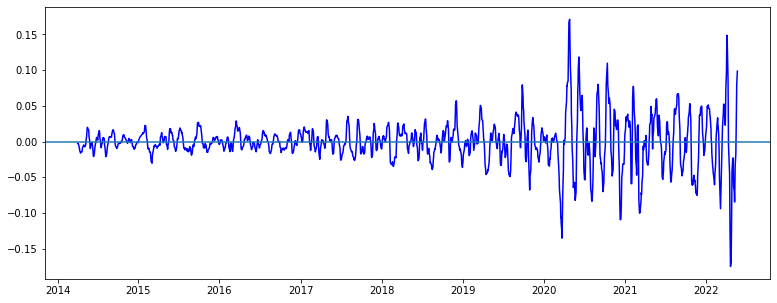

10 15 5 20


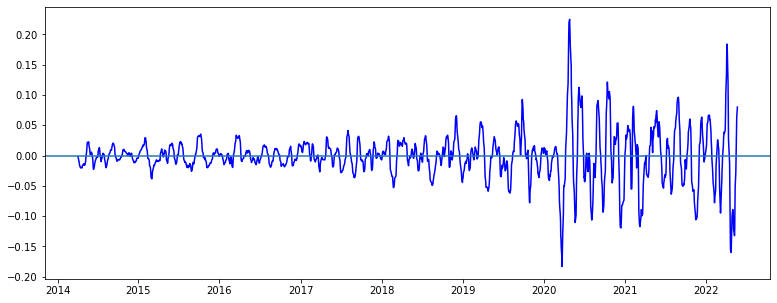

10 15 5 25


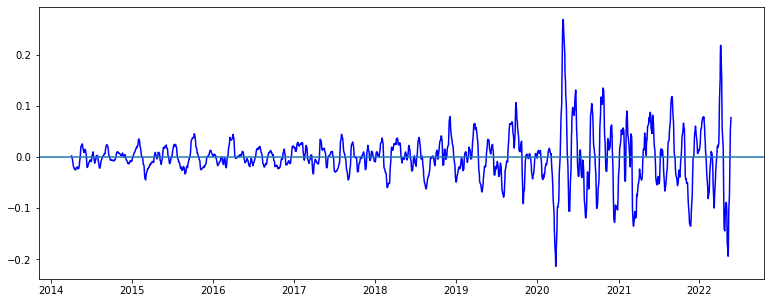

10 15 5 30


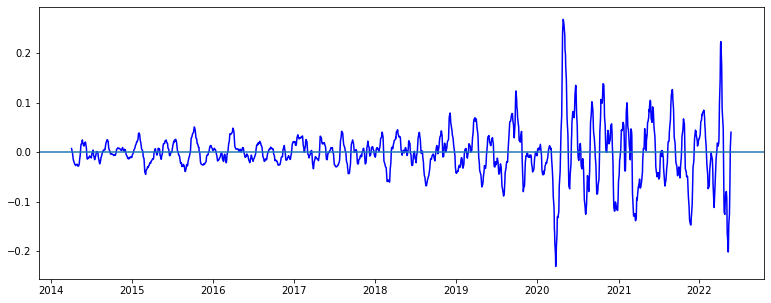

10 15 5 35


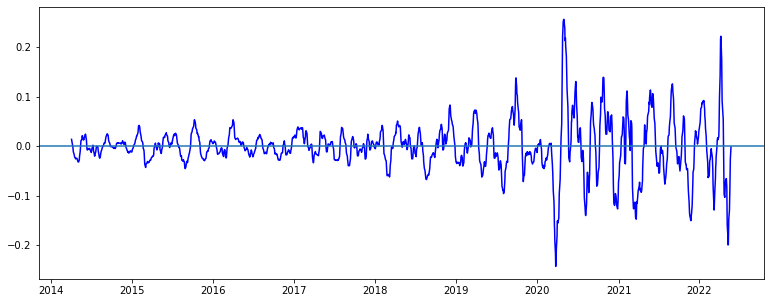

10 15 10 15


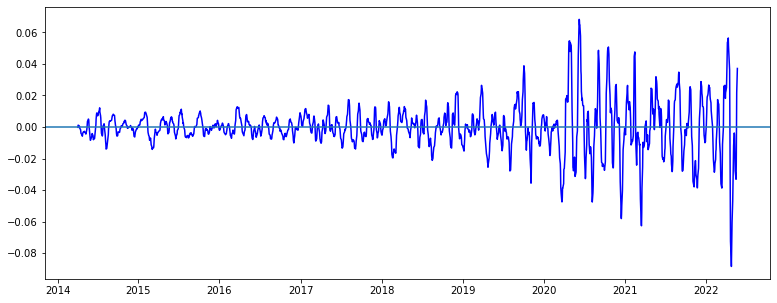

10 15 10 20


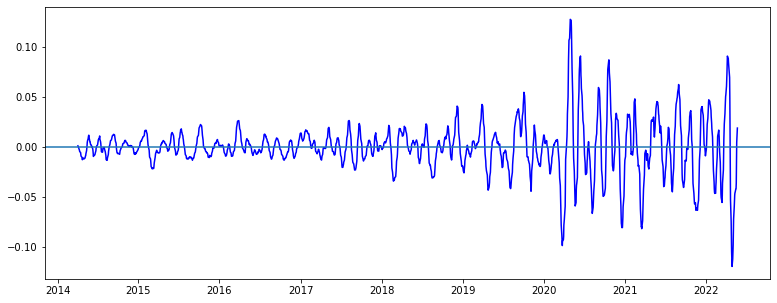

10 15 10 25


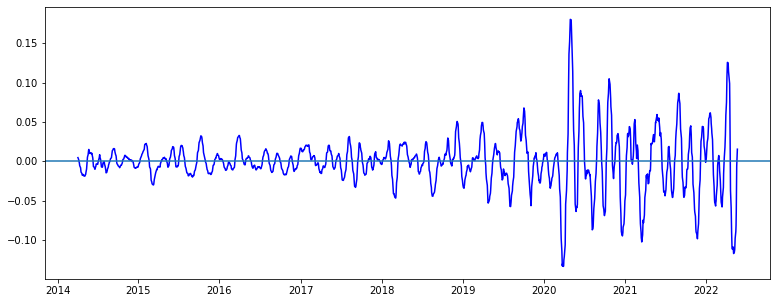

10 15 10 30


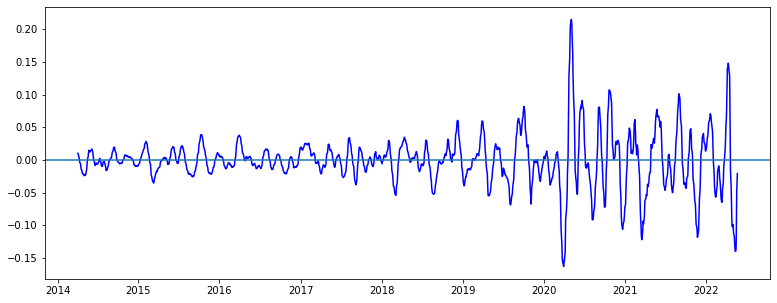

10 15 10 35


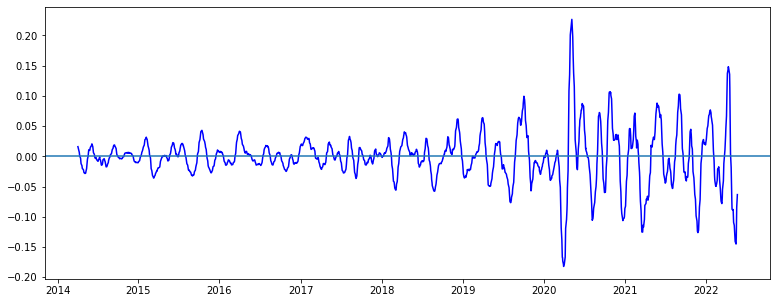

10 15 15 20


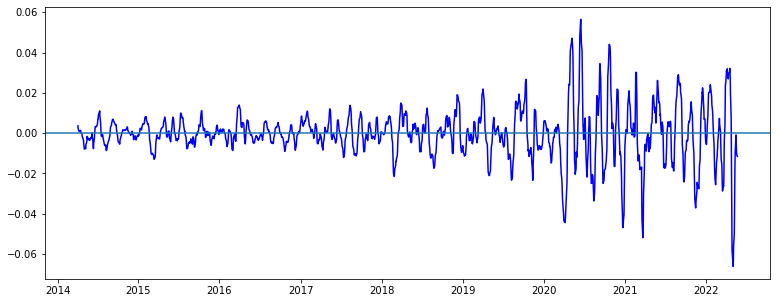

10 15 15 25


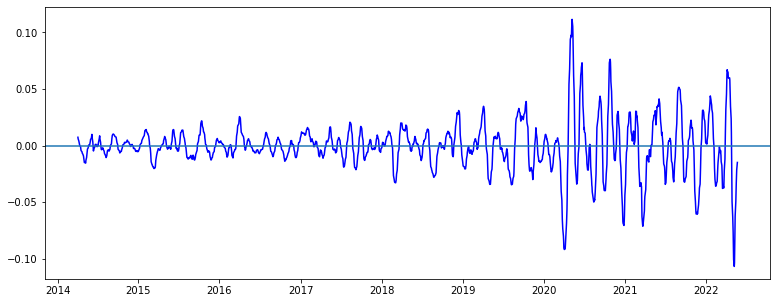

10 15 15 30


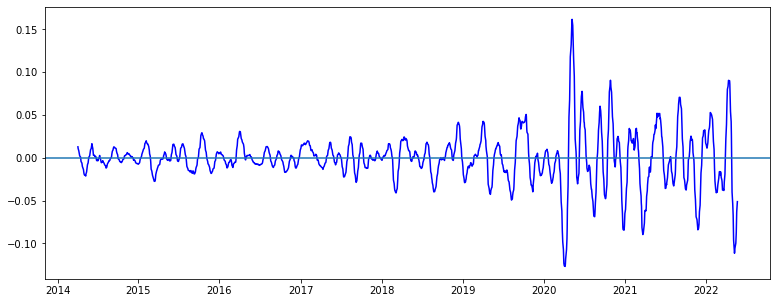

10 15 15 35


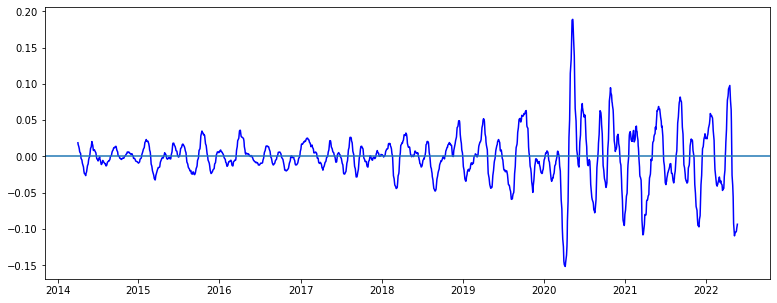

10 15 20 25


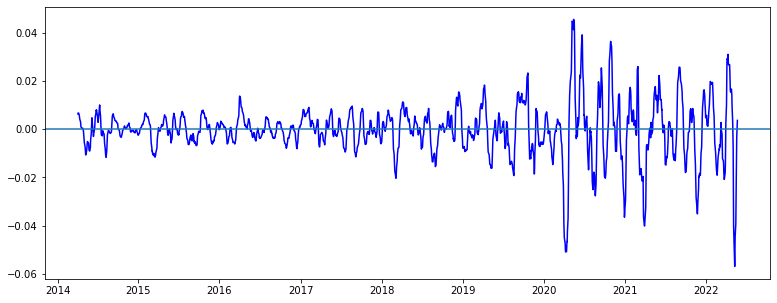

10 15 20 30


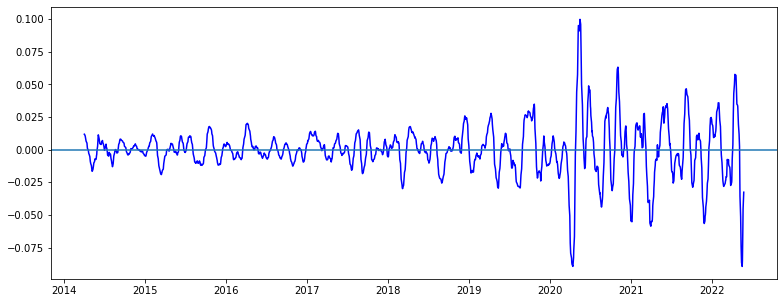

10 15 20 35


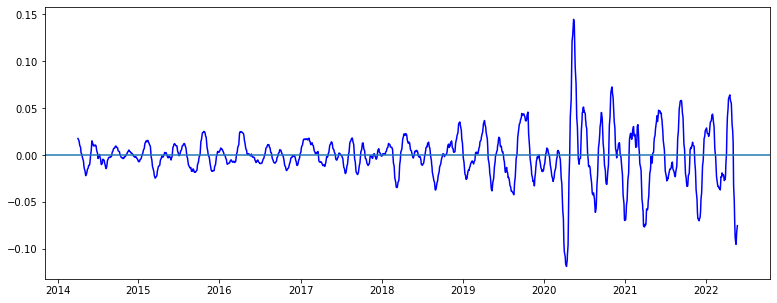

10 15 25 30


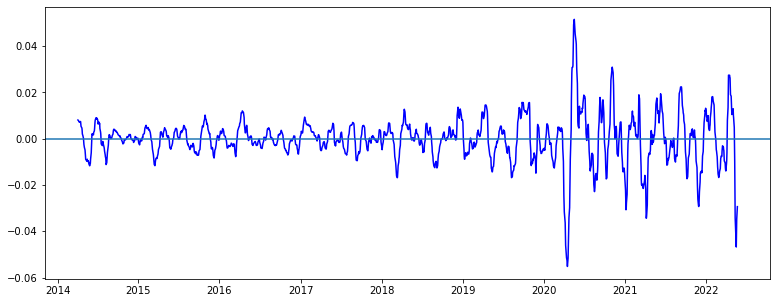

10 15 25 35


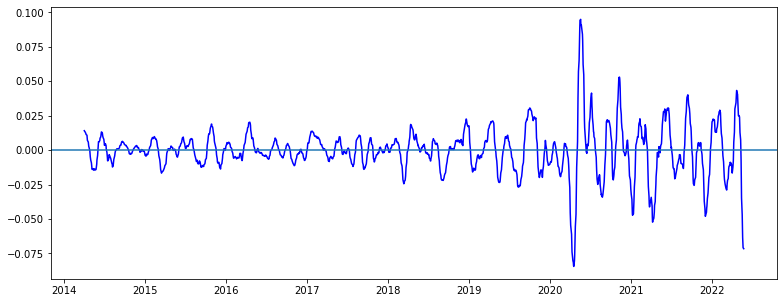

10 15 30 35


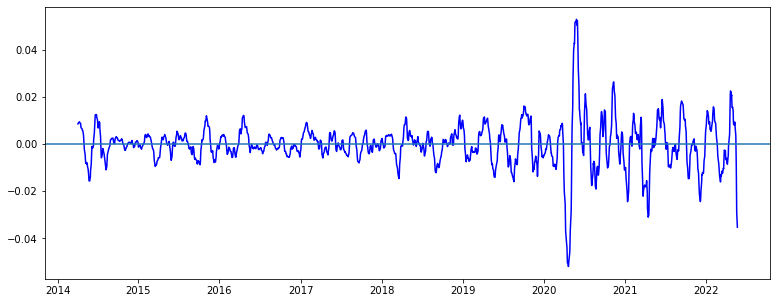

10 20 5 10


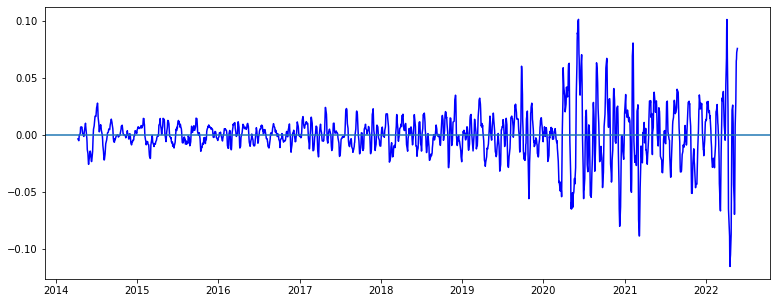

10 20 5 15


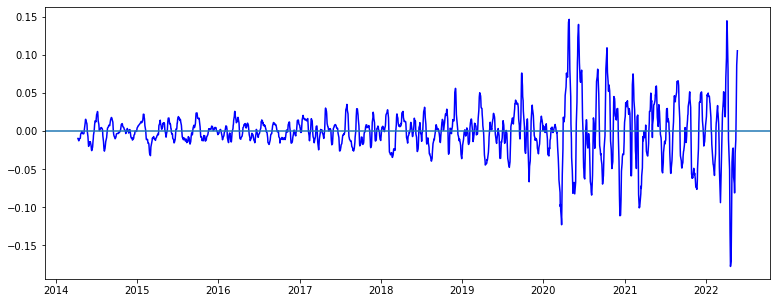

10 20 5 20


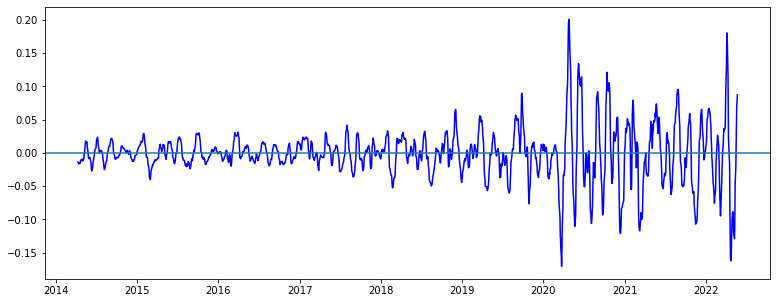

10 20 5 25


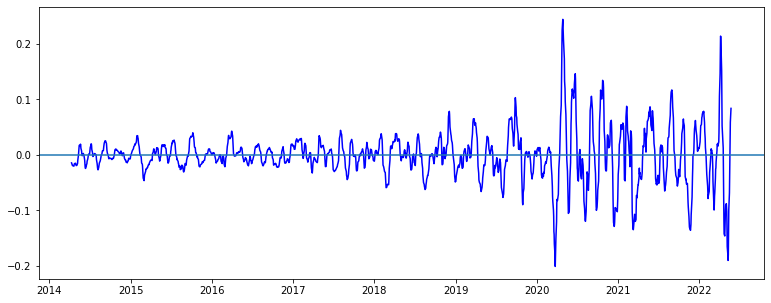

10 20 5 30


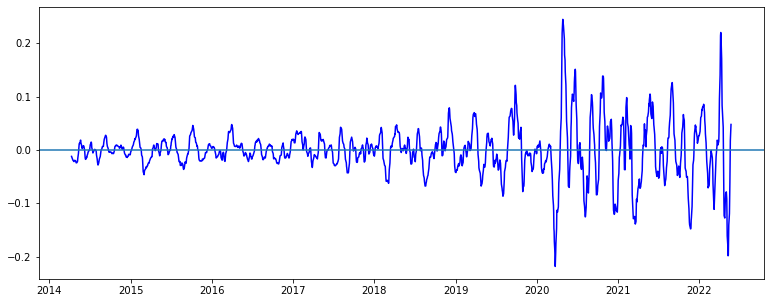

10 20 5 35


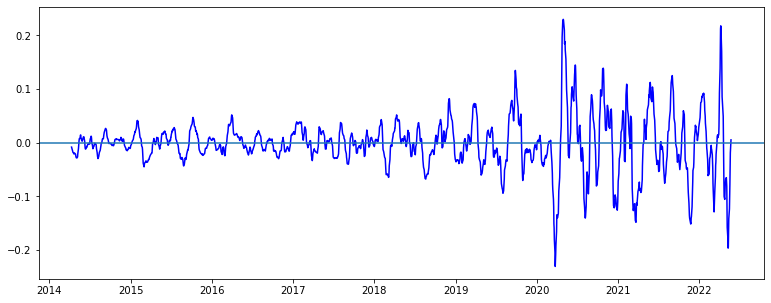

10 20 10 15


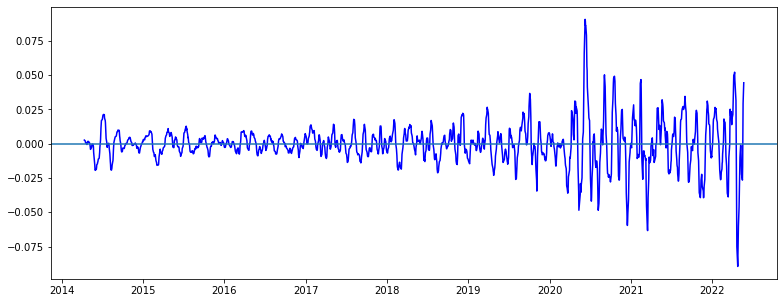

10 20 10 20


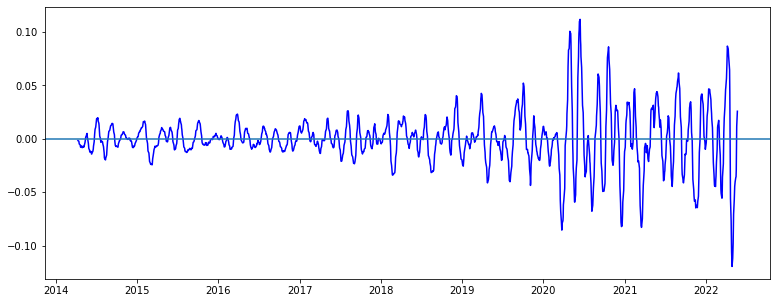

10 20 10 25


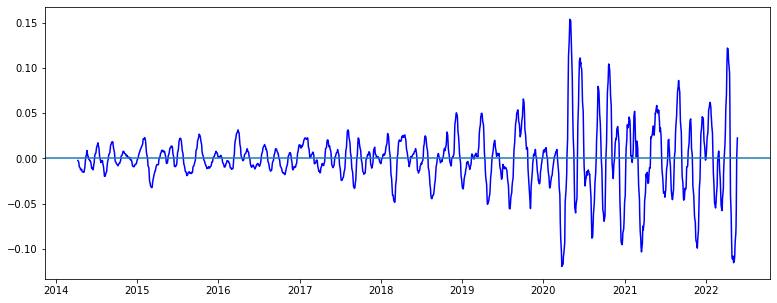

10 20 10 30


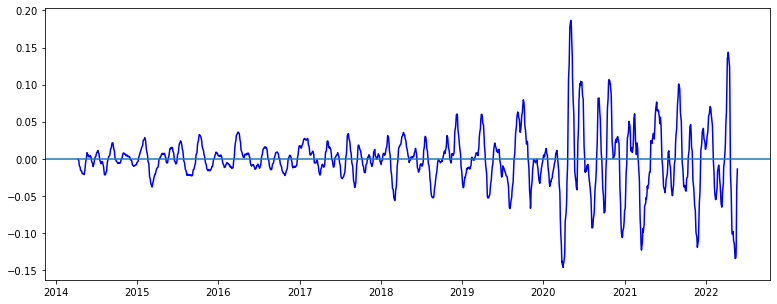

10 20 10 35


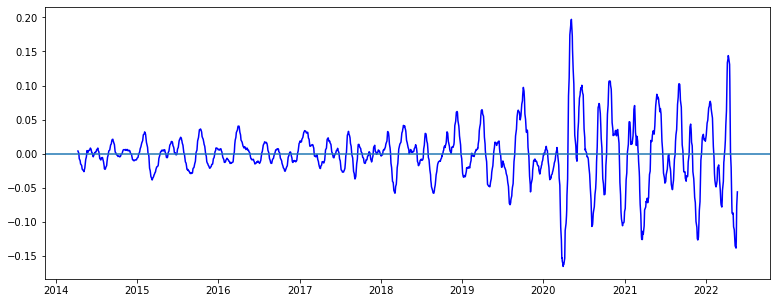

10 20 15 20


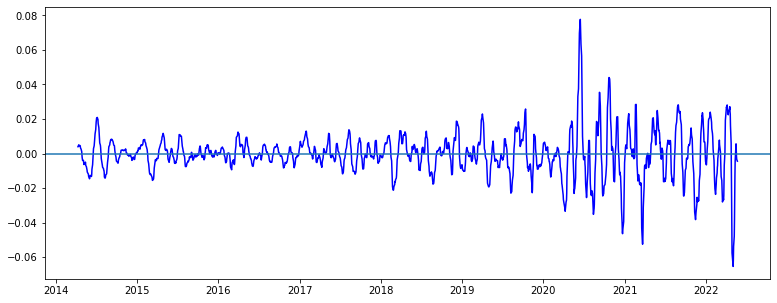

10 20 15 25


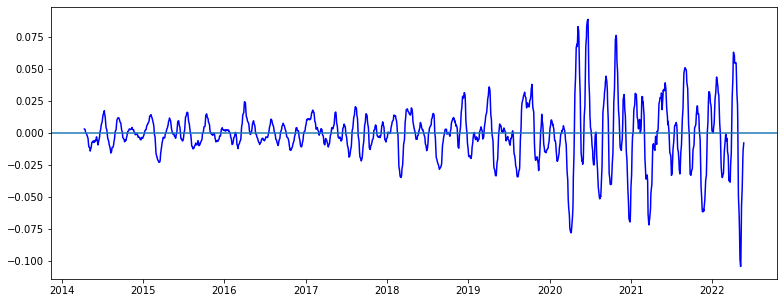

10 20 15 30


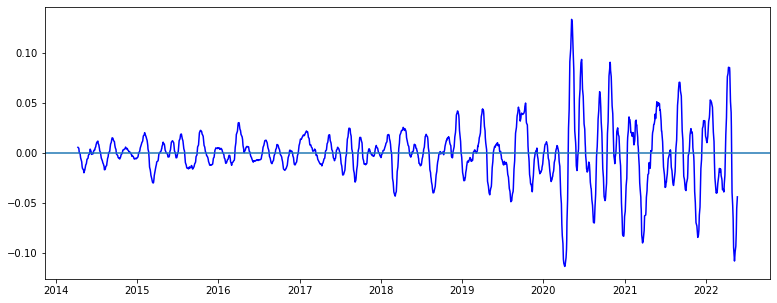

10 20 15 35


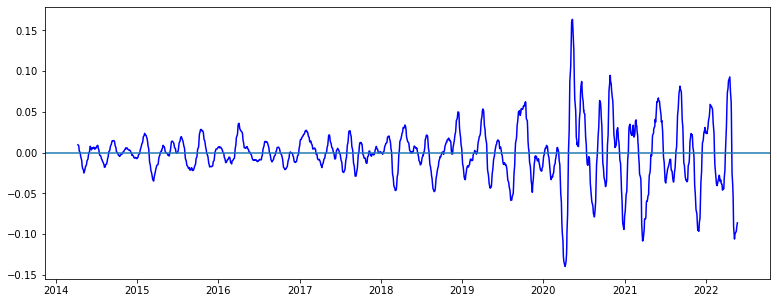

10 20 20 25


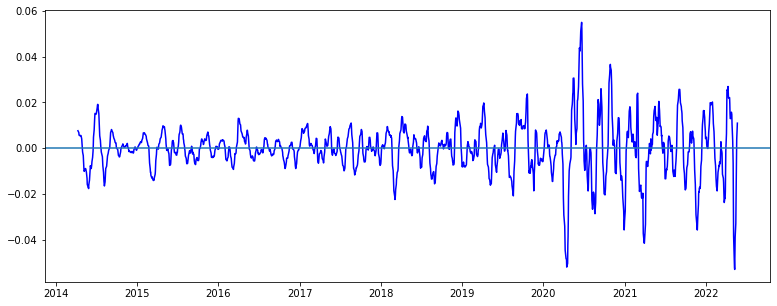

10 20 20 30


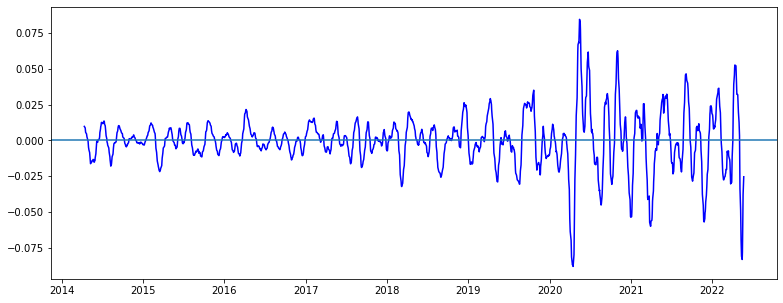

10 20 20 35


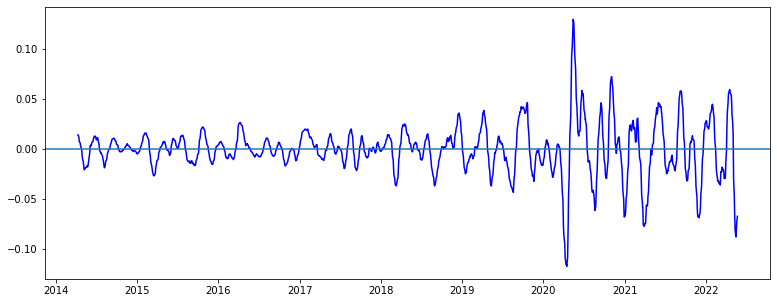

10 20 25 30


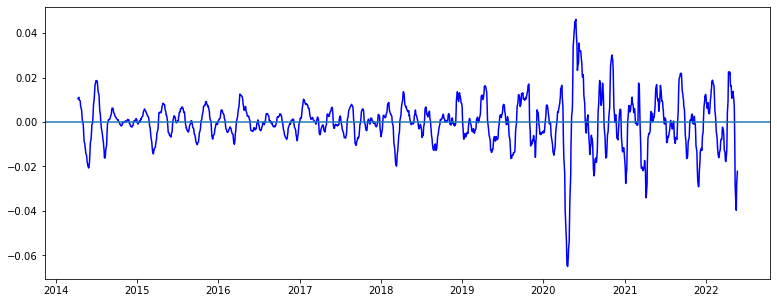

10 20 25 35


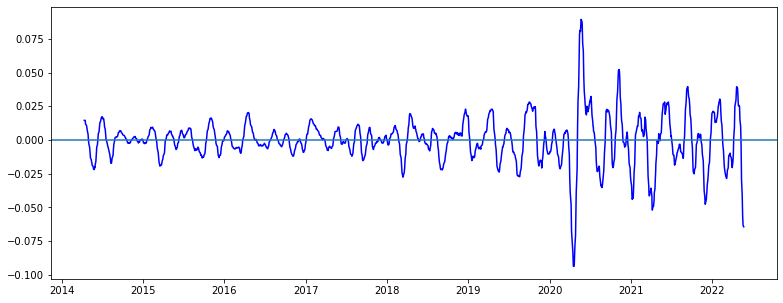

10 20 30 35


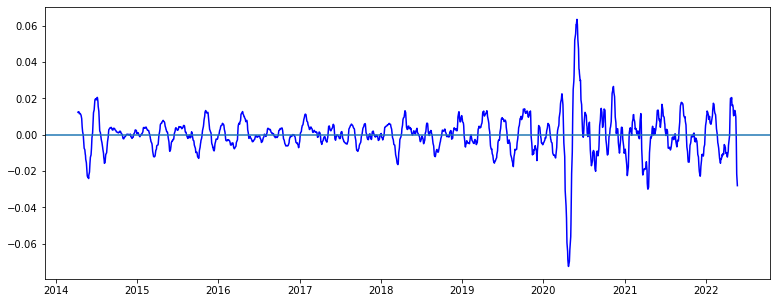

10 25 5 10


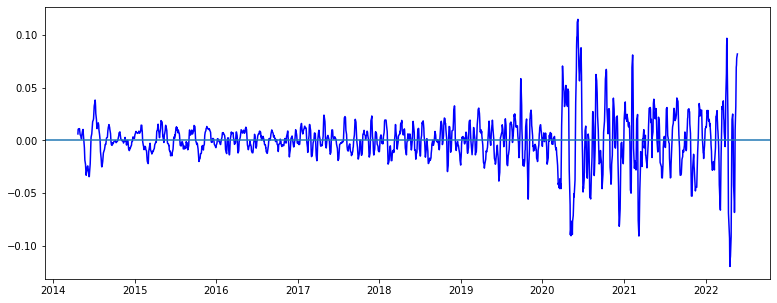

10 25 5 15


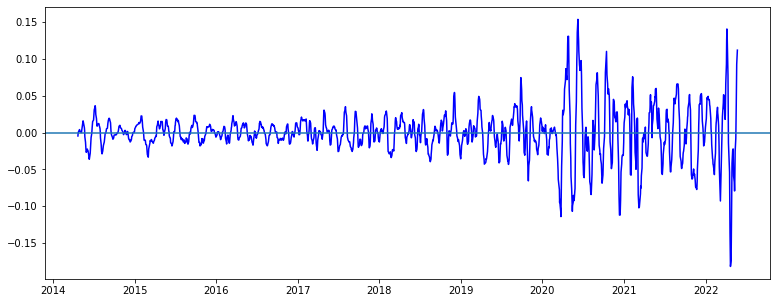

10 25 5 20


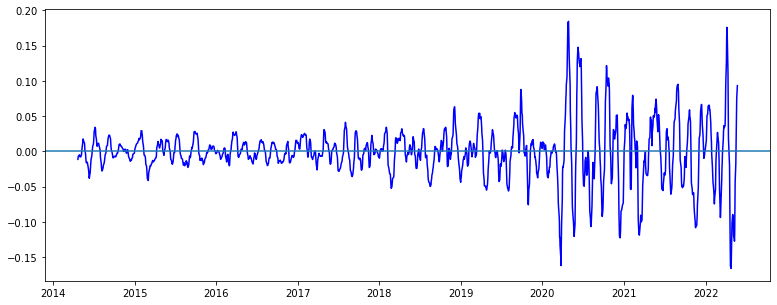

10 25 5 25


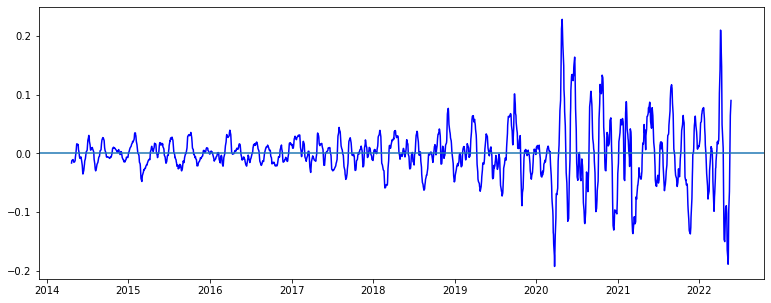

10 25 5 30


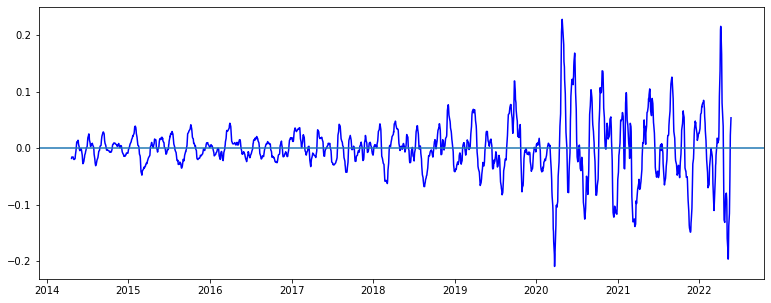

10 25 5 35


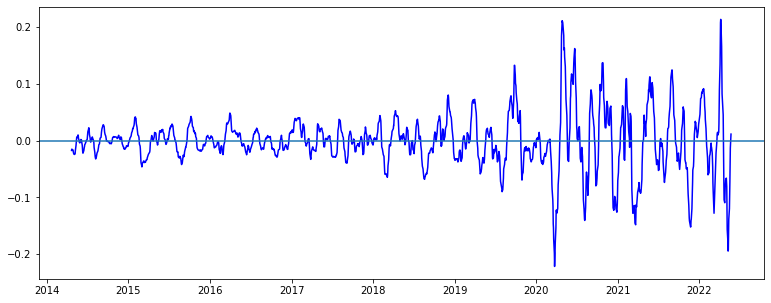

10 25 10 15


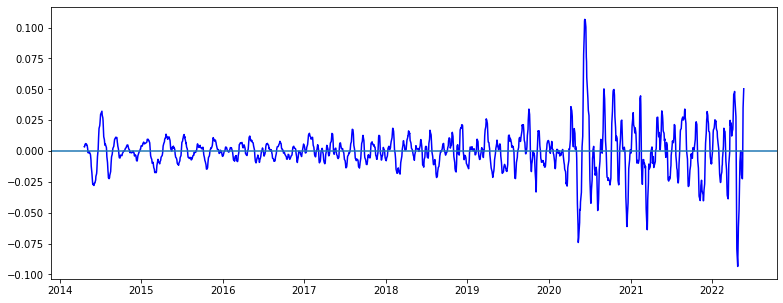

10 25 10 20


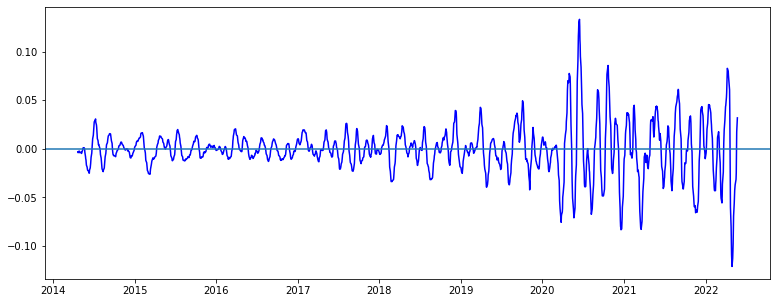

10 25 10 25


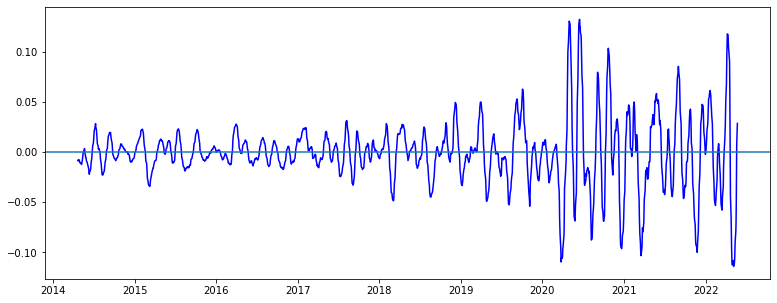

10 25 10 30


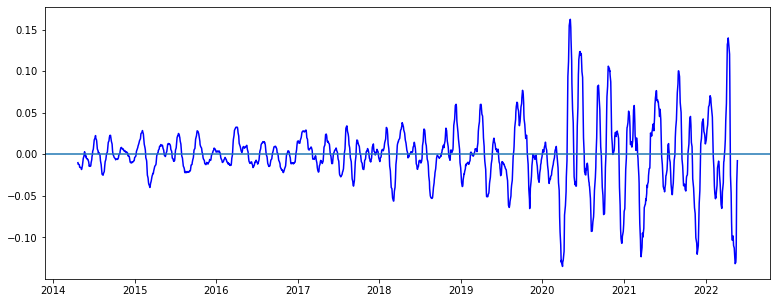

10 25 10 35


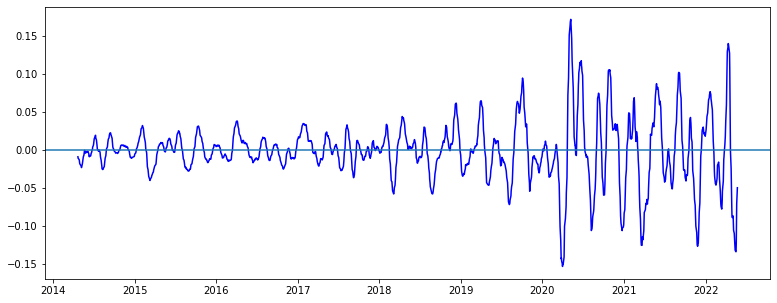

10 25 15 20


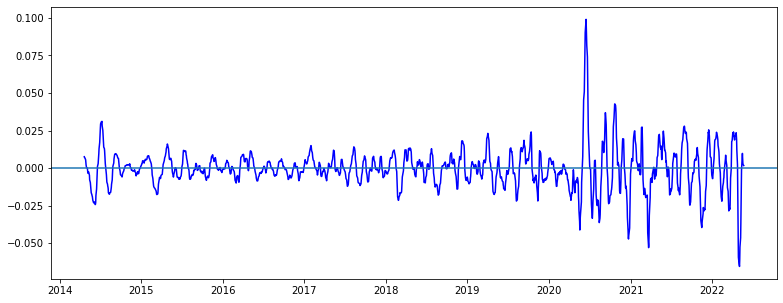

10 25 15 25


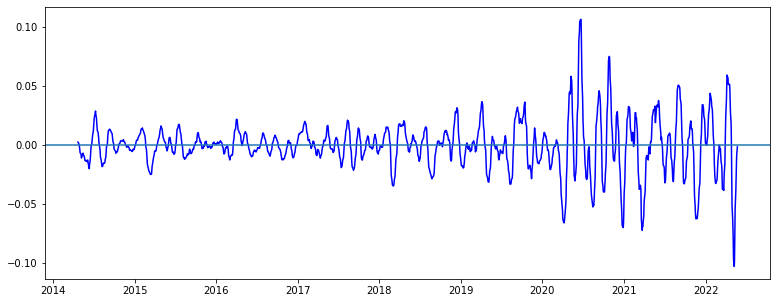

10 25 15 30


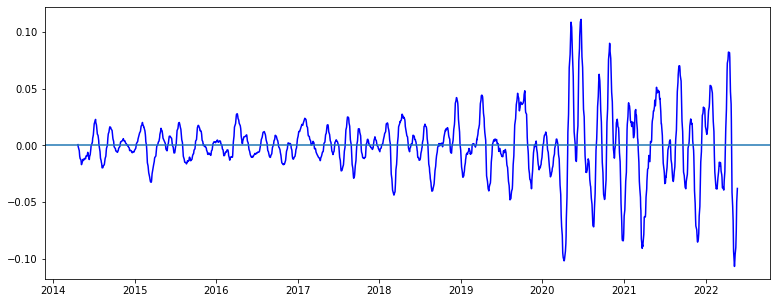

10 25 15 35


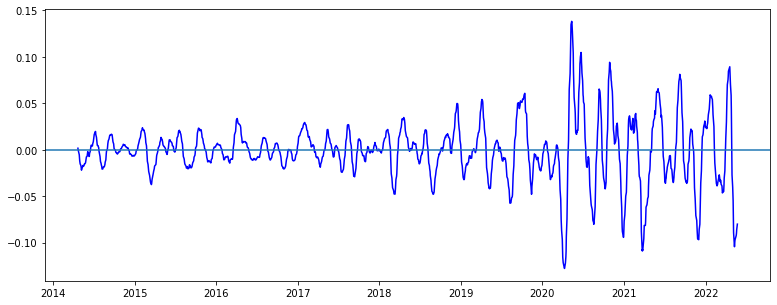

10 25 20 25


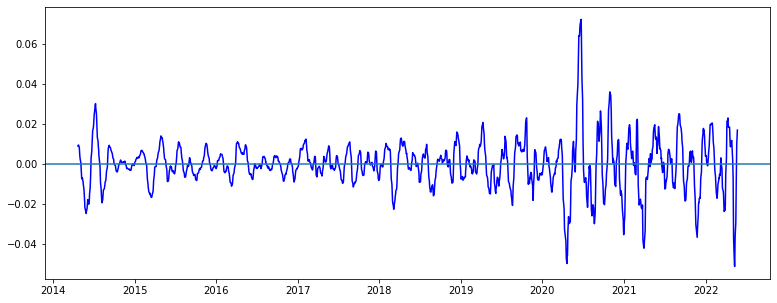

10 25 20 30


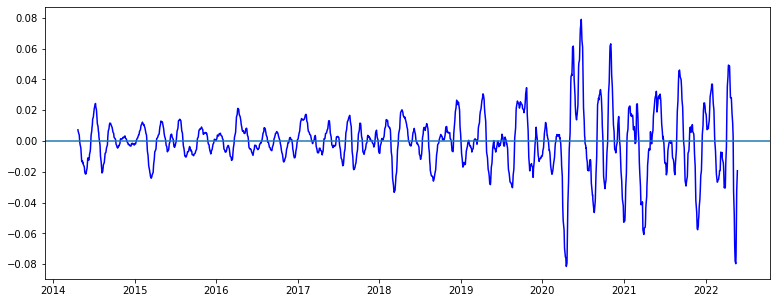

10 25 20 35


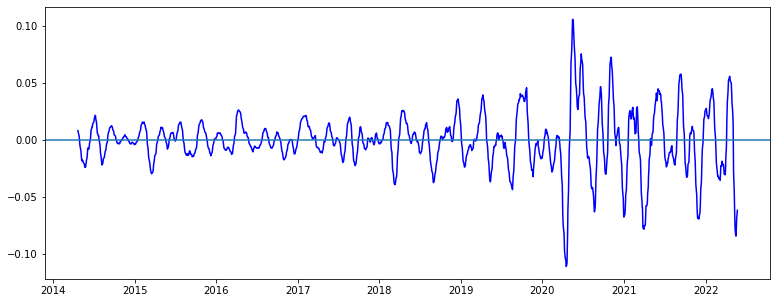

10 25 25 30


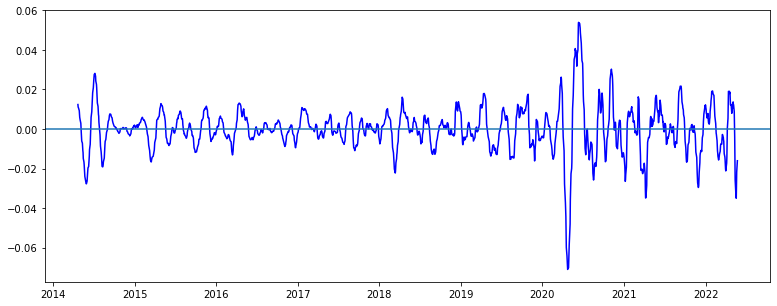

10 25 25 35


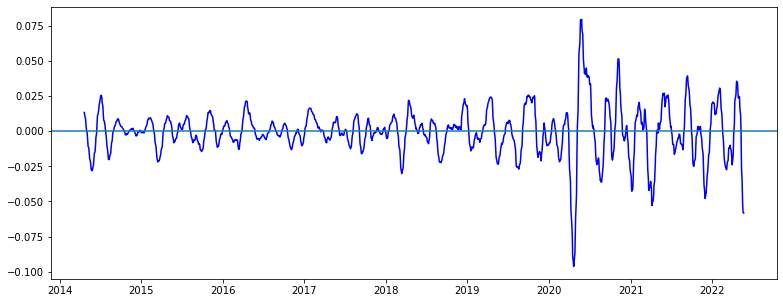

10 25 30 35


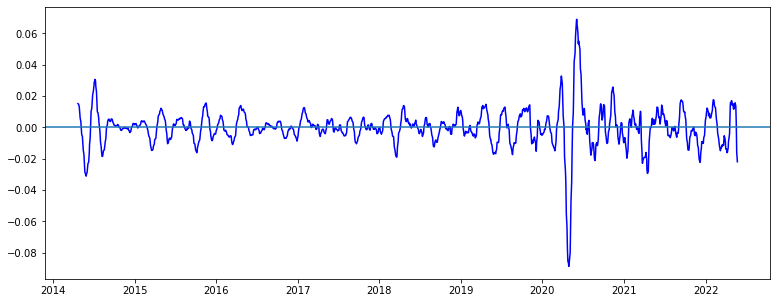

10 30 5 10


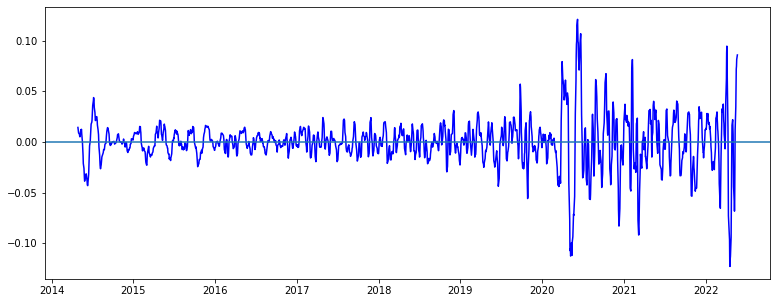

10 30 5 15


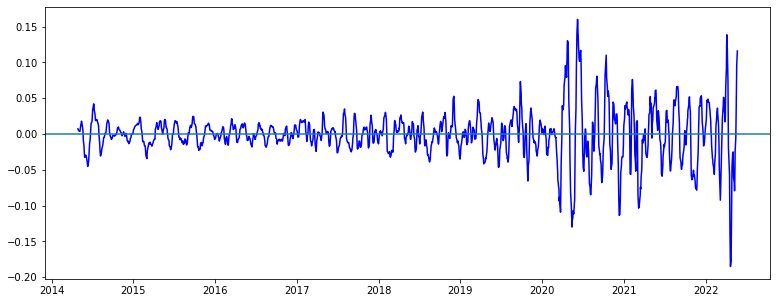

10 30 5 20


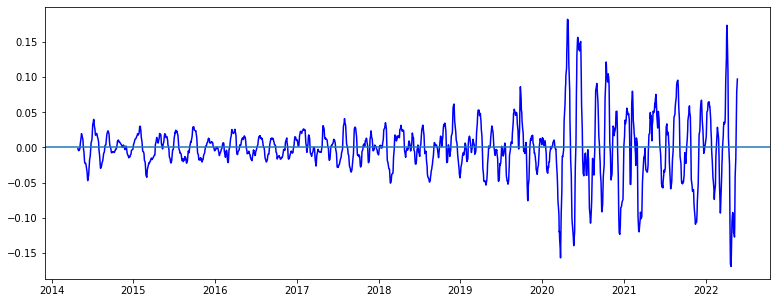

10 30 5 25


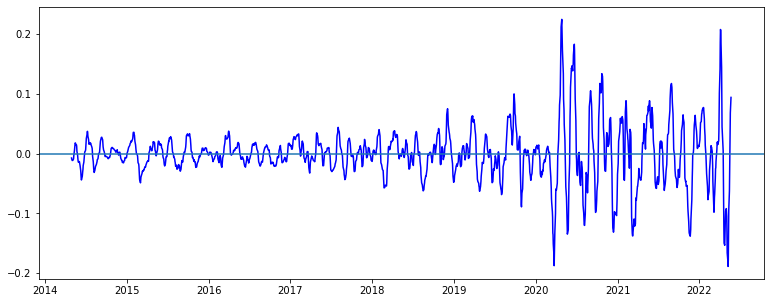

10 30 5 30


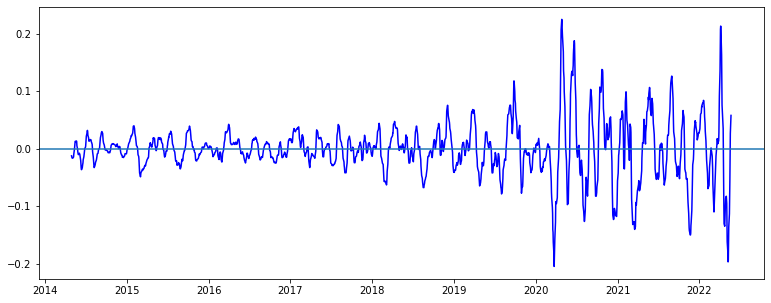

10 30 5 35


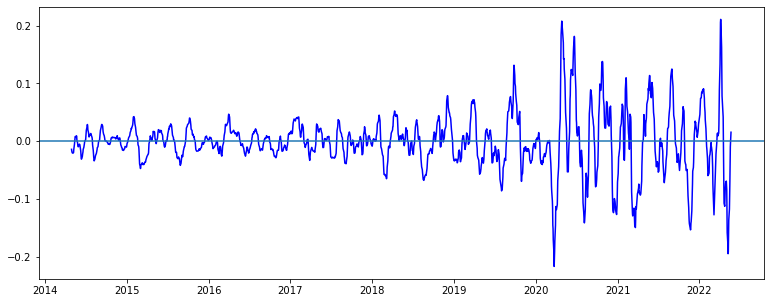

10 30 10 15


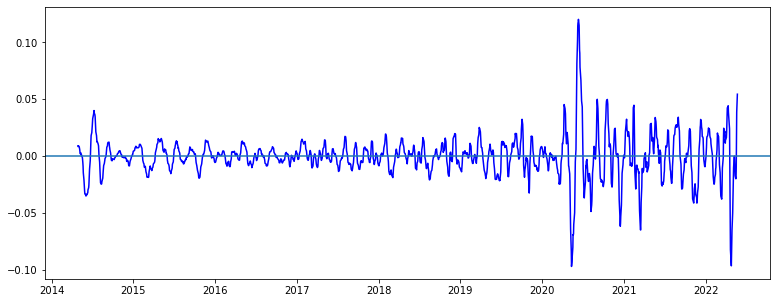

10 30 10 20


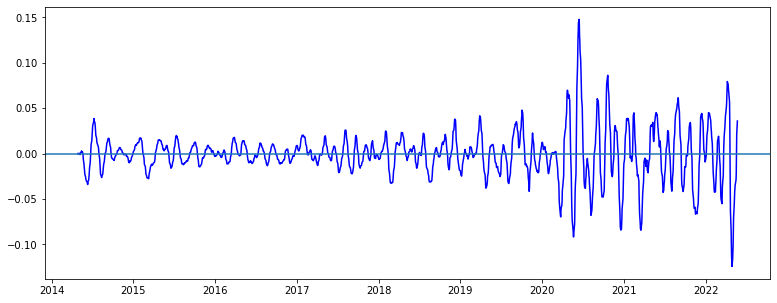

10 30 10 25


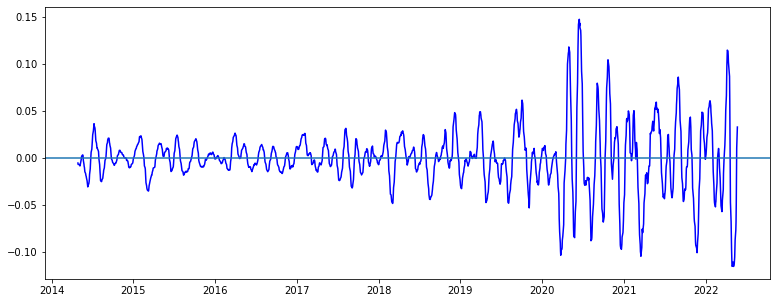

10 30 10 30


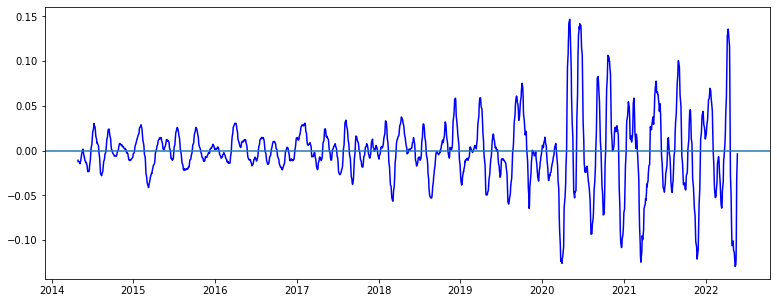

10 30 10 35


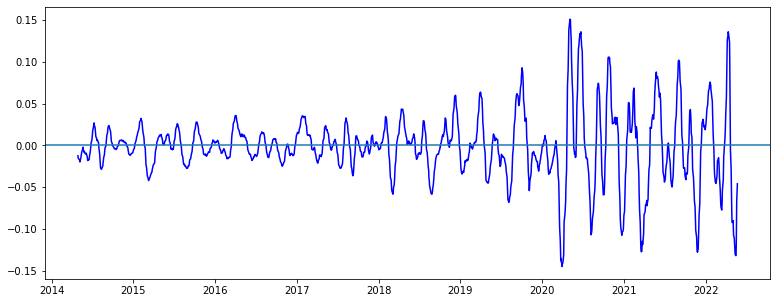

10 30 15 20


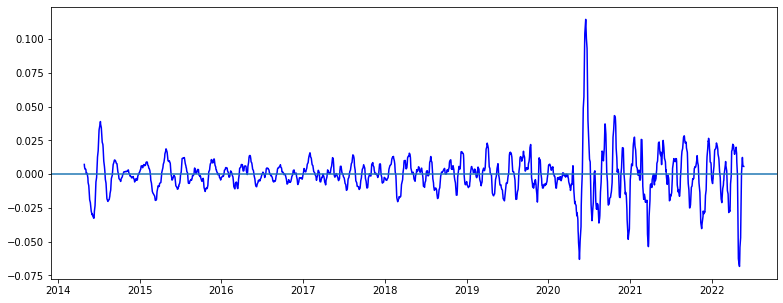

10 30 15 25


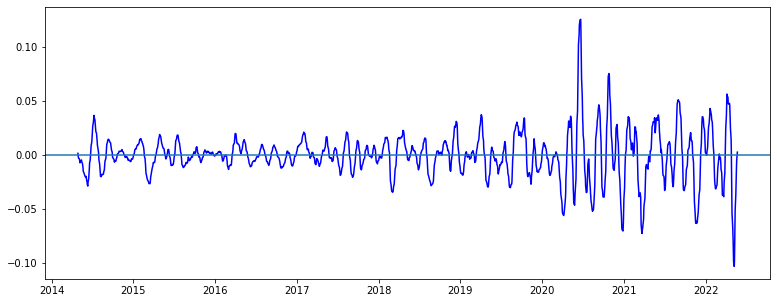

10 30 15 30


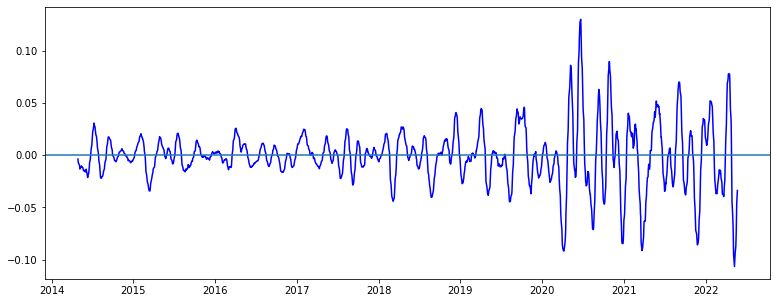

10 30 15 35


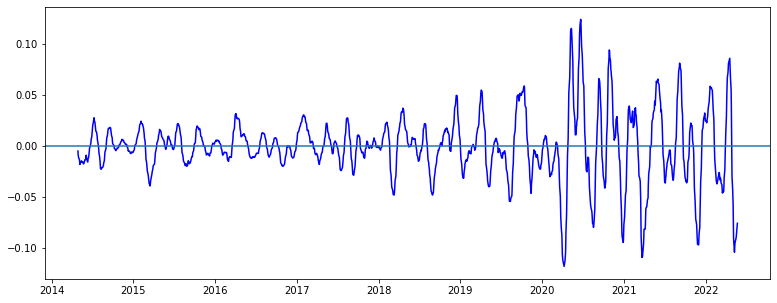

10 30 20 25


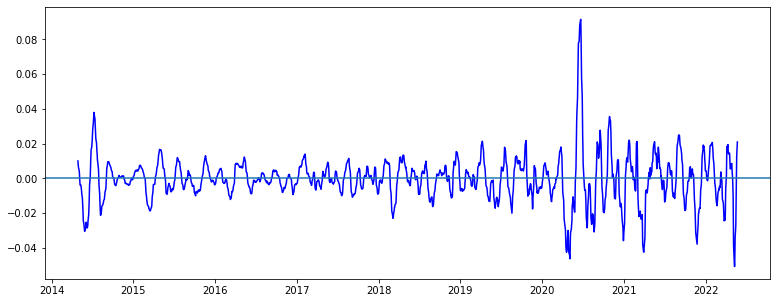

10 30 20 30


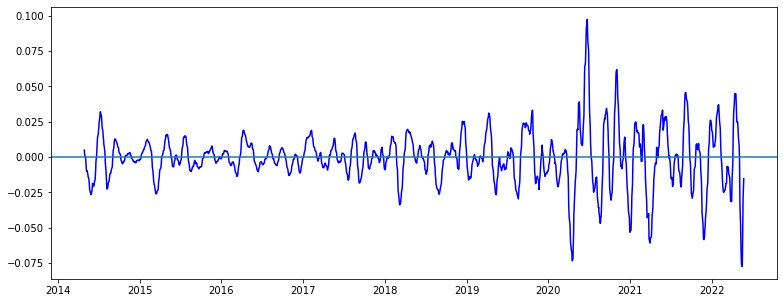

10 30 20 35


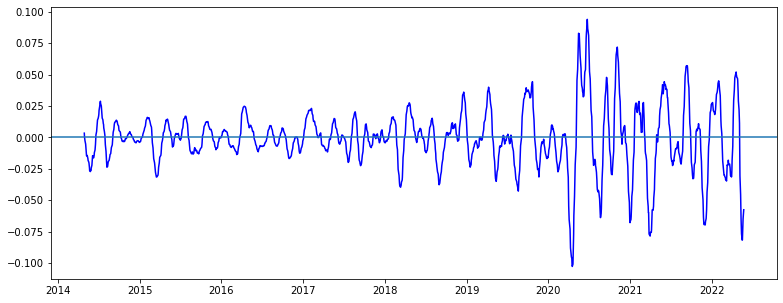

10 30 25 30


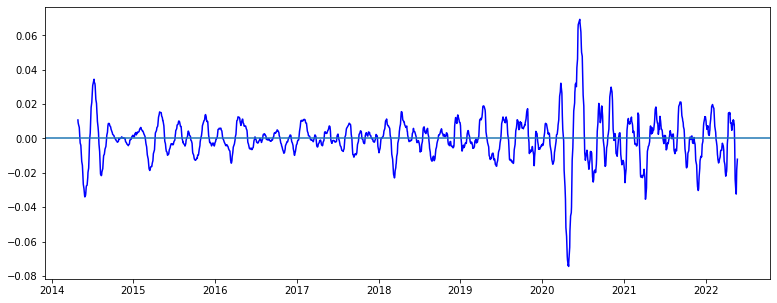

10 30 25 35


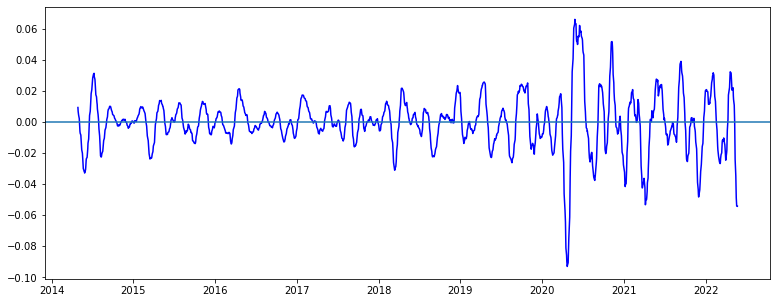

10 30 30 35


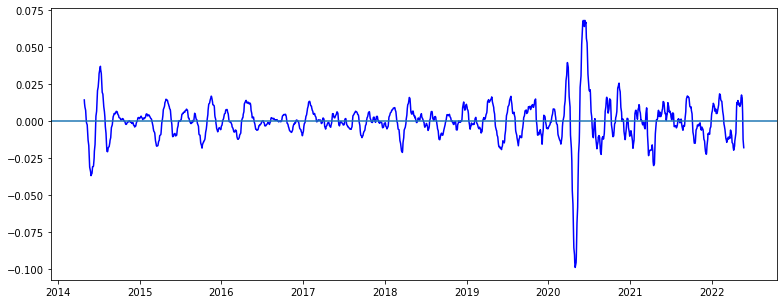

10 35 5 10


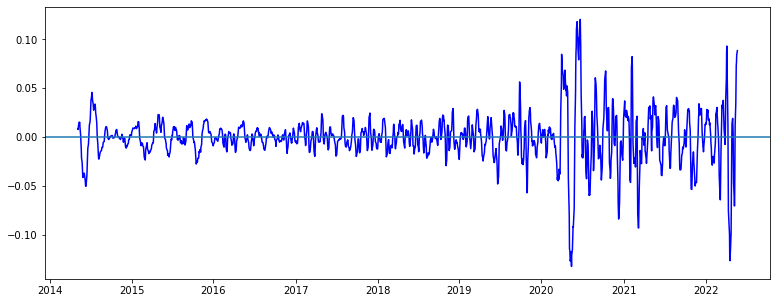

10 35 5 15


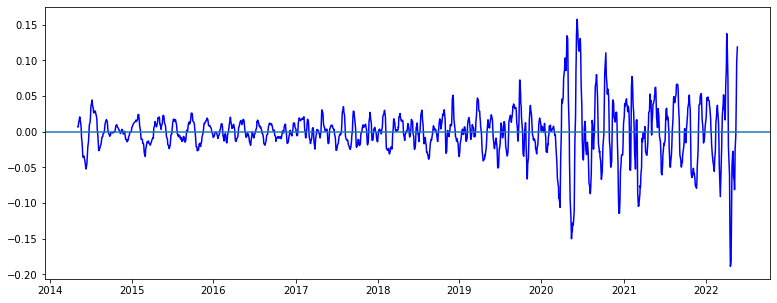

10 35 5 20


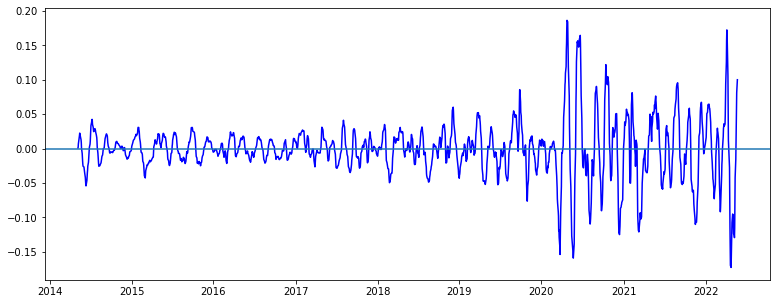

10 35 5 25


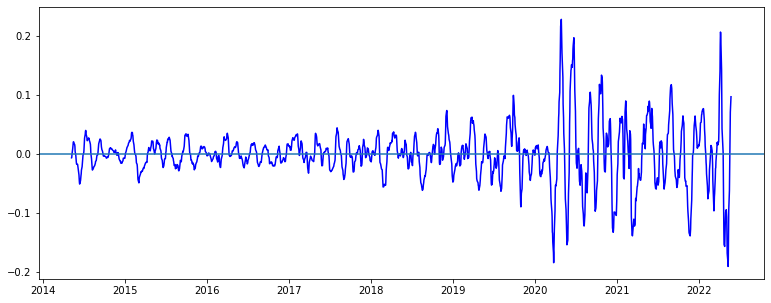

10 35 5 30


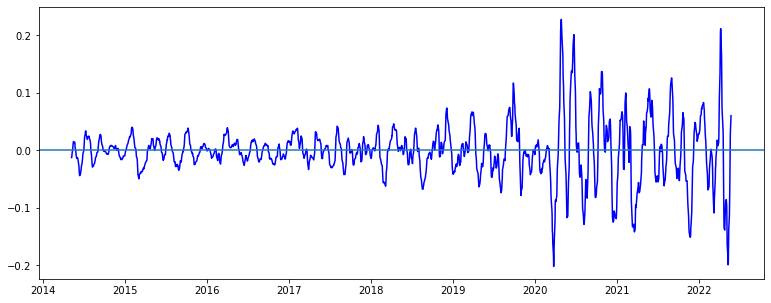

10 35 5 35


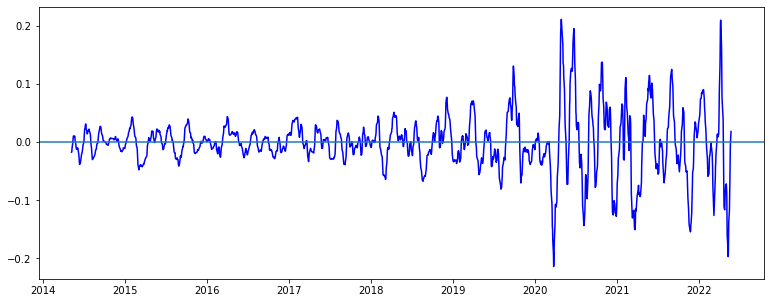

10 35 10 15


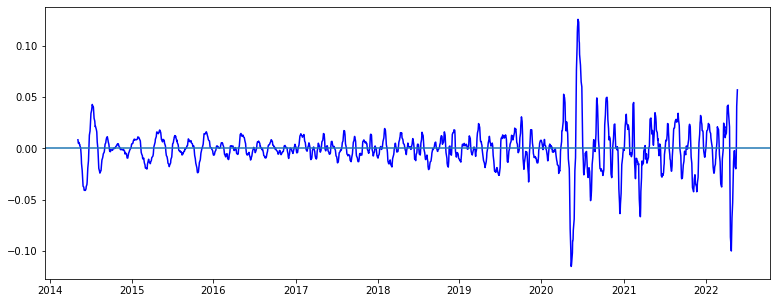

10 35 10 20


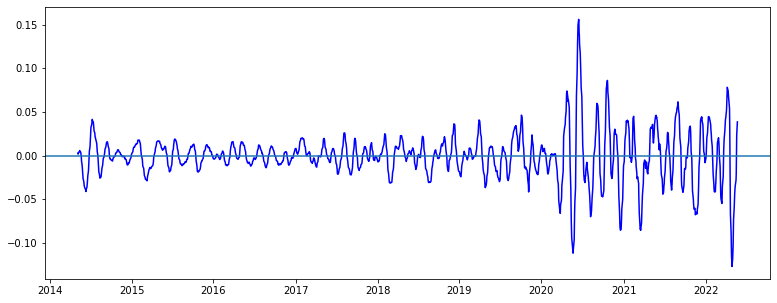

10 35 10 25


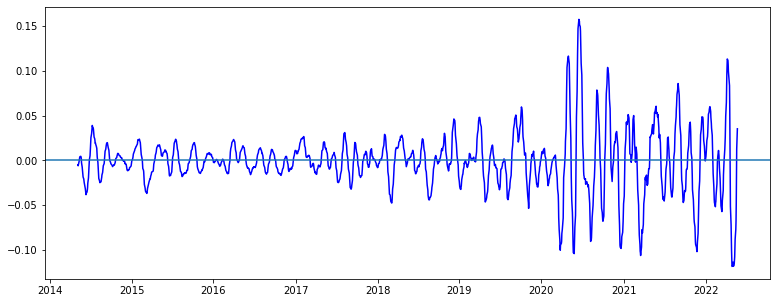

10 35 10 30


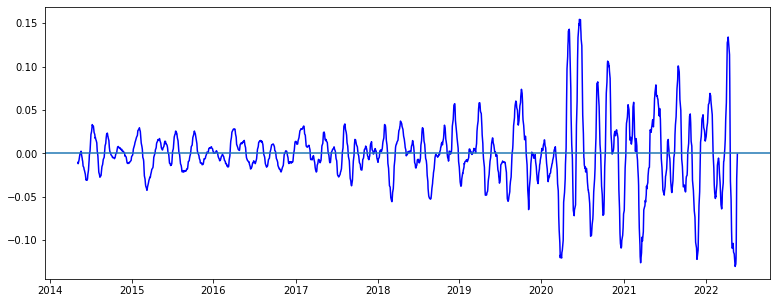

10 35 10 35


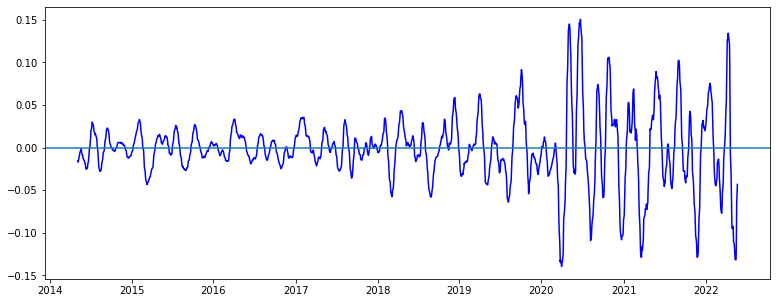

10 35 15 20


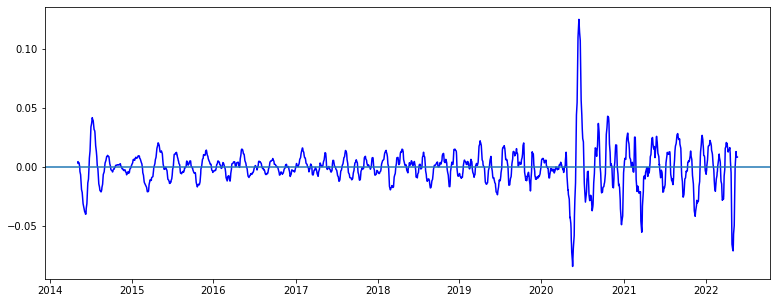

10 35 15 25


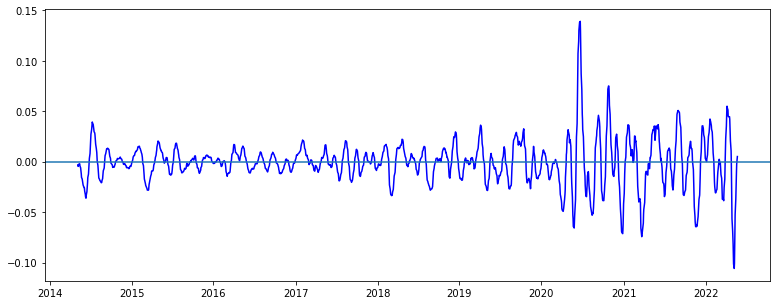

10 35 15 30


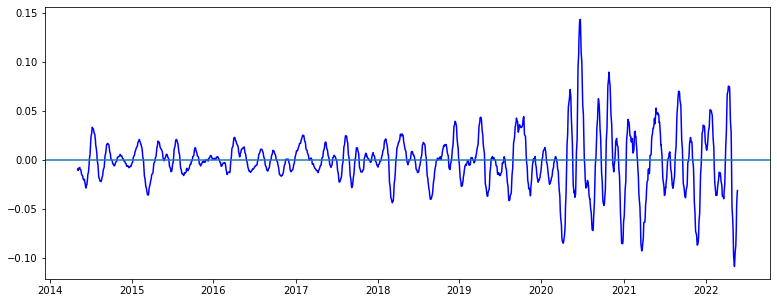

10 35 15 35


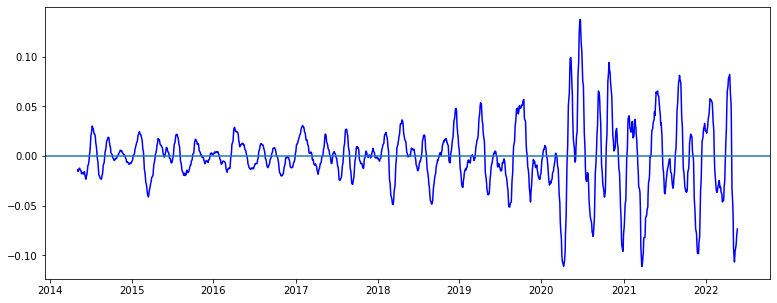

10 35 20 25


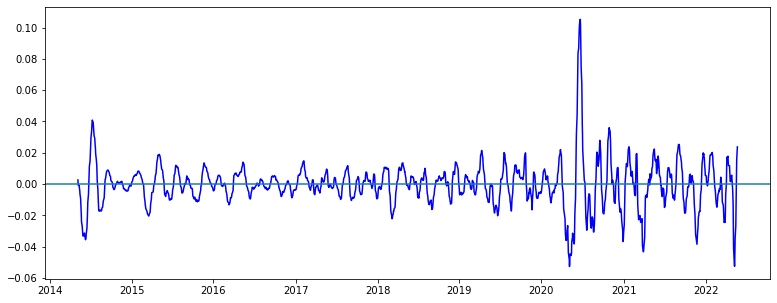

10 35 20 30


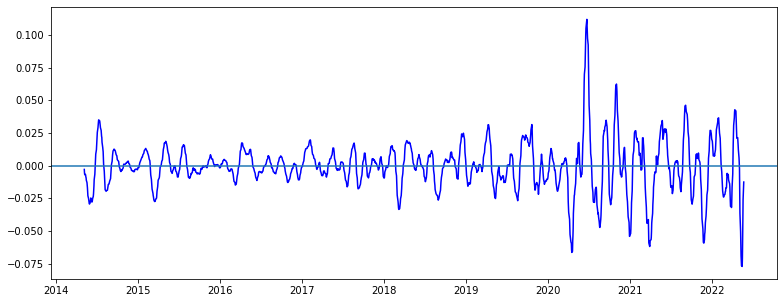

10 35 20 35


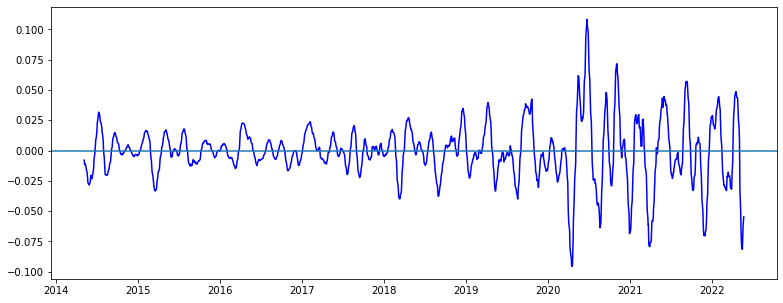

10 35 25 30


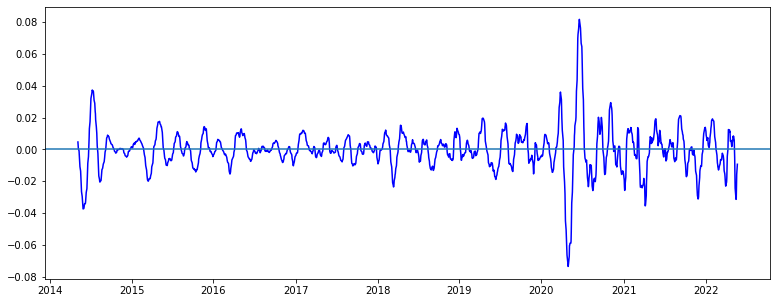

10 35 25 35


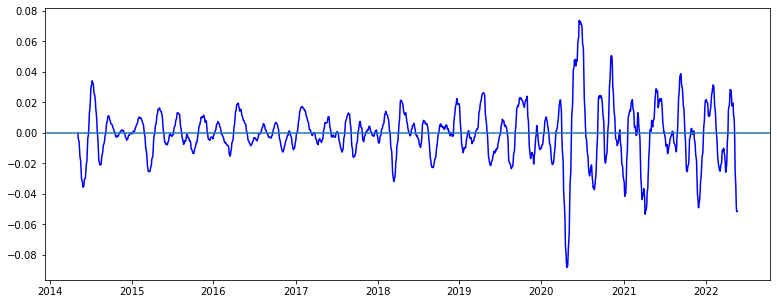

10 35 30 35


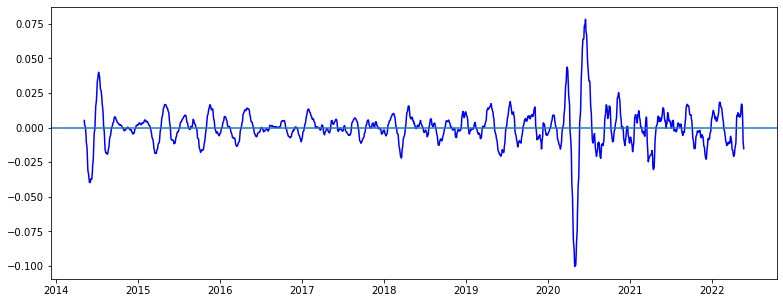

15 20 5 10


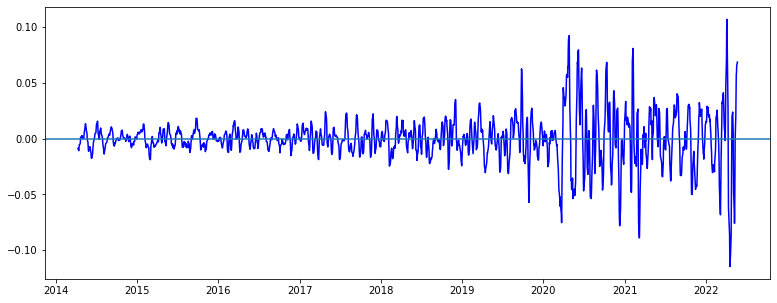

15 20 5 15


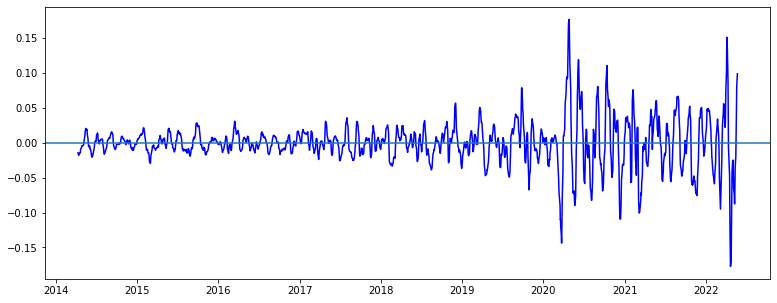

15 20 5 20


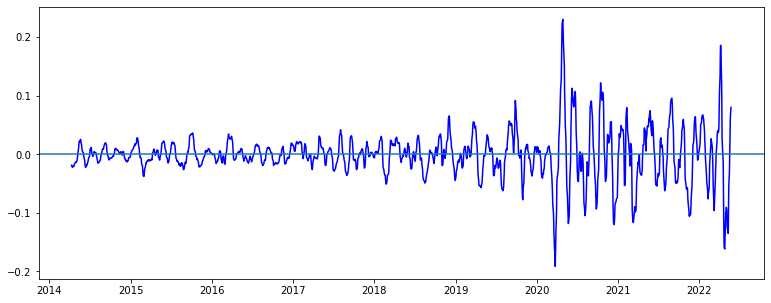

15 20 5 25


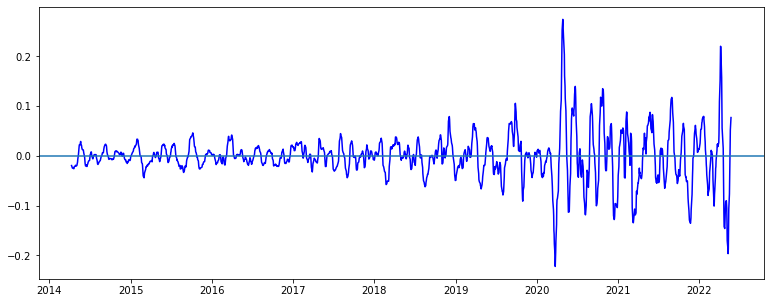

15 20 5 30


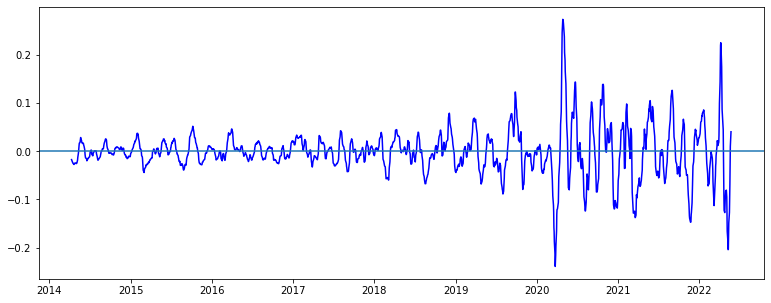

15 20 5 35


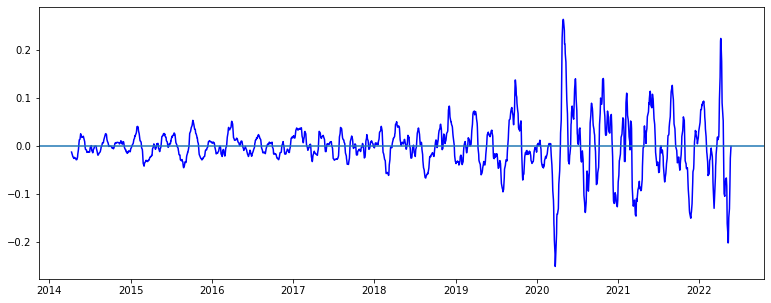

15 20 10 15


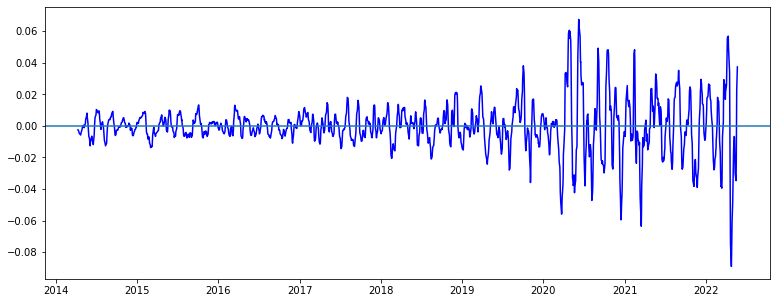

15 20 10 20


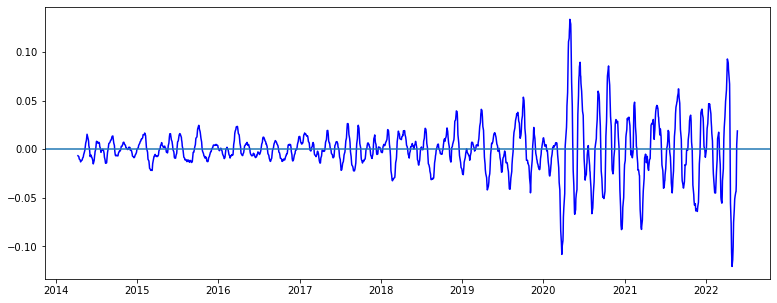

15 20 10 25


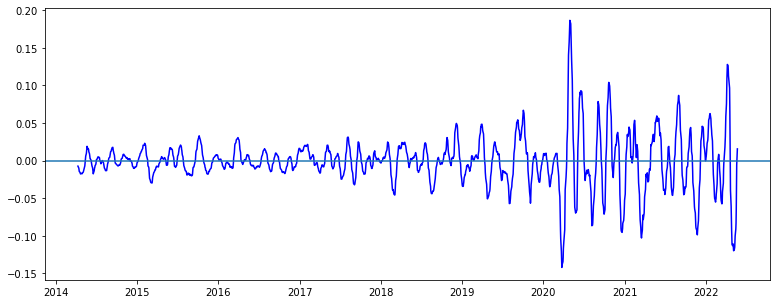

15 20 10 30


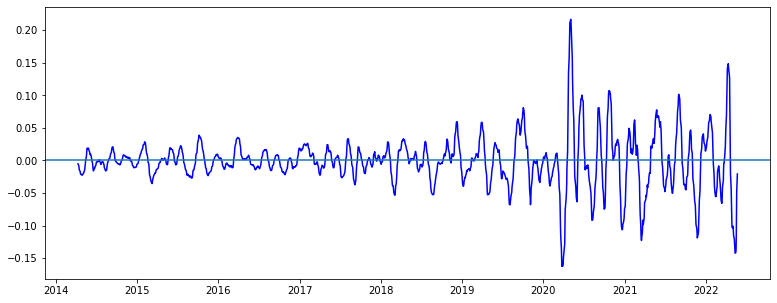

15 20 10 35


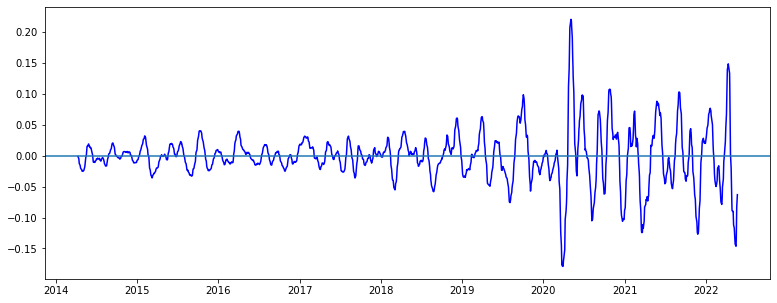

15 20 15 20


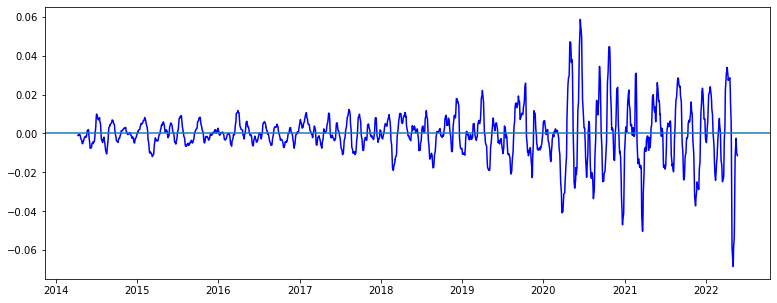

15 20 15 25


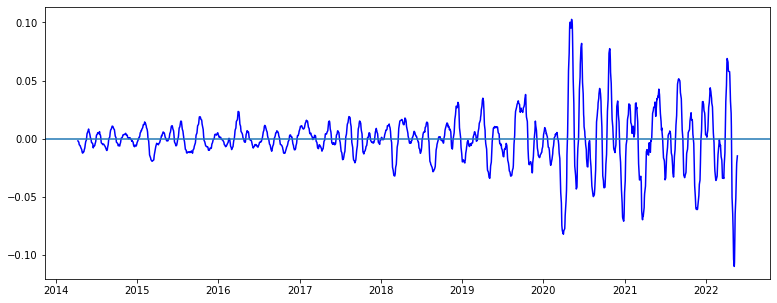

15 20 15 30


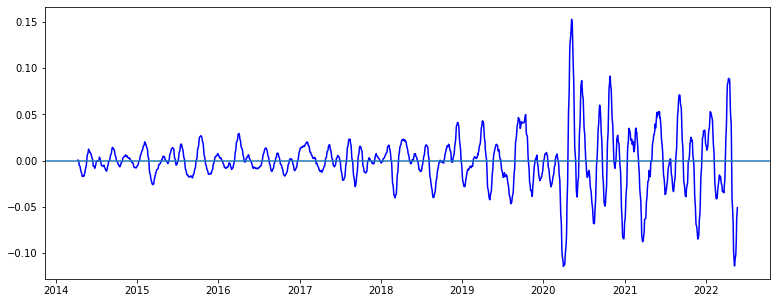

15 20 15 35


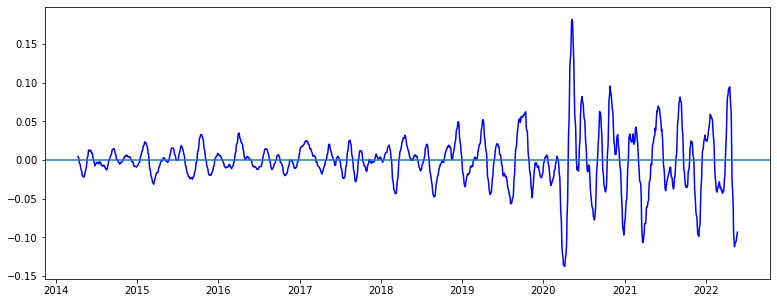

15 20 20 25


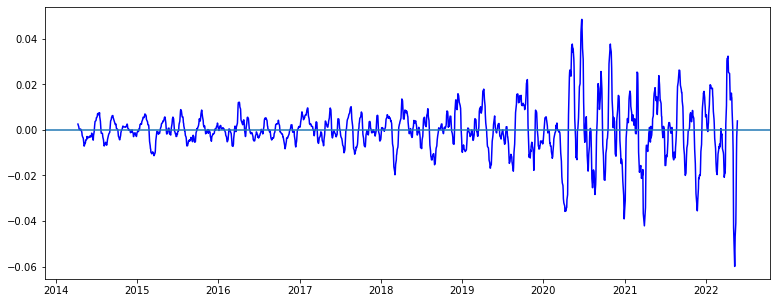

15 20 20 30


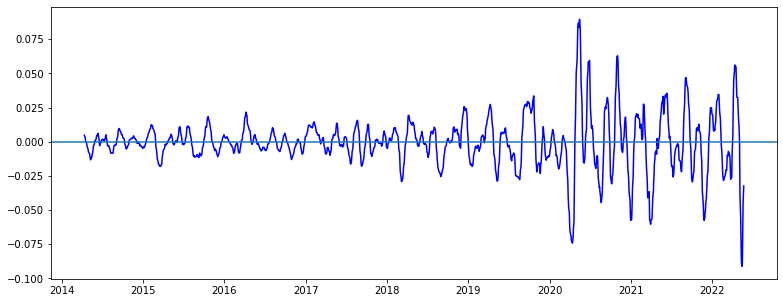

15 20 20 35


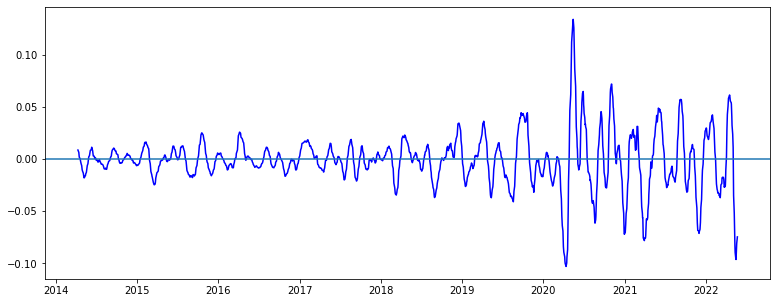

15 20 25 30


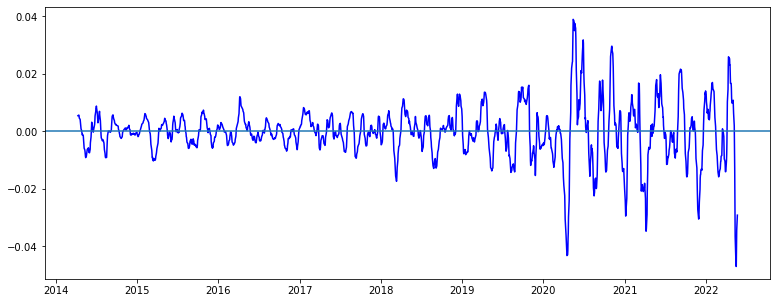

15 20 25 35


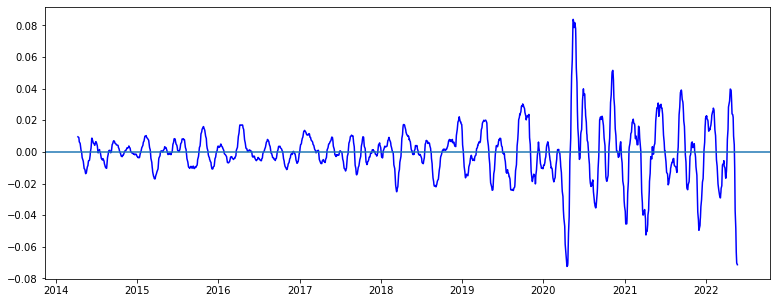

15 20 30 35


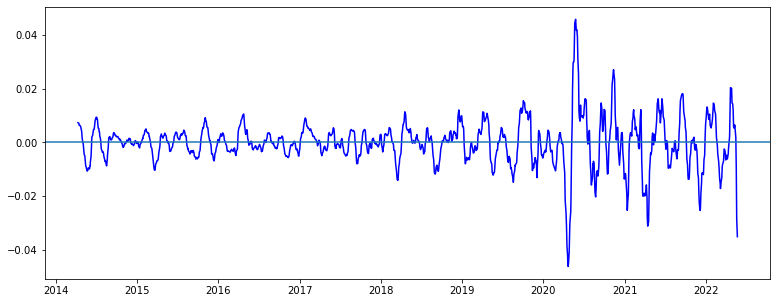

15 25 5 10


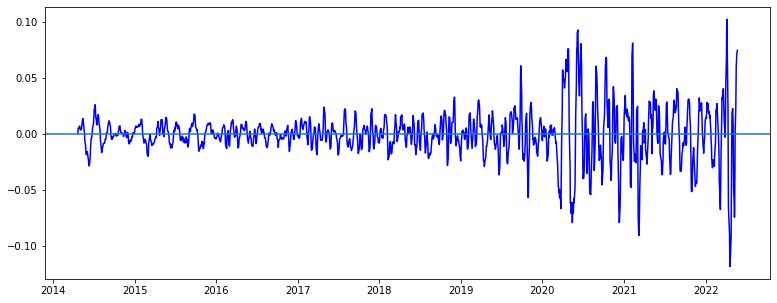

15 25 5 15


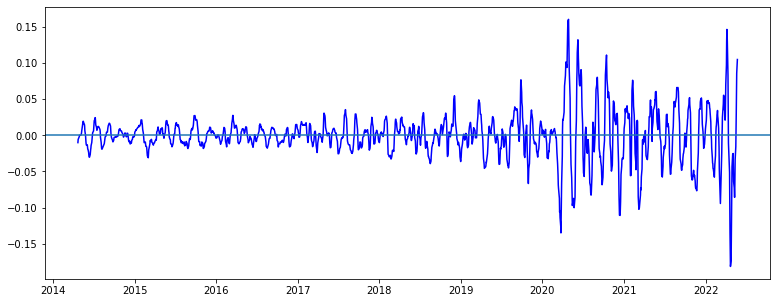

15 25 5 20


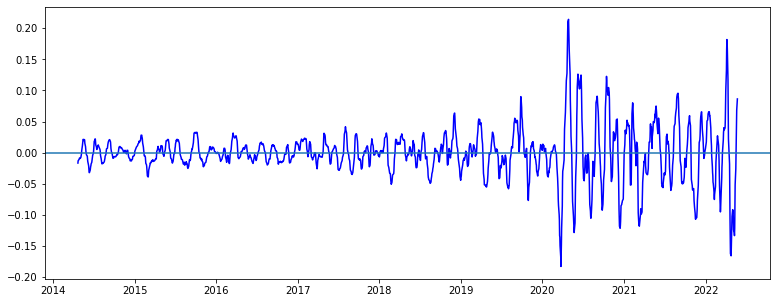

15 25 5 25


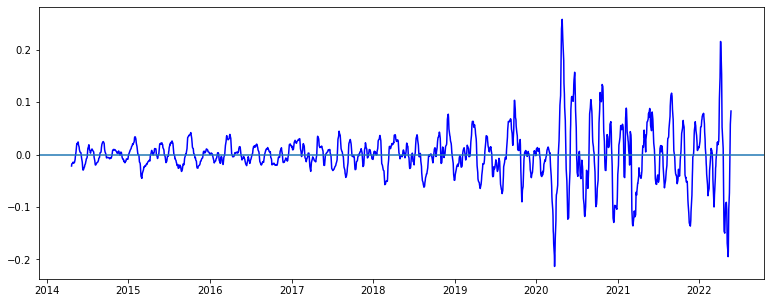

15 25 5 30


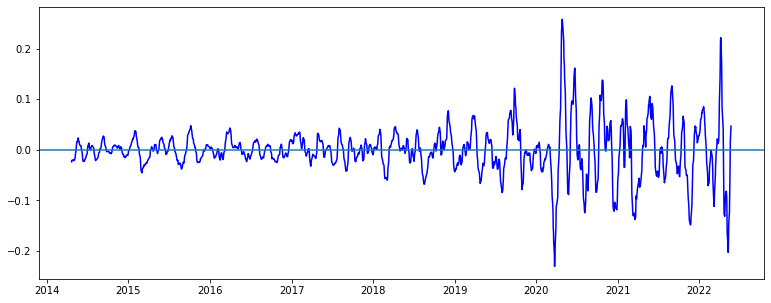

15 25 5 35


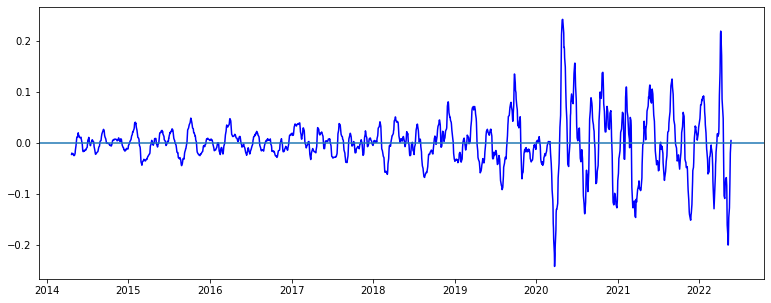

15 25 10 15


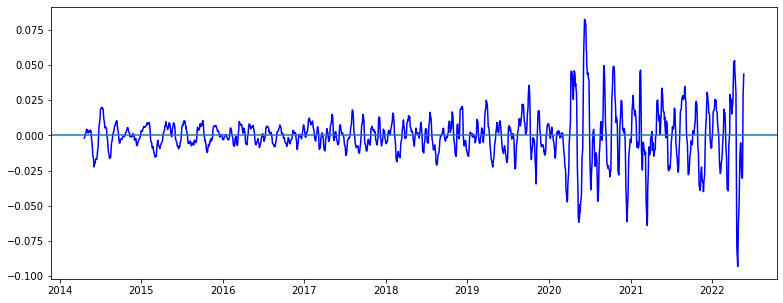

15 25 10 20


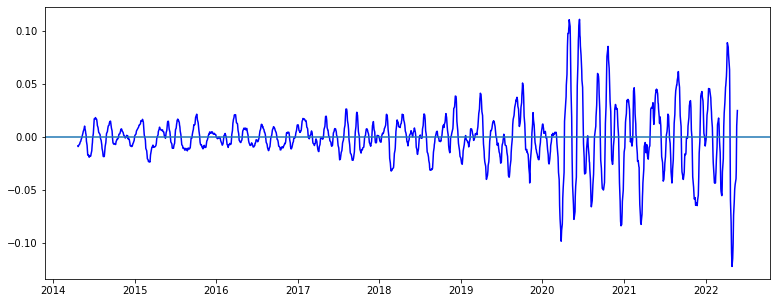

15 25 10 25


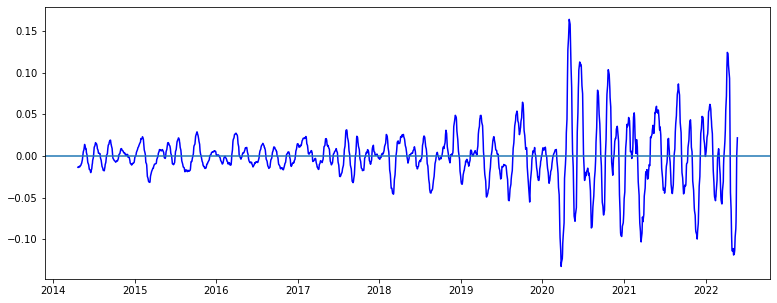

15 25 10 30


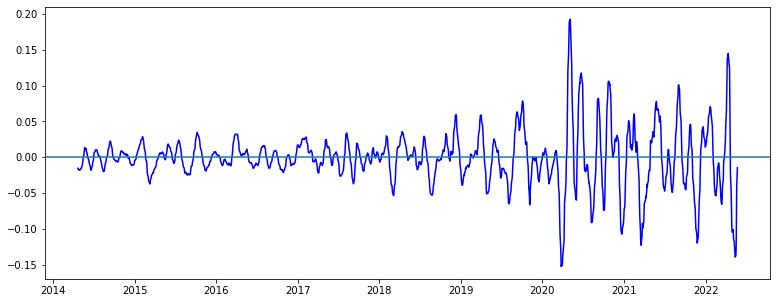

15 25 10 35


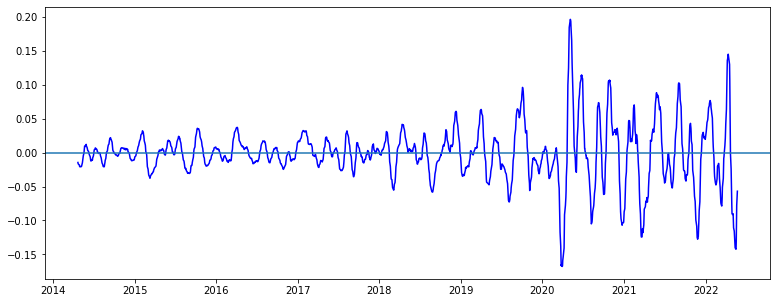

15 25 15 20


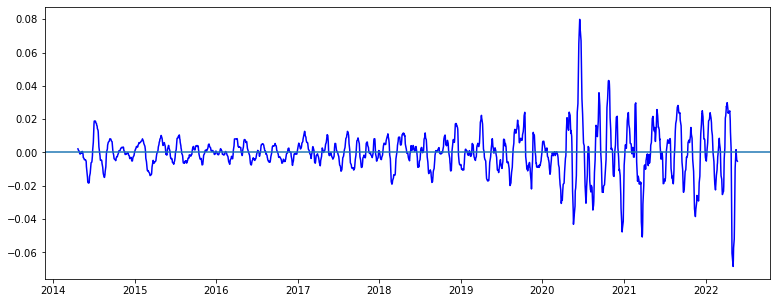

15 25 15 25


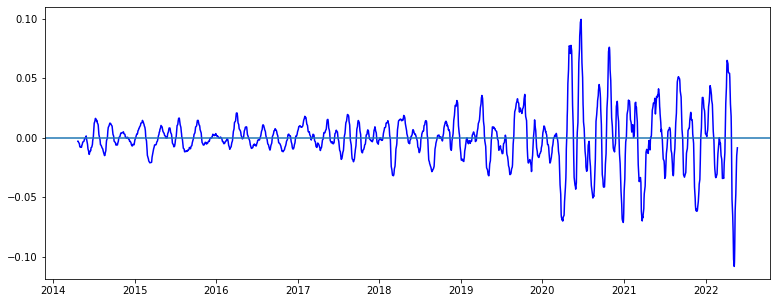

15 25 15 30


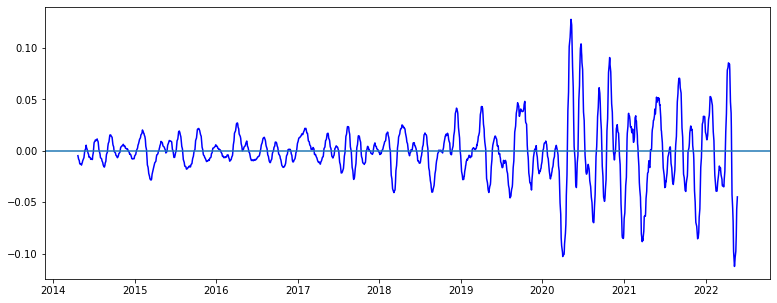

15 25 15 35


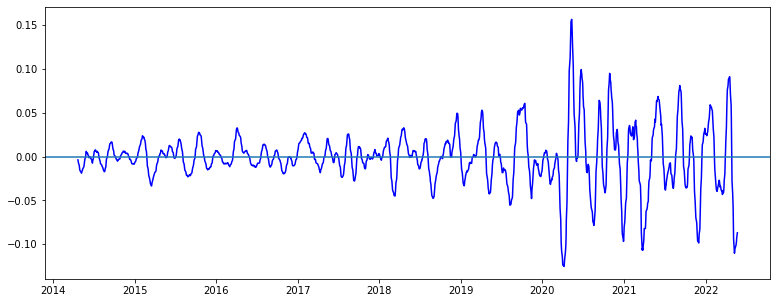

15 25 20 25


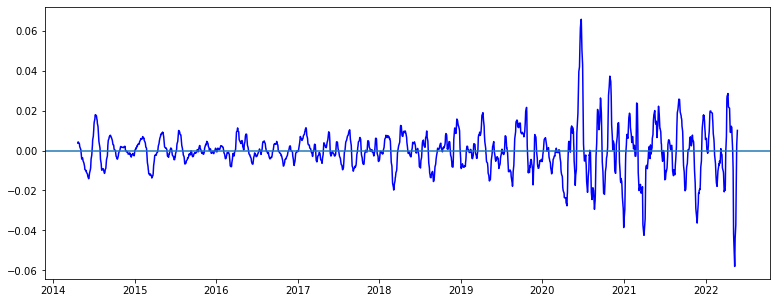

15 25 20 30


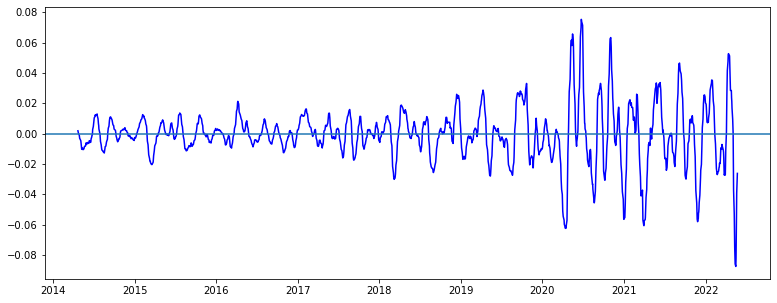

15 25 20 35


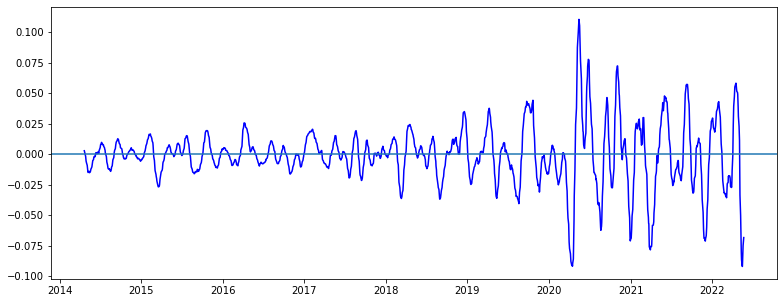

15 25 25 30


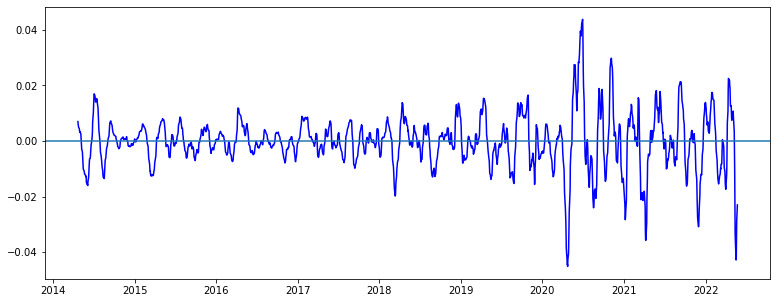

15 25 25 35


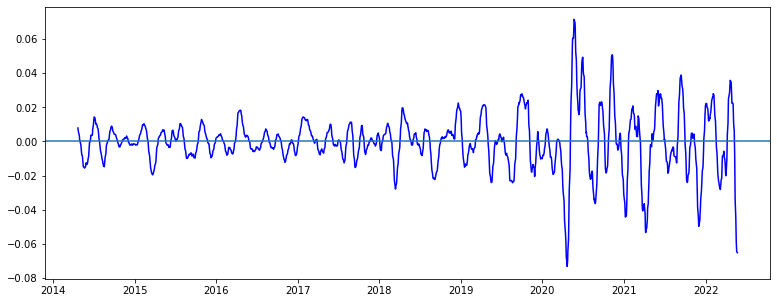

15 25 30 35


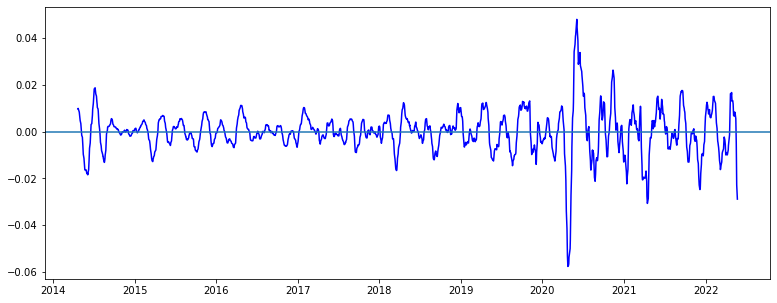

15 30 5 10


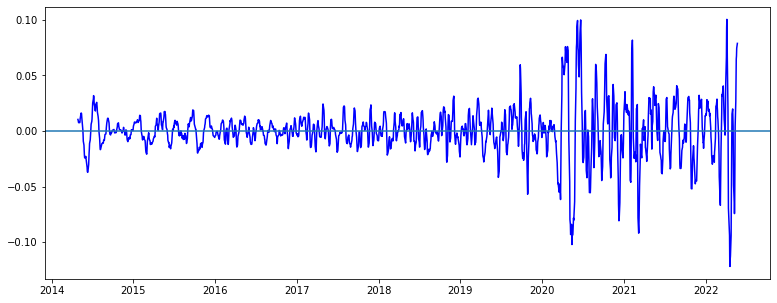

15 30 5 15


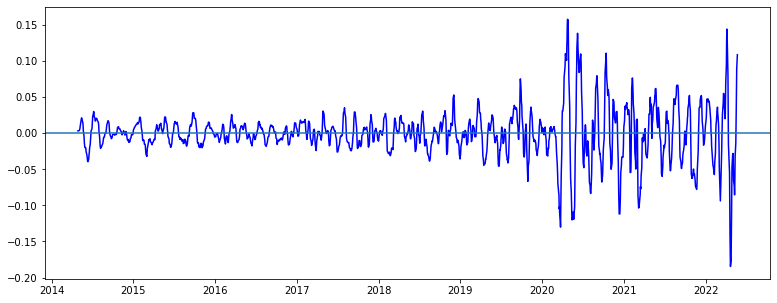

15 30 5 20


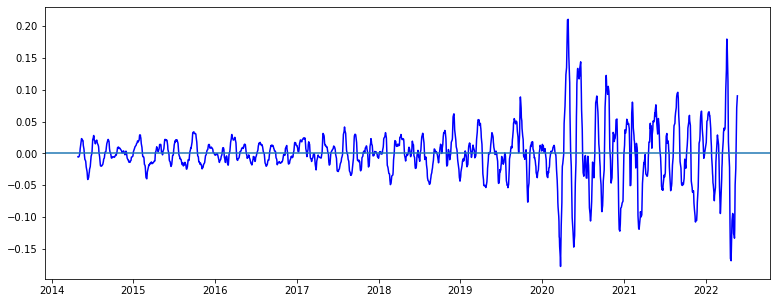

15 30 5 25


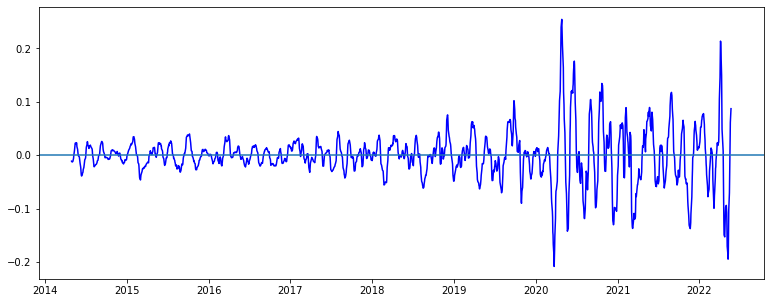

15 30 5 30


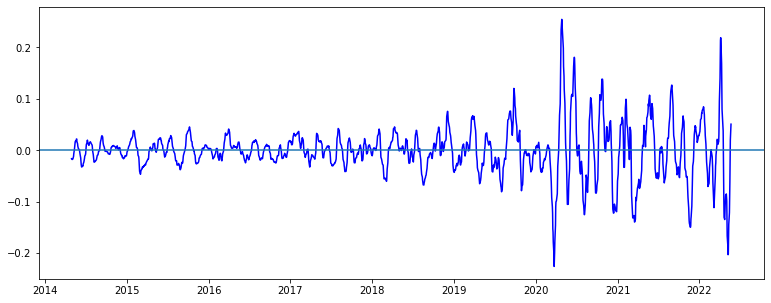

15 30 5 35


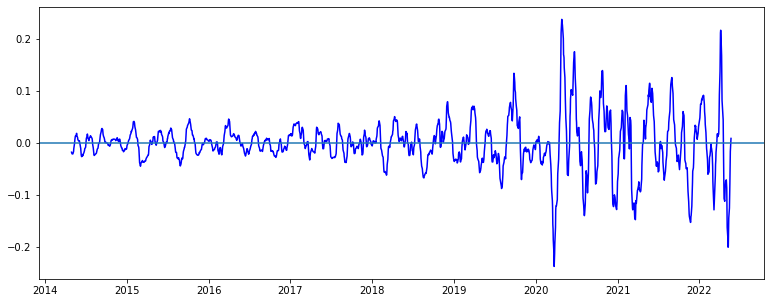

15 30 10 15


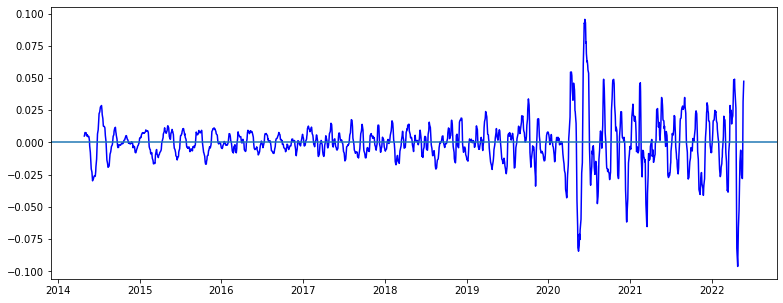

15 30 10 20


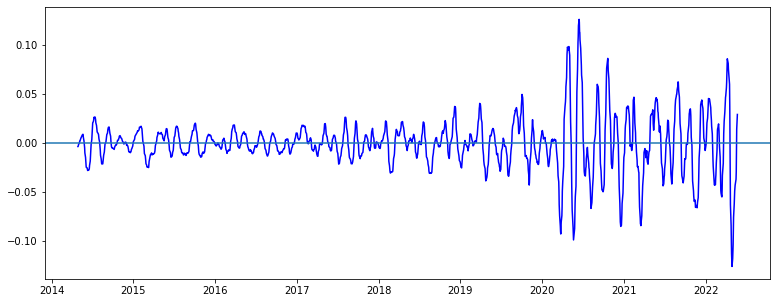

15 30 10 25


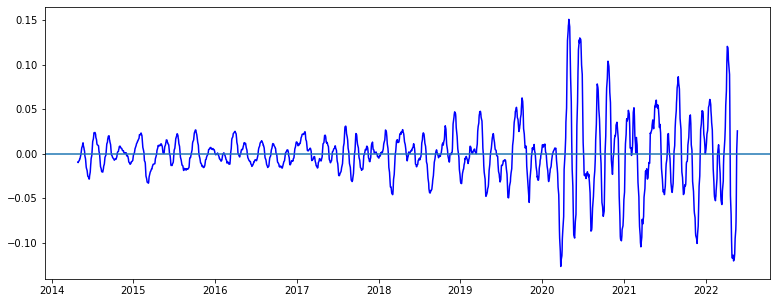

15 30 10 30


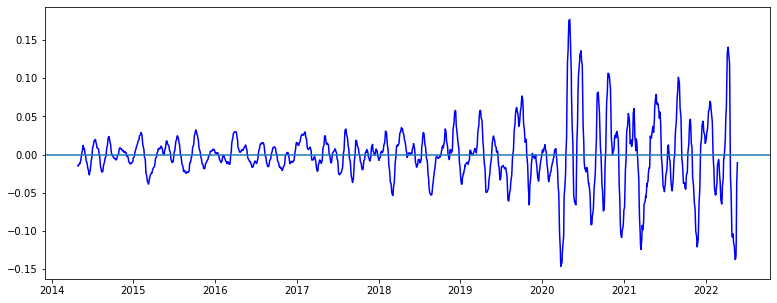

15 30 10 35


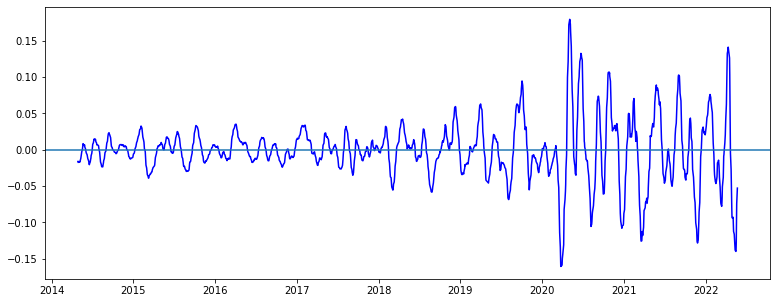

15 30 15 20


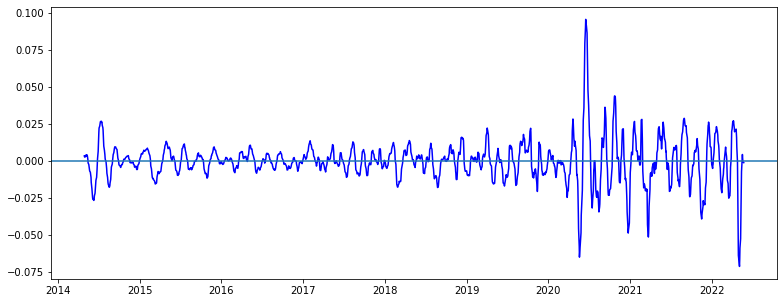

15 30 15 25


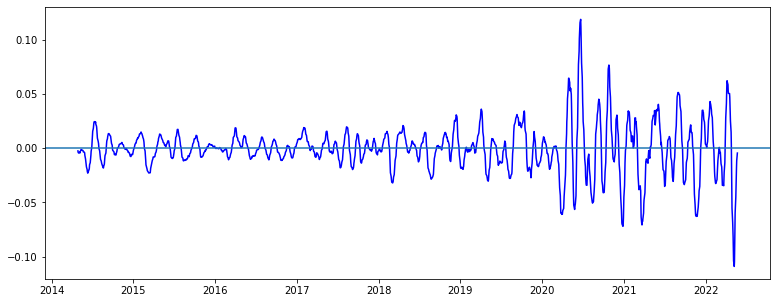

15 30 15 30


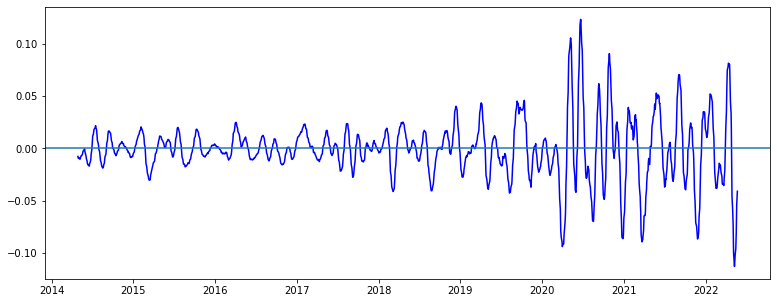

15 30 15 35


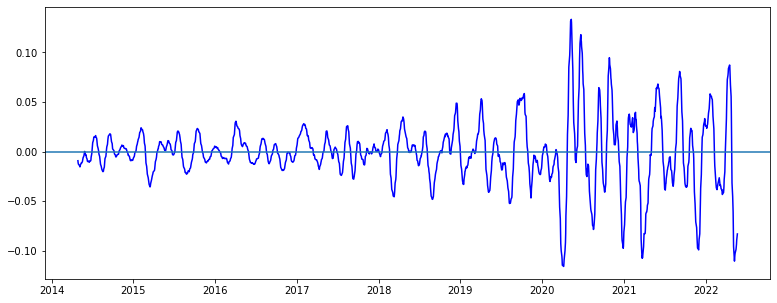

15 30 20 25


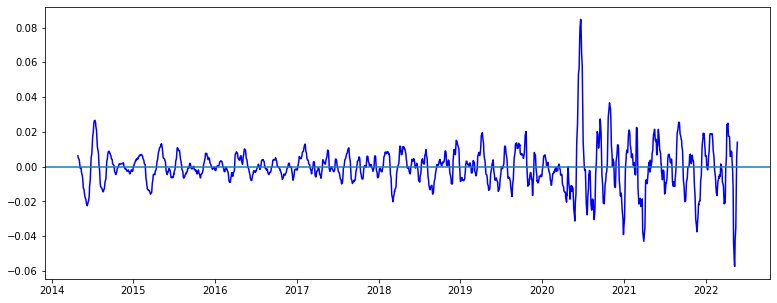

15 30 20 30


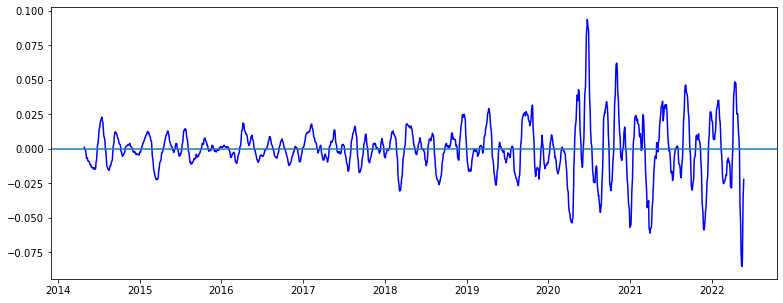

15 30 20 35


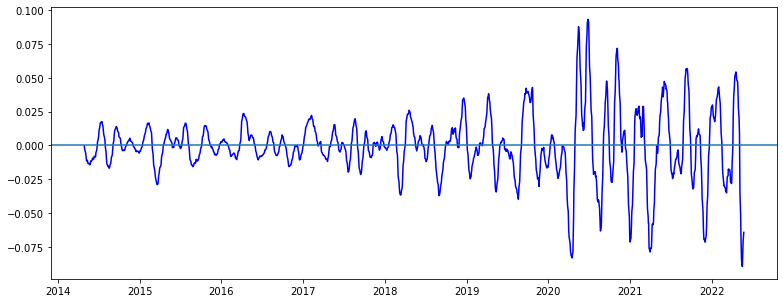

15 30 25 30


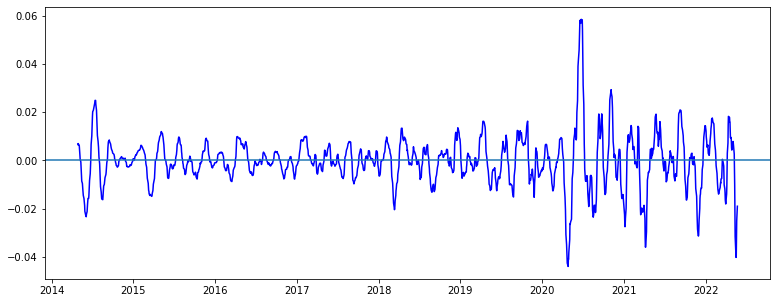

15 30 25 35


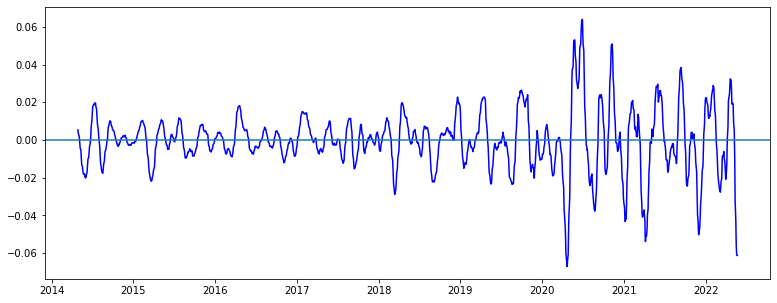

15 30 30 35


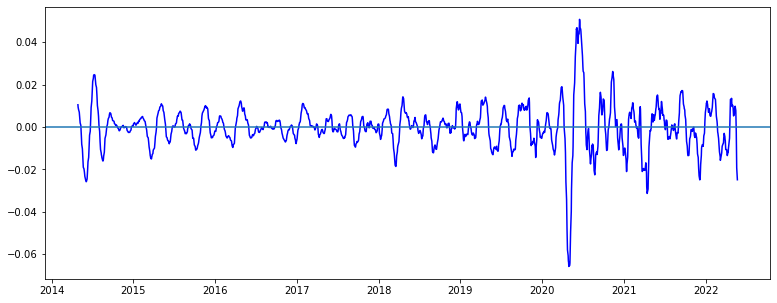

15 35 5 10


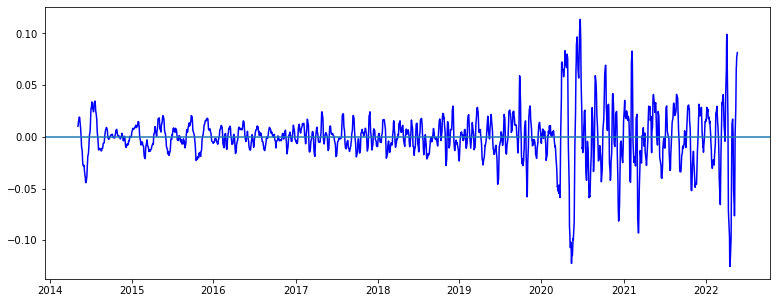

15 35 5 15


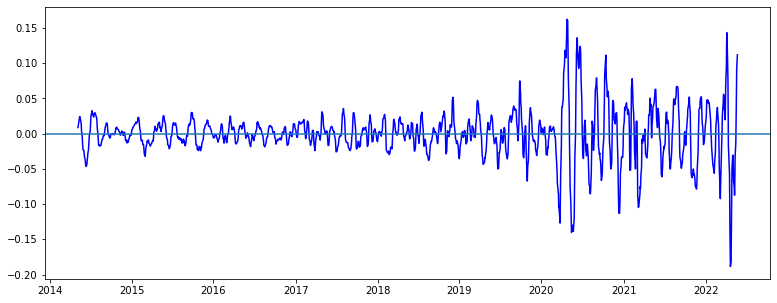

15 35 5 20


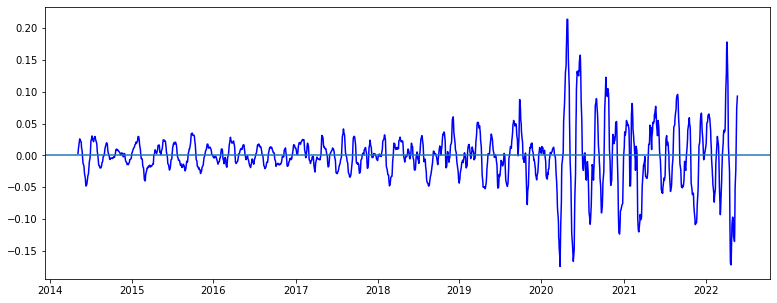

15 35 5 25


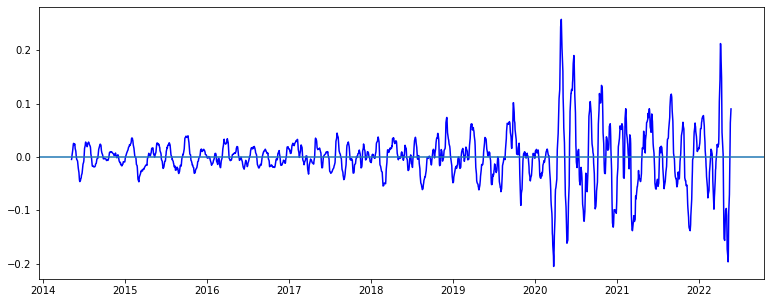

15 35 5 30


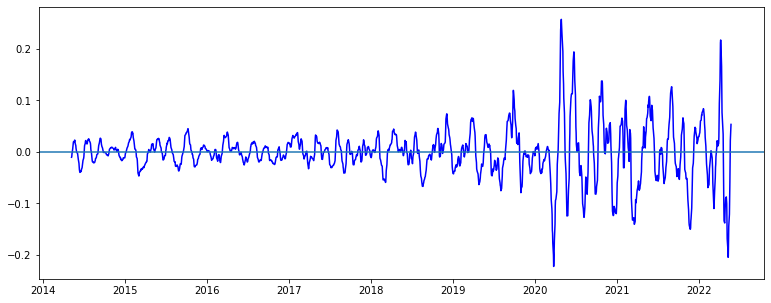

15 35 5 35


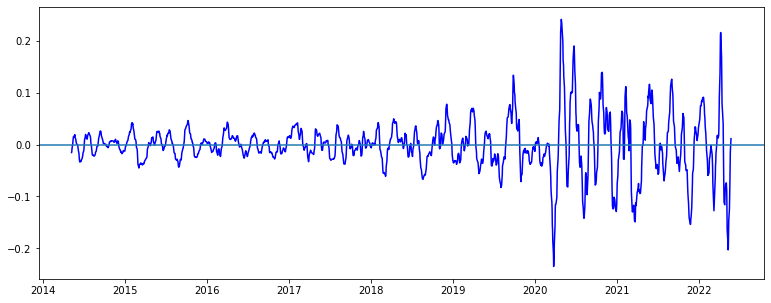

15 35 10 15


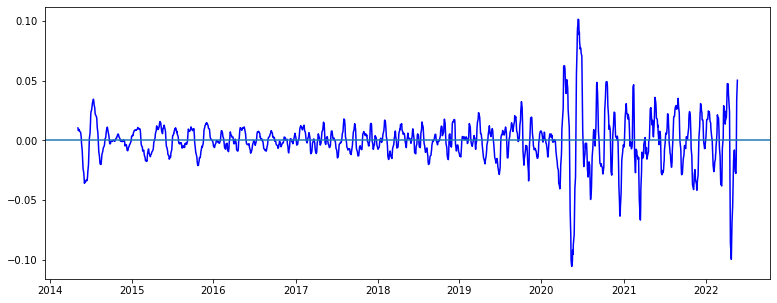

15 35 10 20


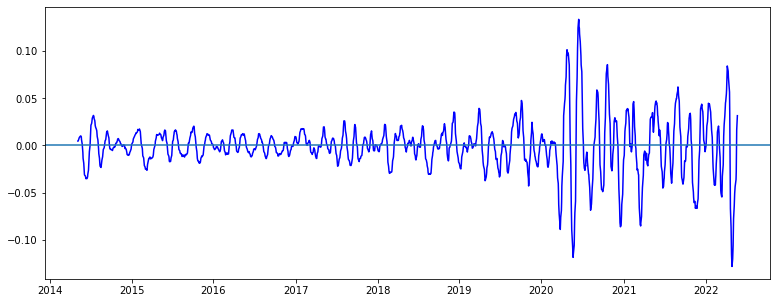

15 35 10 25


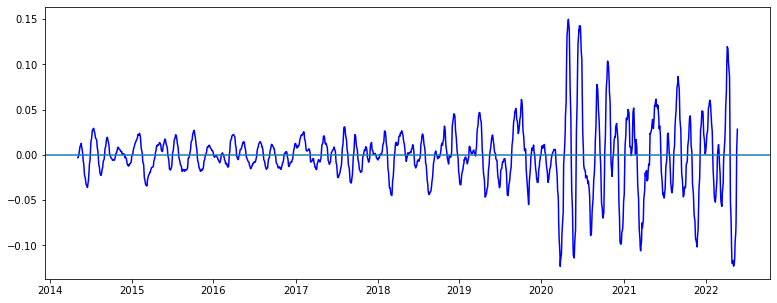

15 35 10 30


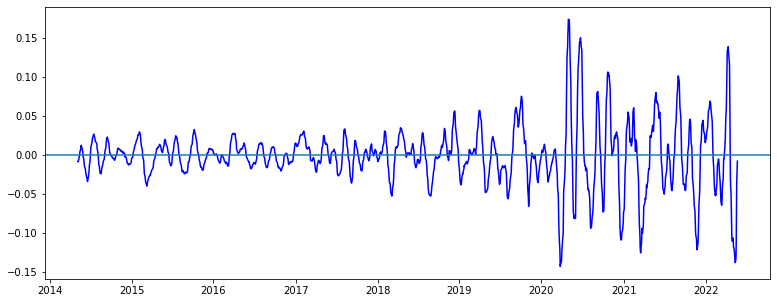

15 35 10 35


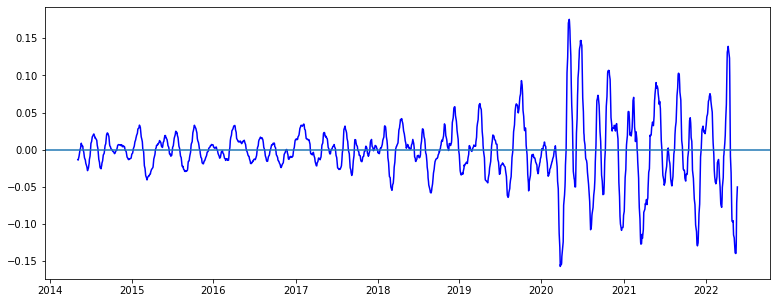

15 35 15 20


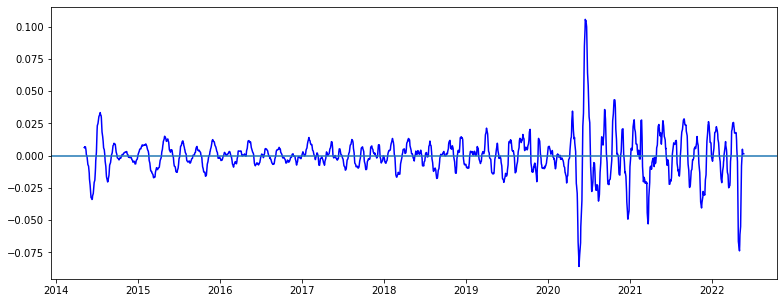

15 35 15 25


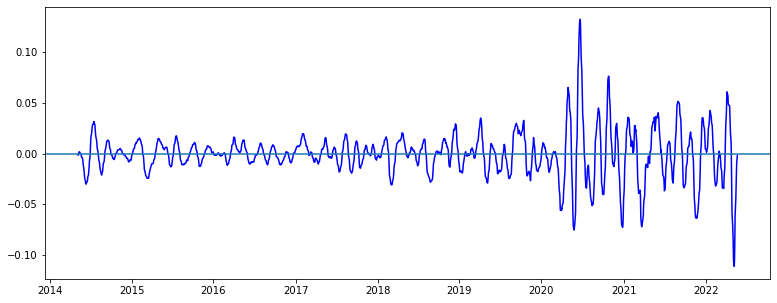

15 35 15 30


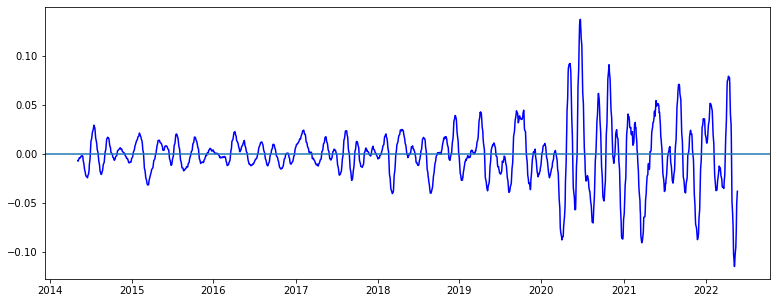

15 35 15 35


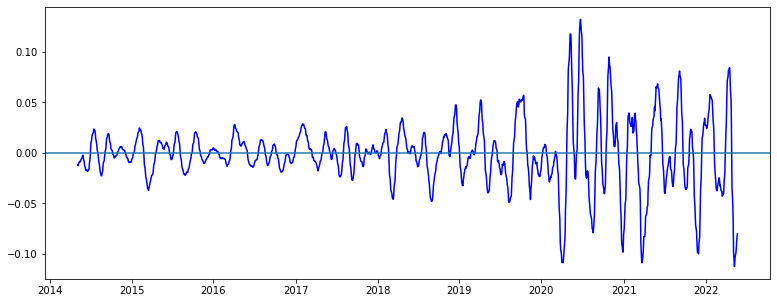

15 35 20 25


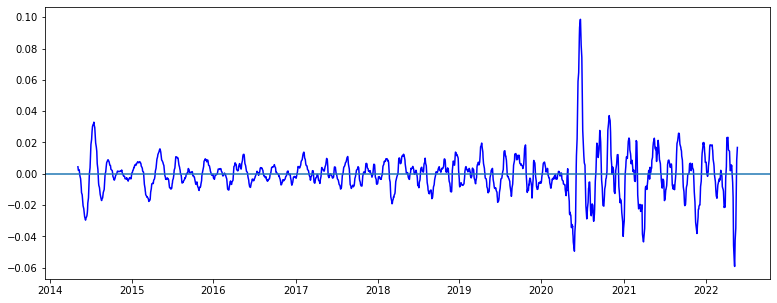

15 35 20 30


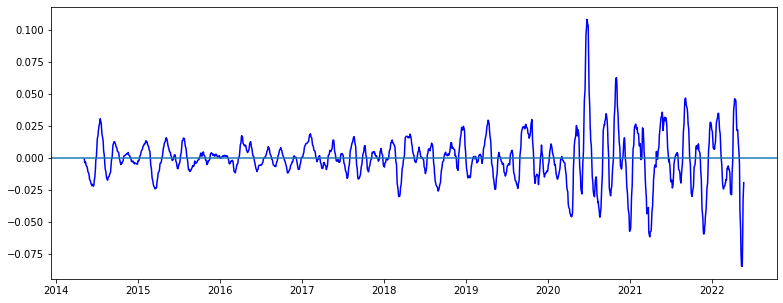

15 35 20 35


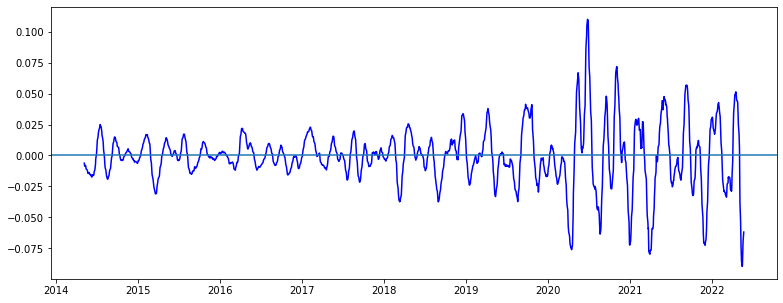

15 35 25 30


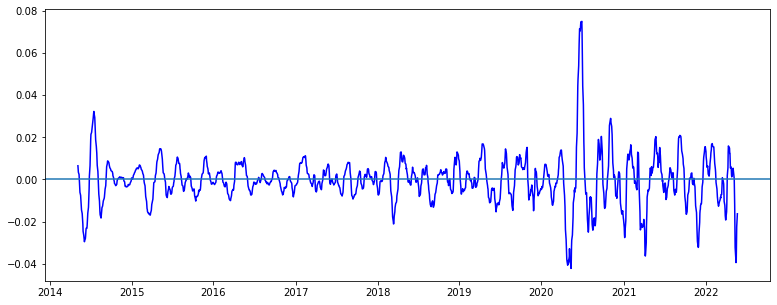

15 35 25 35


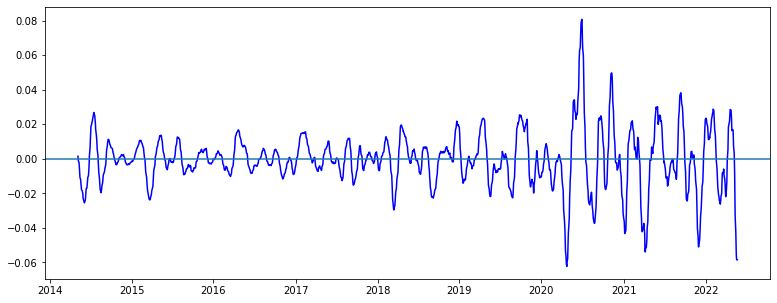

15 35 30 35


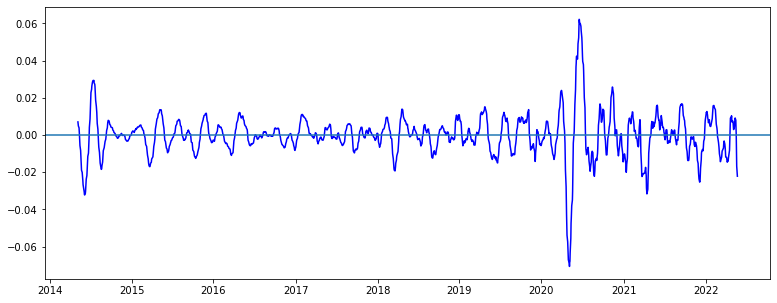

20 25 5 10


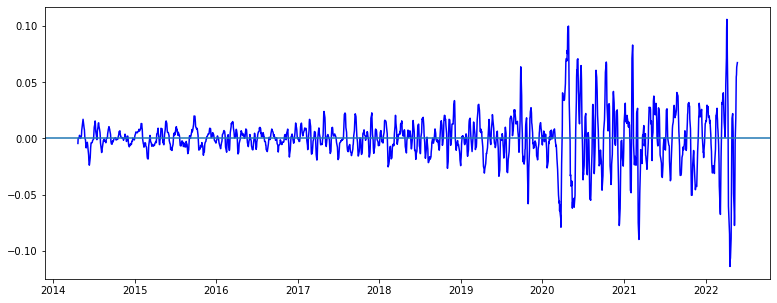

20 25 5 15


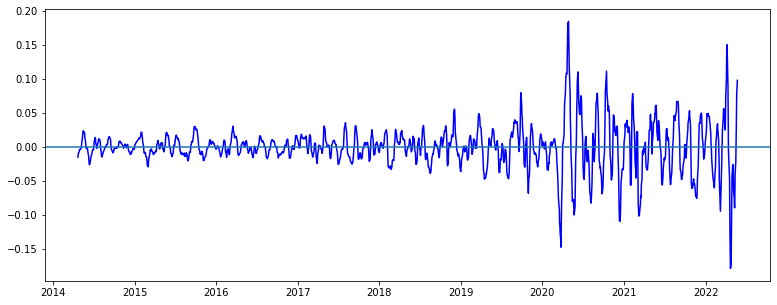

20 25 5 20


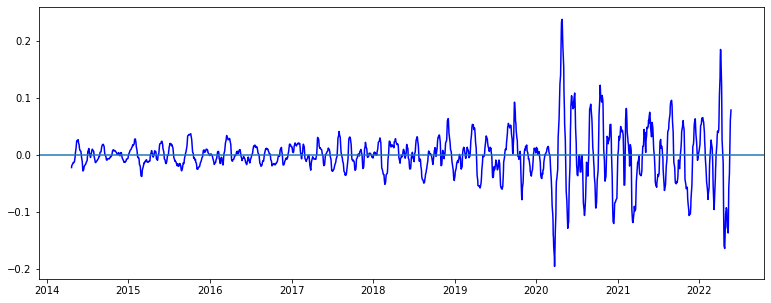

20 25 5 25


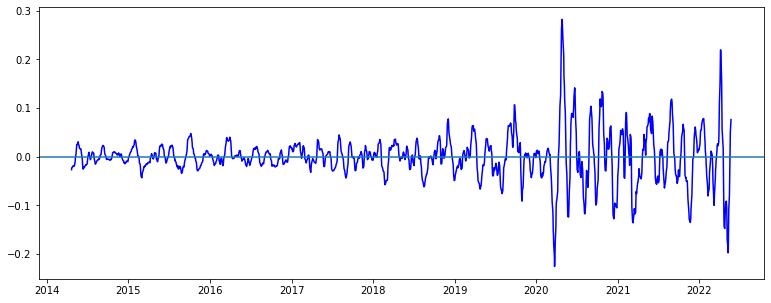

20 25 5 30


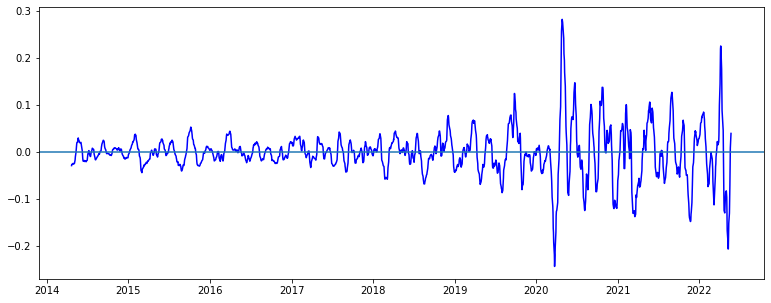

20 25 5 35


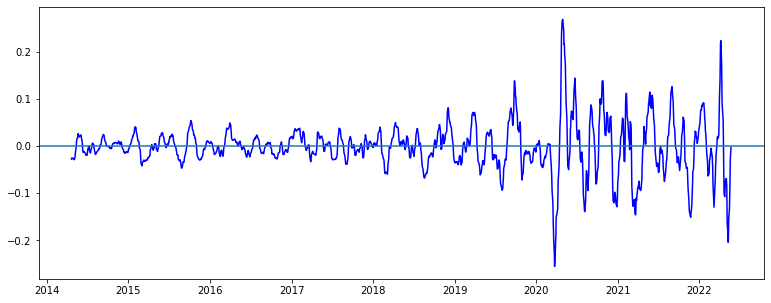

20 25 10 15


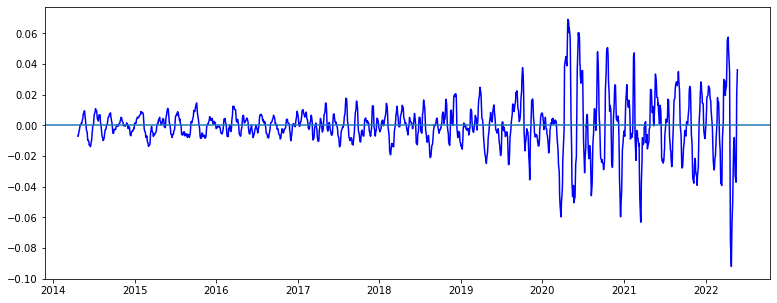

20 25 10 20


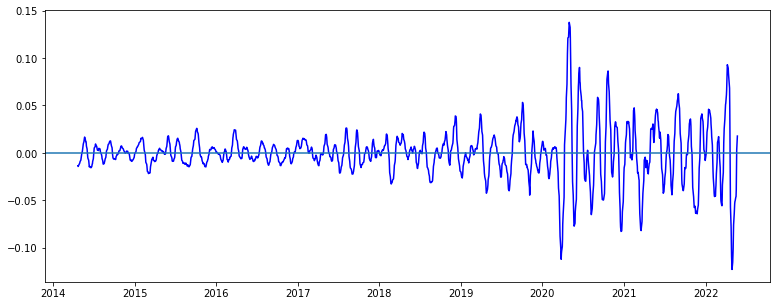

20 25 10 25


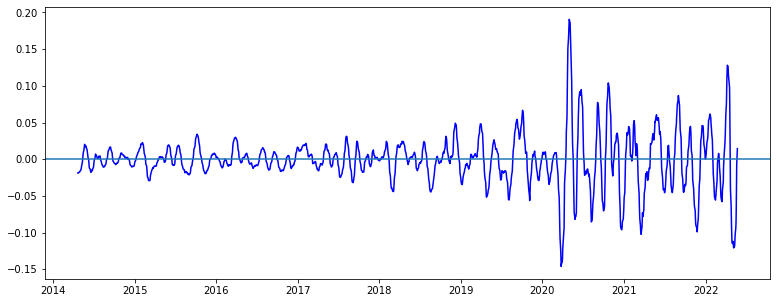

20 25 10 30


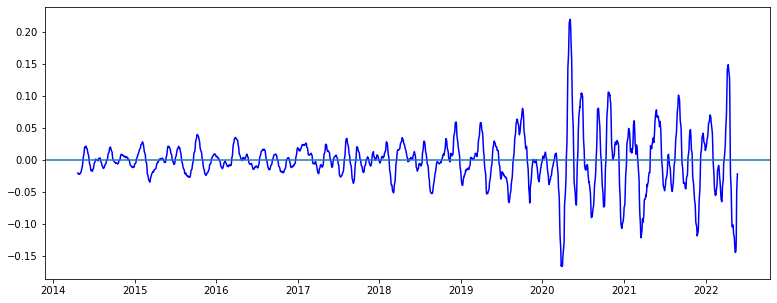

20 25 10 35


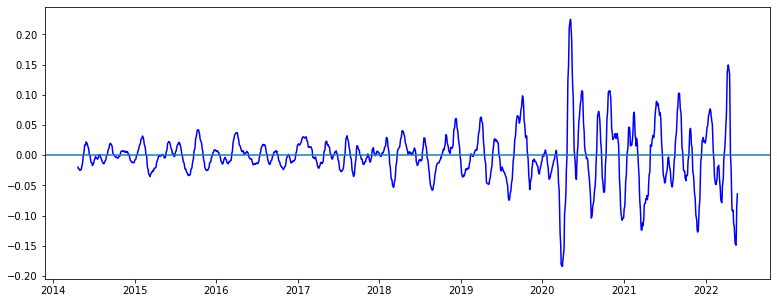

20 25 15 20


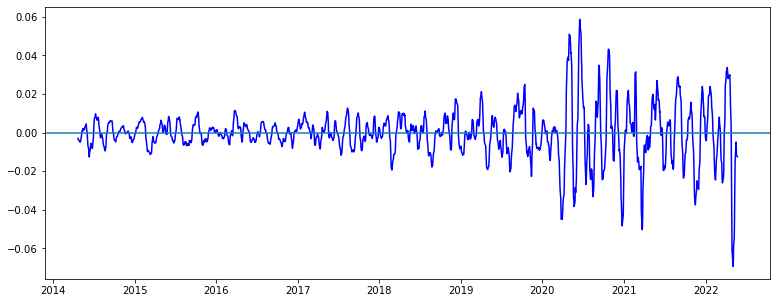

20 25 15 25


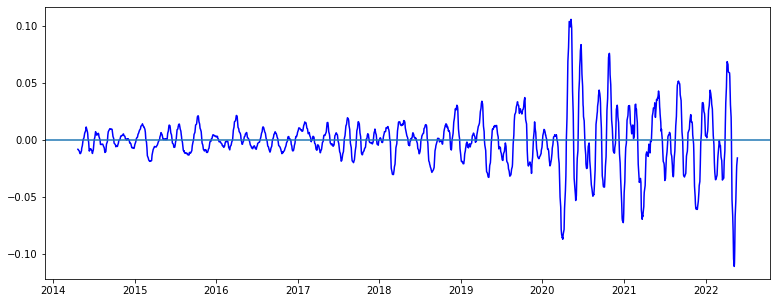

20 25 15 30


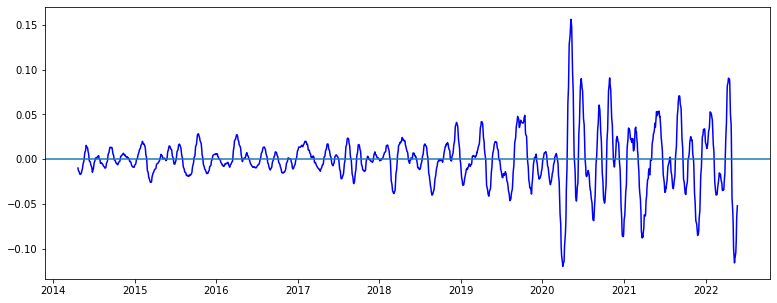

20 25 15 35


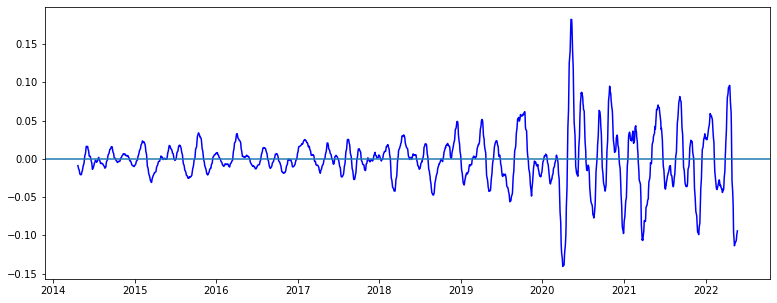

20 25 20 25


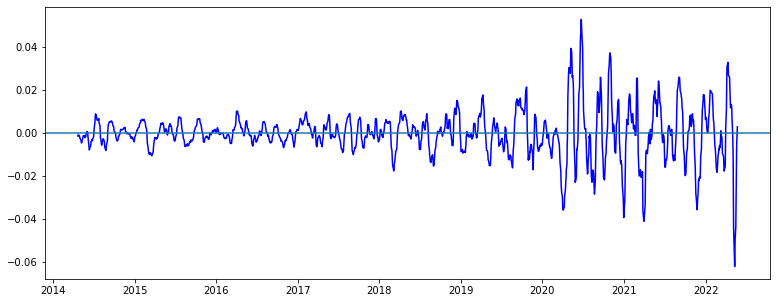

20 25 20 30


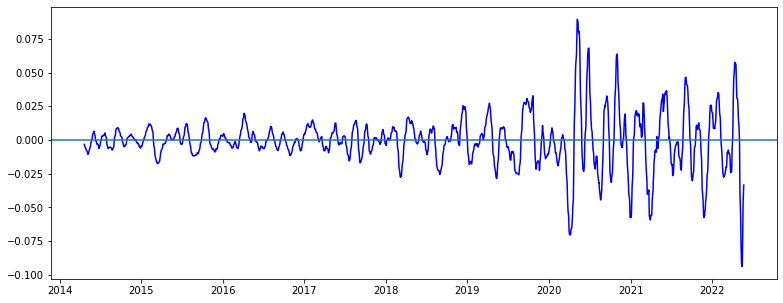

20 25 20 35


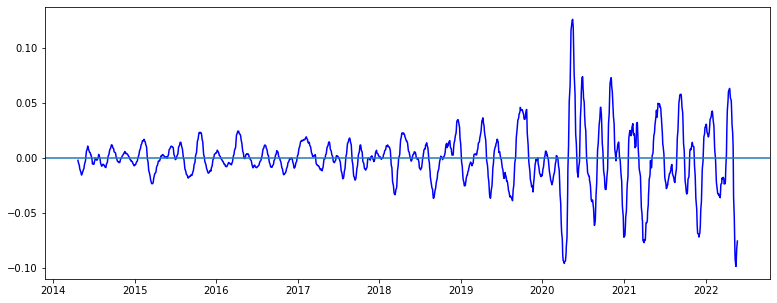

20 25 25 30


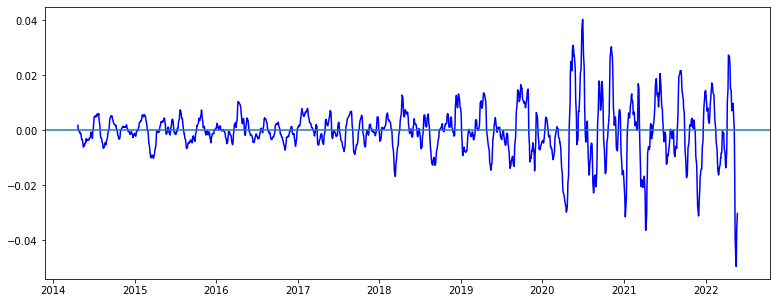

20 25 25 35


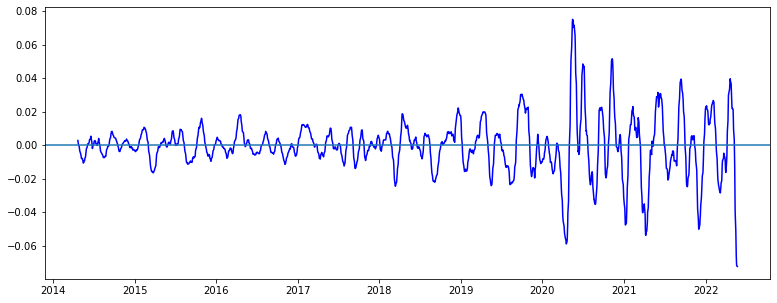

20 25 30 35


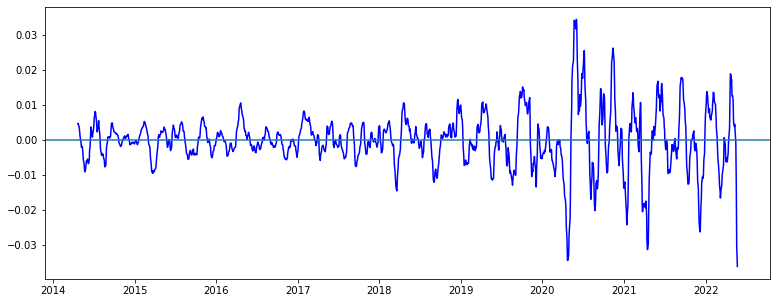

20 30 5 10


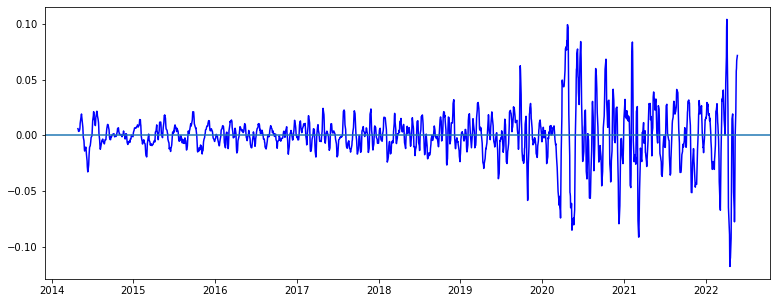

20 30 5 15


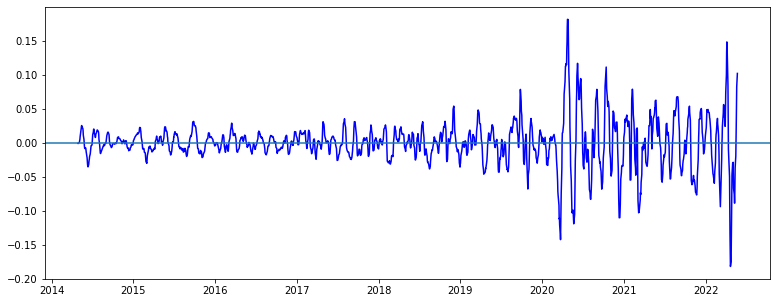

20 30 5 20


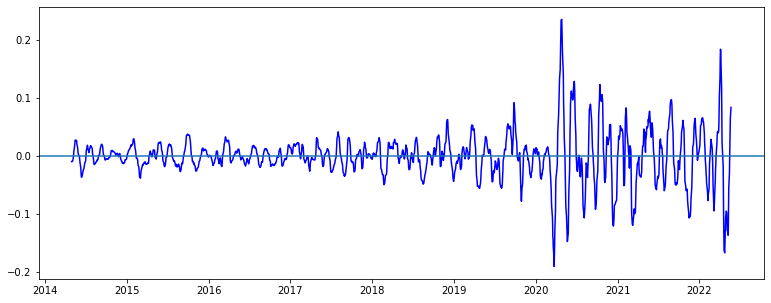

20 30 5 25


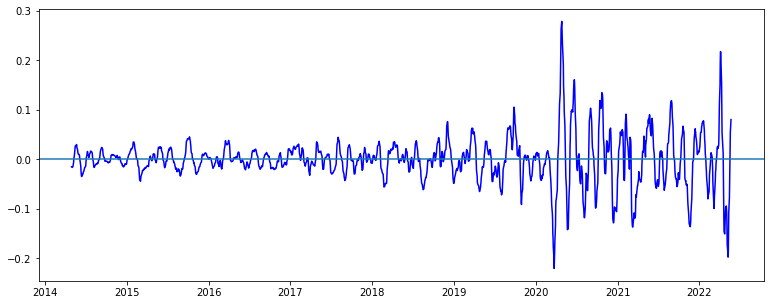

20 30 5 30


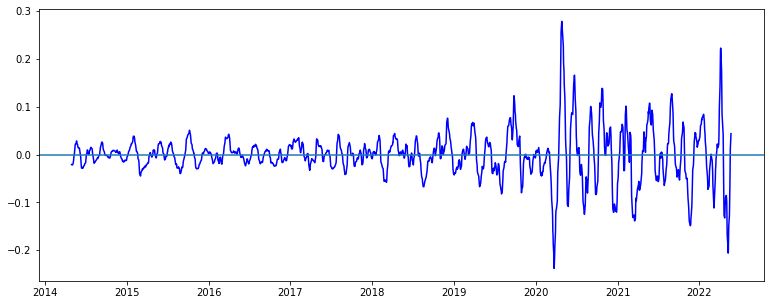

20 30 5 35


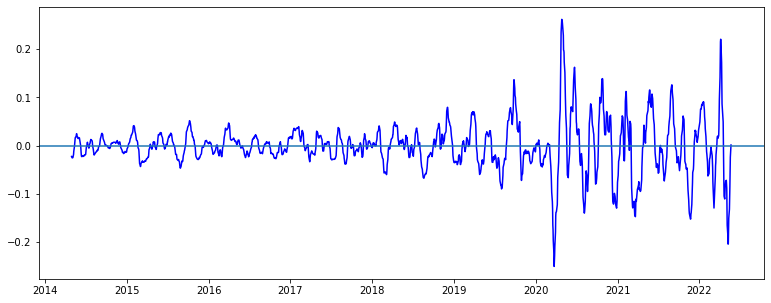

20 30 10 15


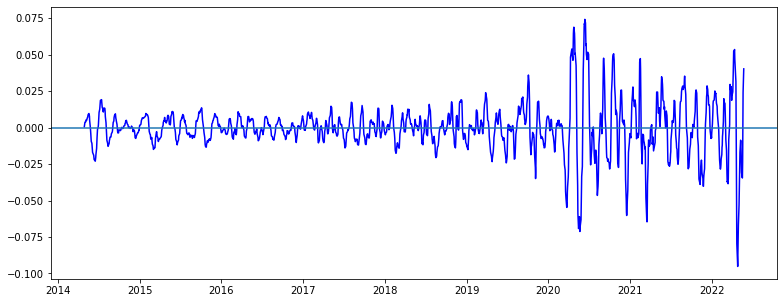

20 30 10 20


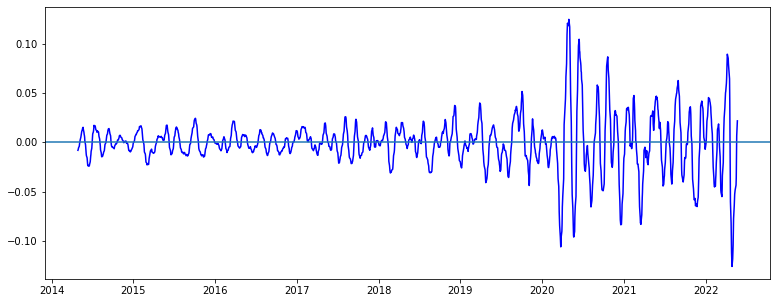

20 30 10 25


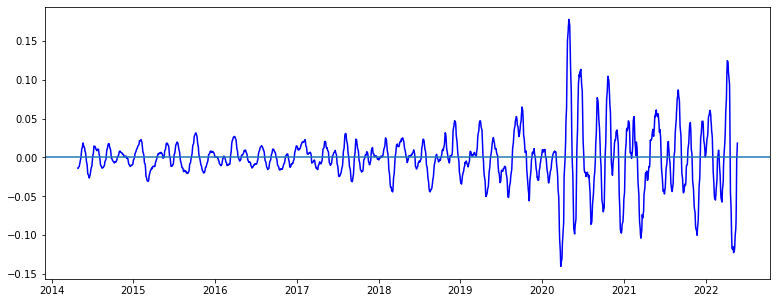

20 30 10 30


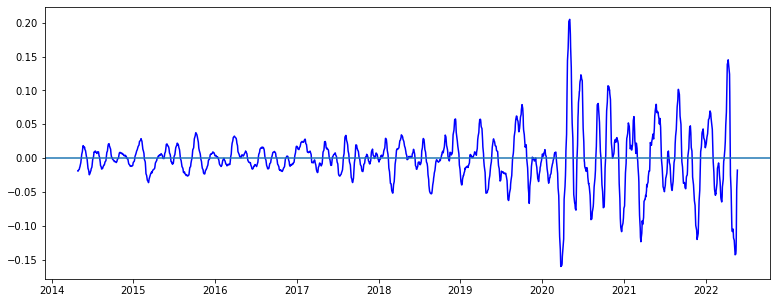

20 30 10 35


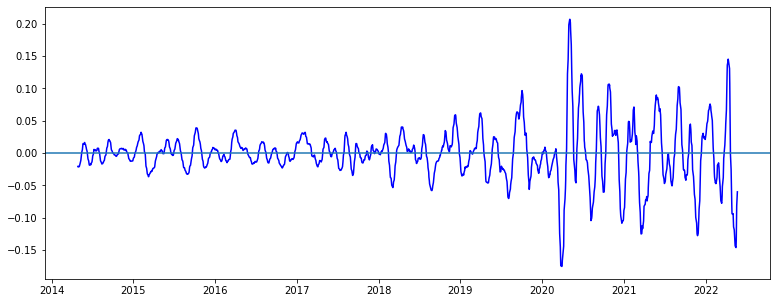

20 30 15 20


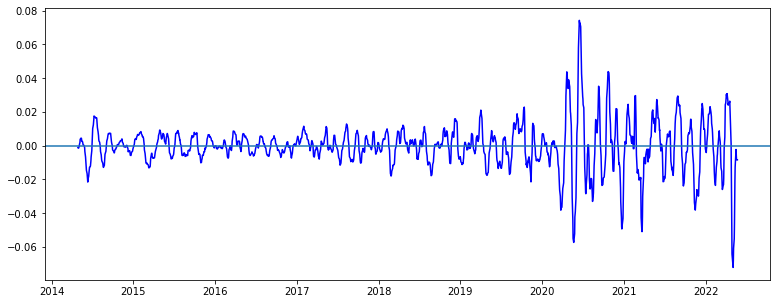

20 30 15 25


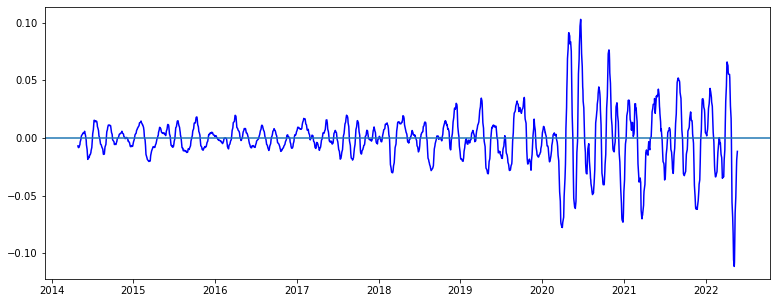

20 30 15 30


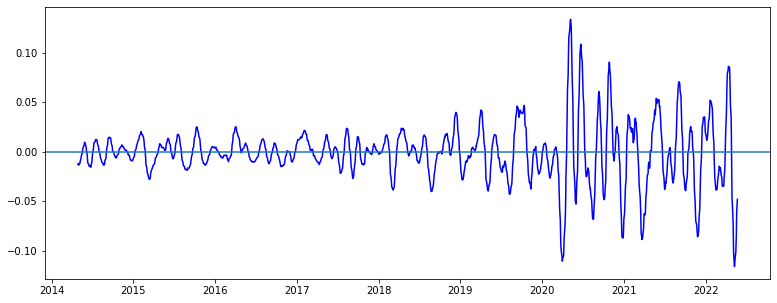

20 30 15 35


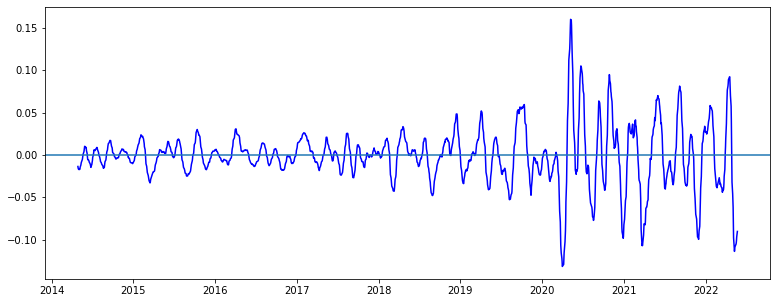

20 30 20 25


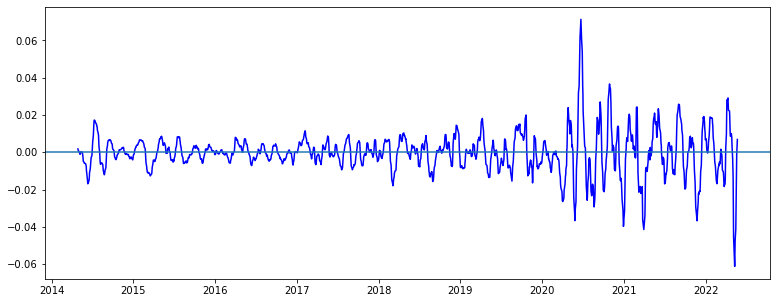

20 30 20 30


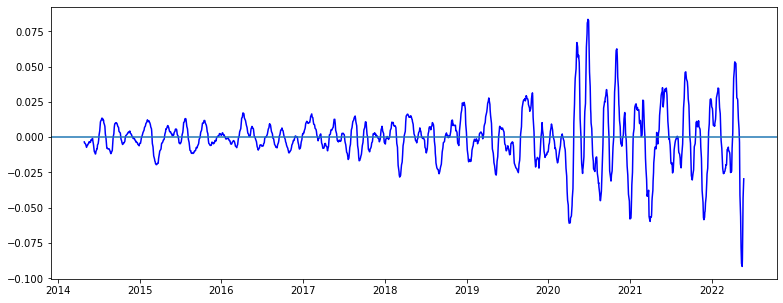

20 30 20 35


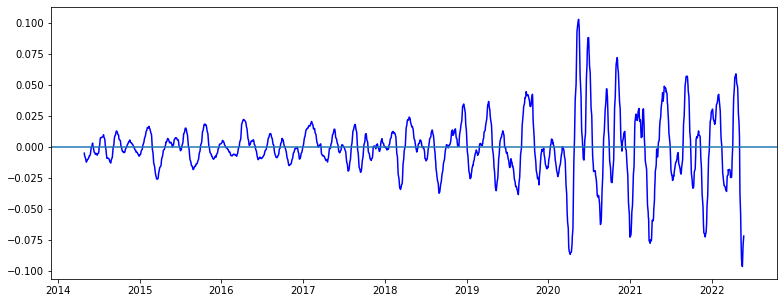

20 30 25 30


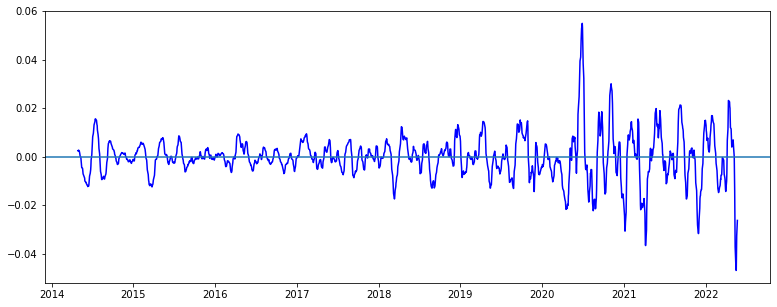

20 30 25 35


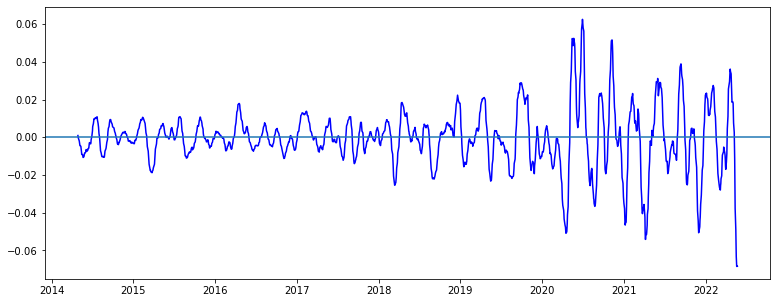

20 30 30 35


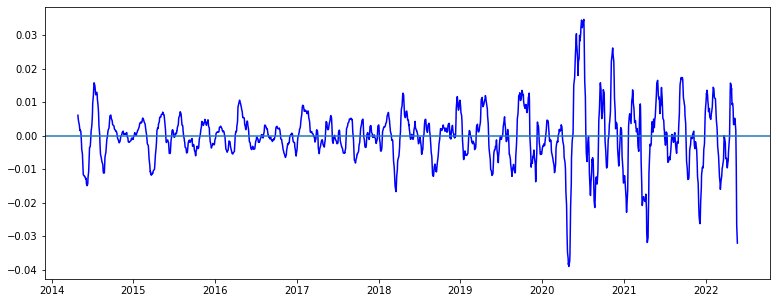

20 35 5 10


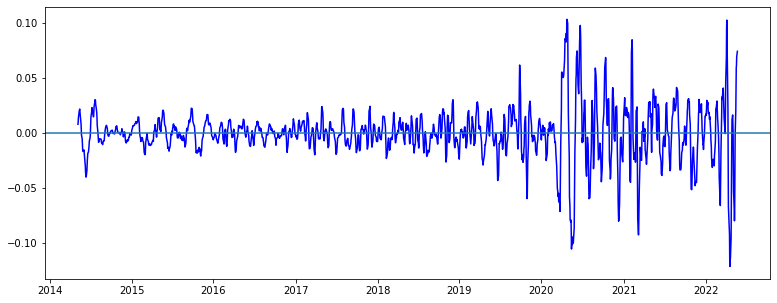

20 35 5 15


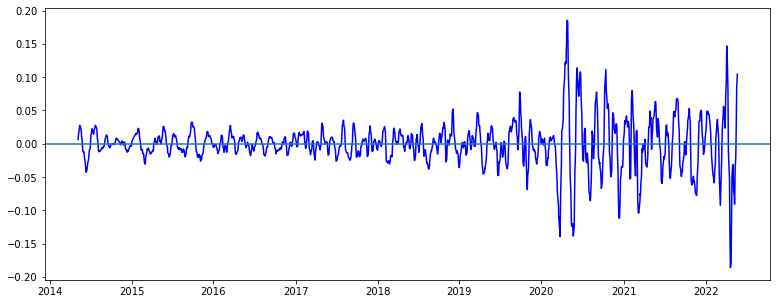

20 35 5 20


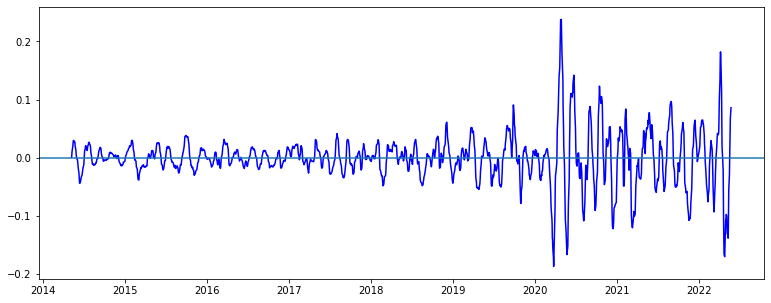

20 35 5 25


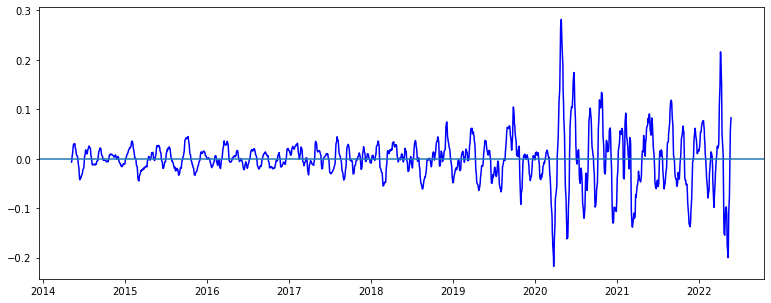

20 35 5 30


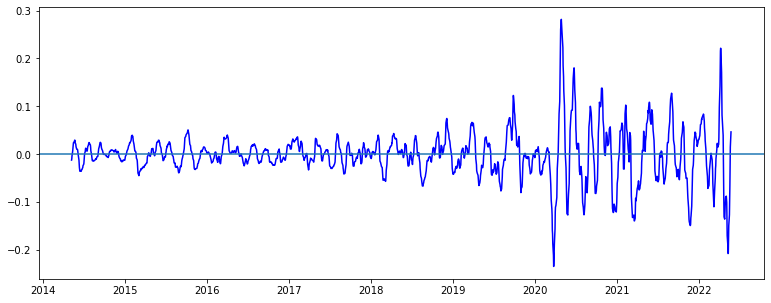

20 35 5 35


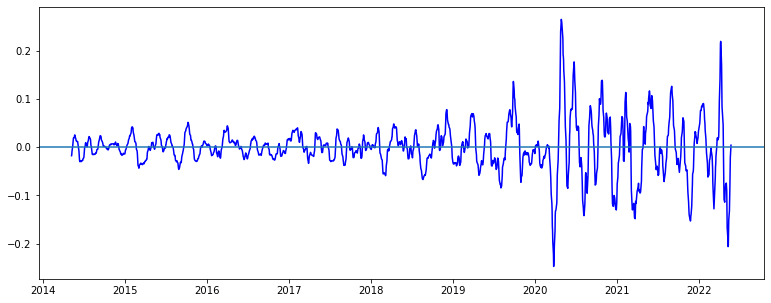

20 35 10 15


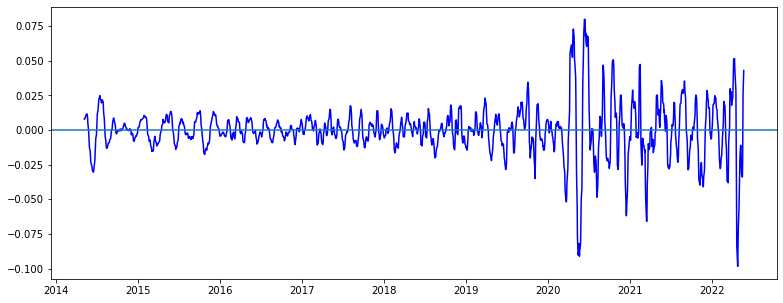

20 35 10 20


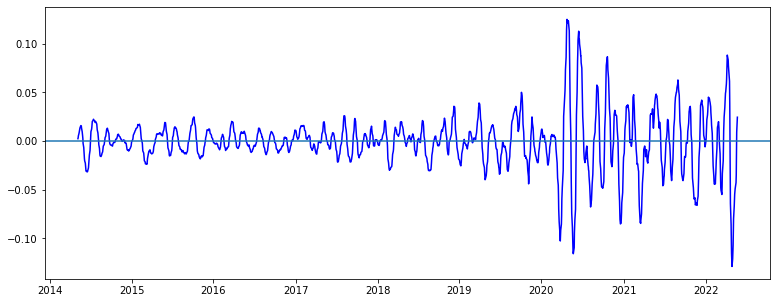

20 35 10 25


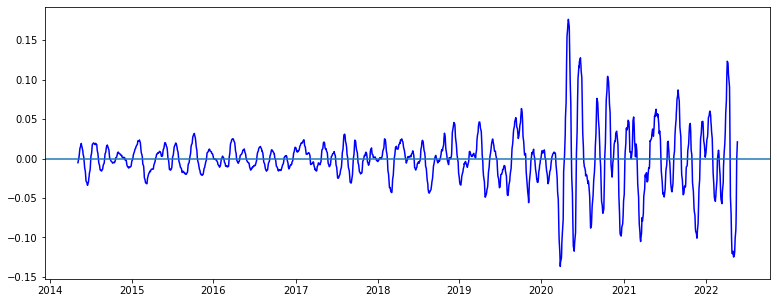

20 35 10 30


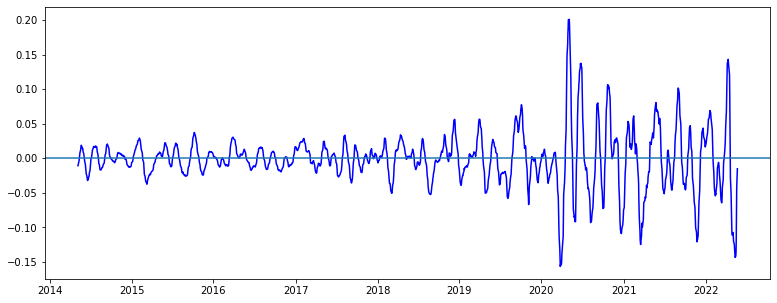

20 35 10 35


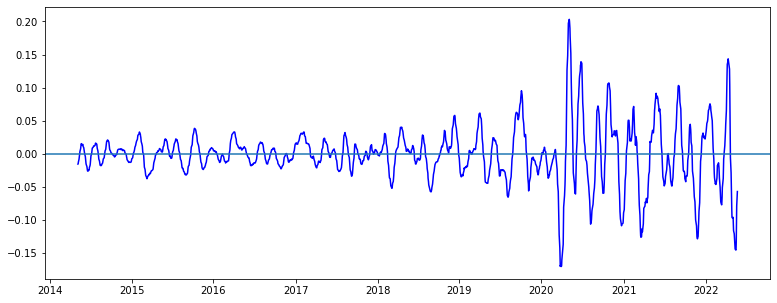

20 35 15 20


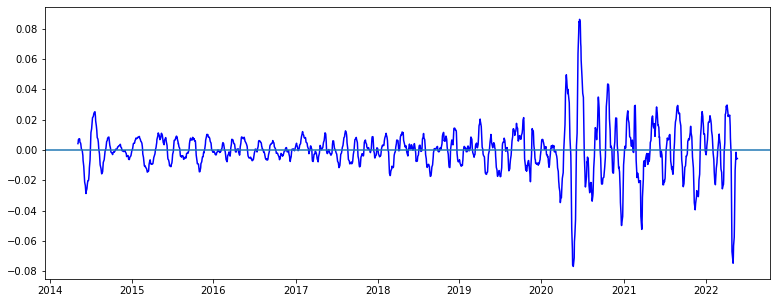

20 35 15 25


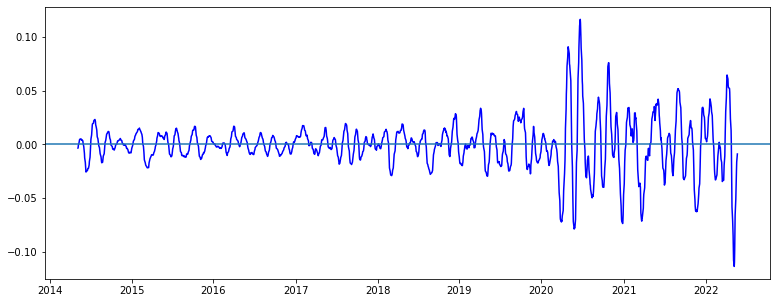

20 35 15 30


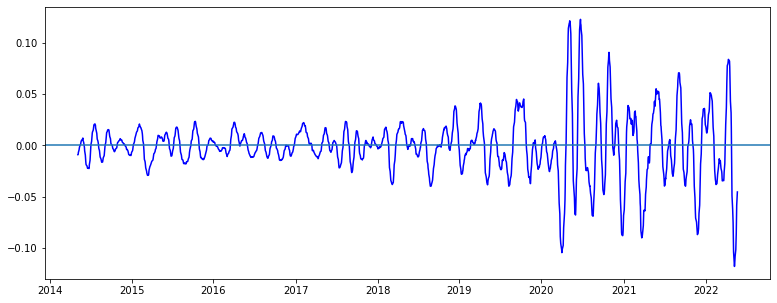

20 35 15 35


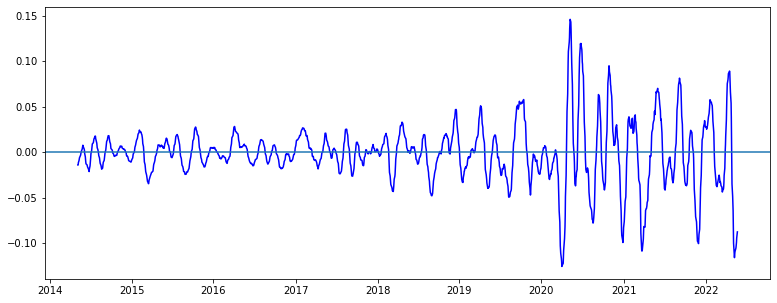

20 35 20 25


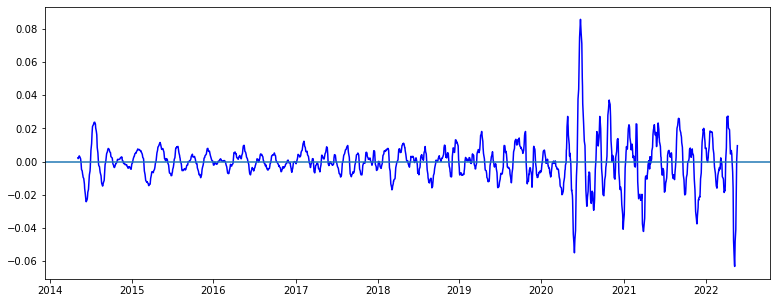

20 35 20 30


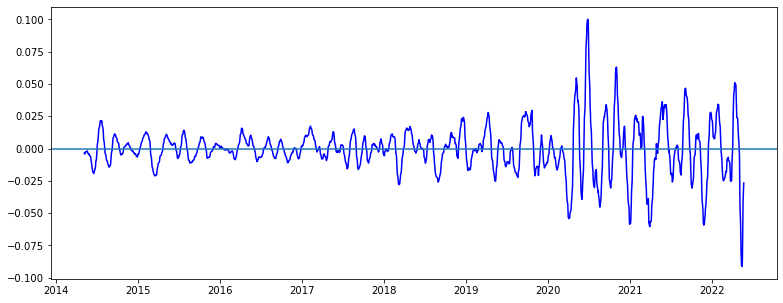

20 35 20 35


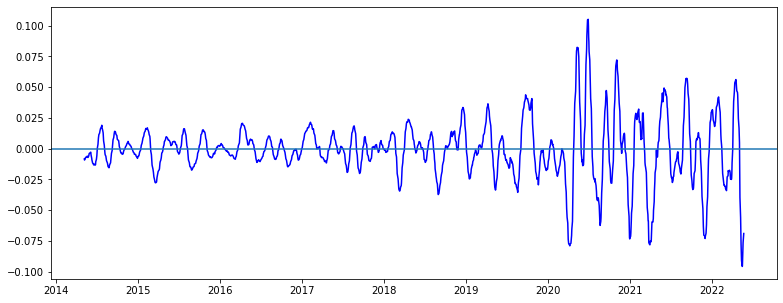

20 35 25 30


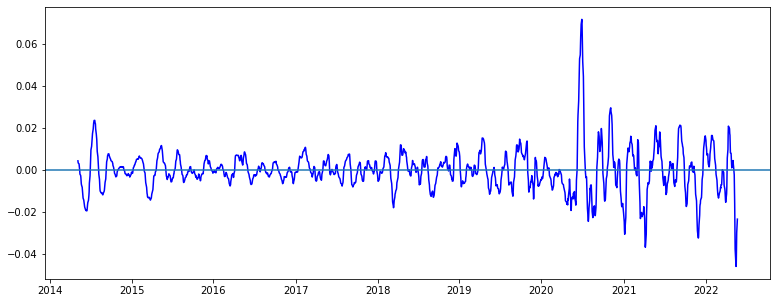

20 35 25 35


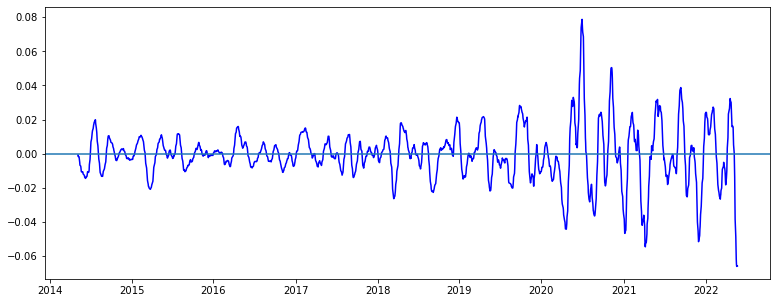

20 35 30 35


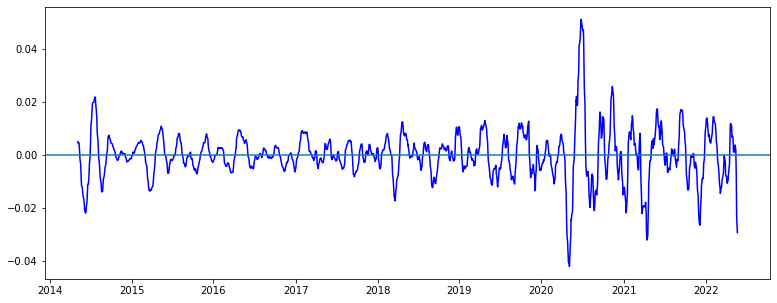

25 30 5 10


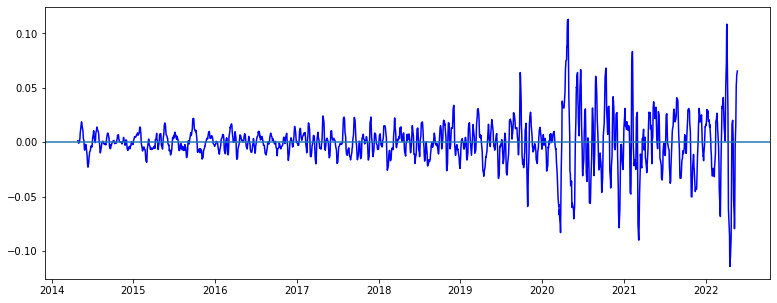

25 30 5 15


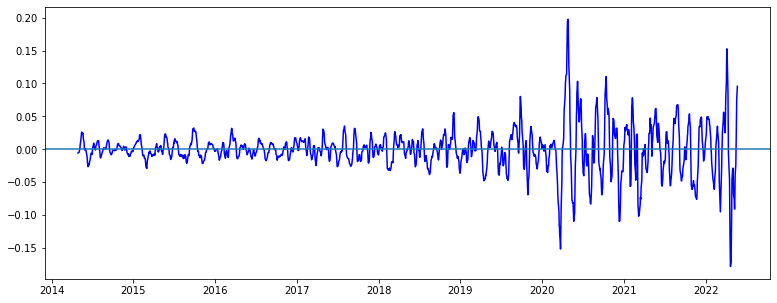

25 30 5 20


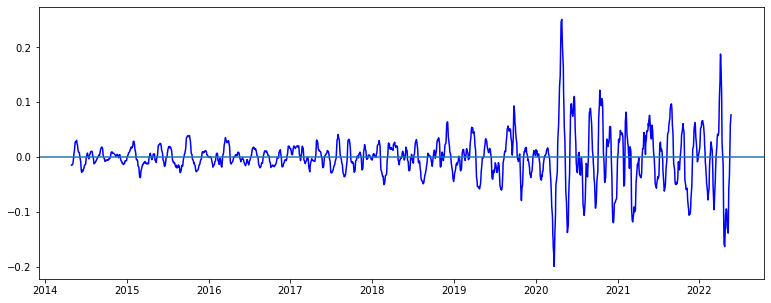

25 30 5 25


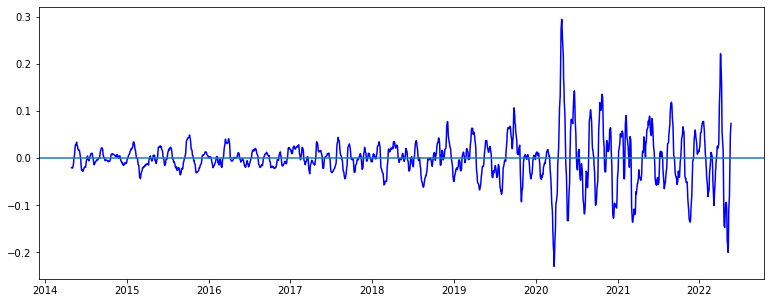

25 30 5 30


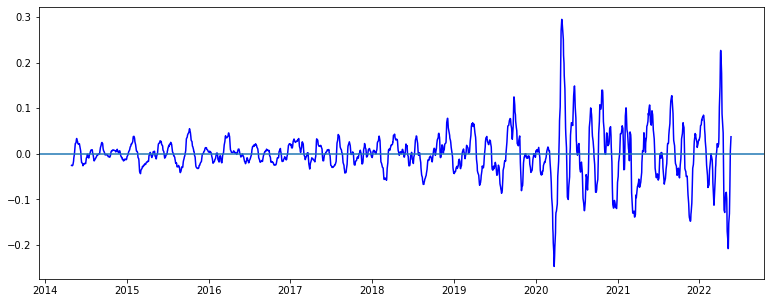

25 30 5 35


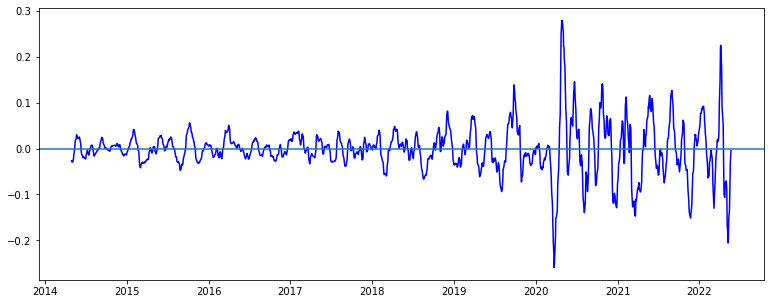

25 30 10 15


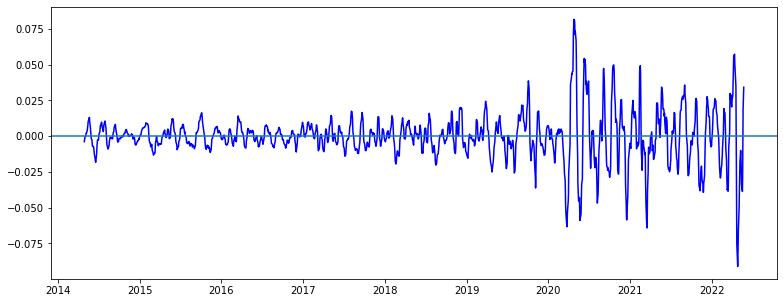

25 30 10 20


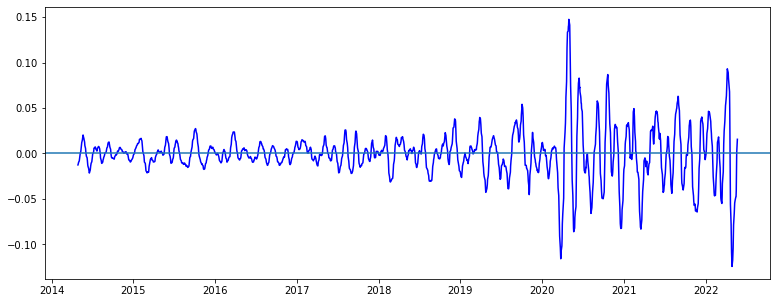

25 30 10 25


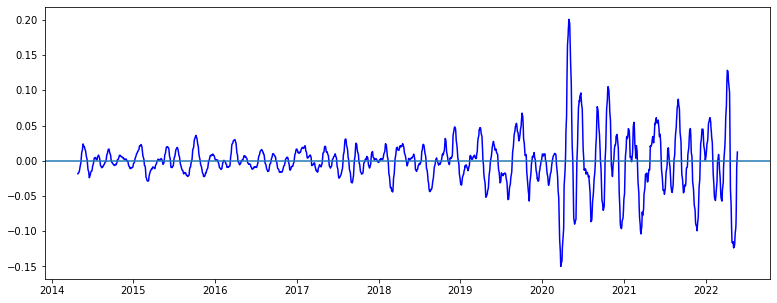

25 30 10 30


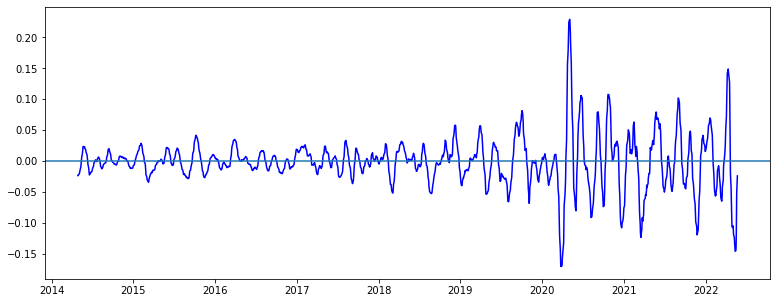

25 30 10 35


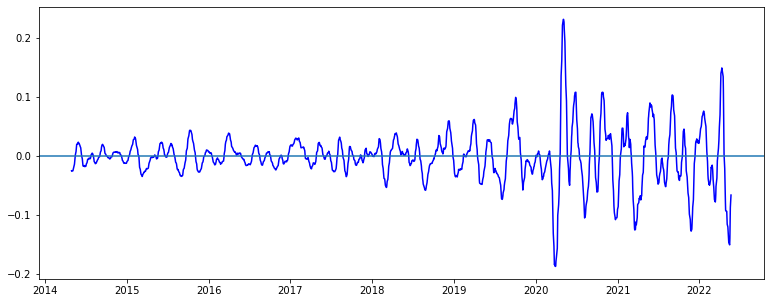

25 30 15 20


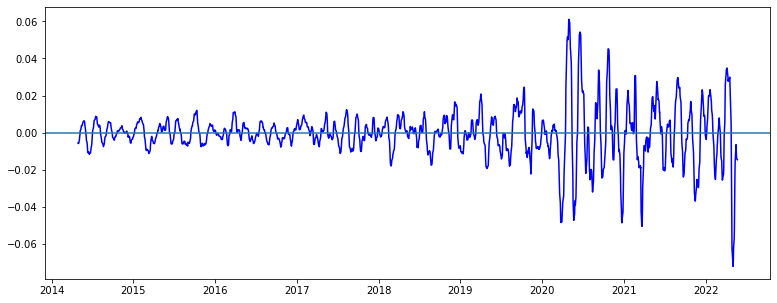

25 30 15 25


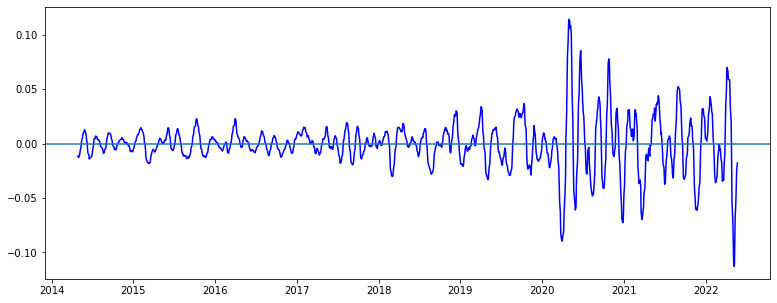

25 30 15 30


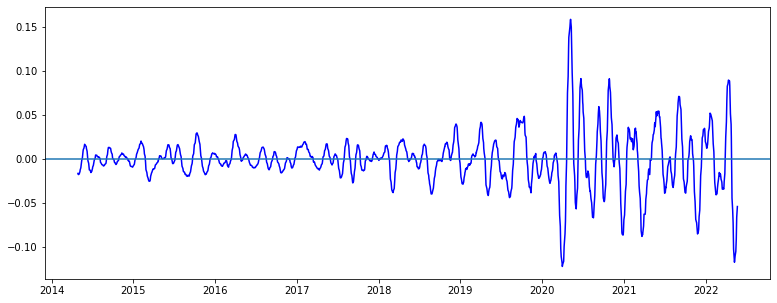

25 30 15 35


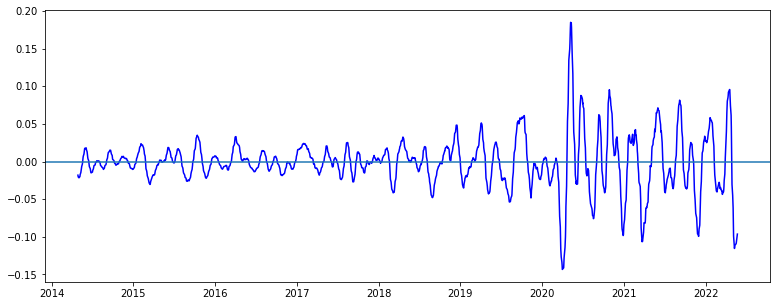

25 30 20 25


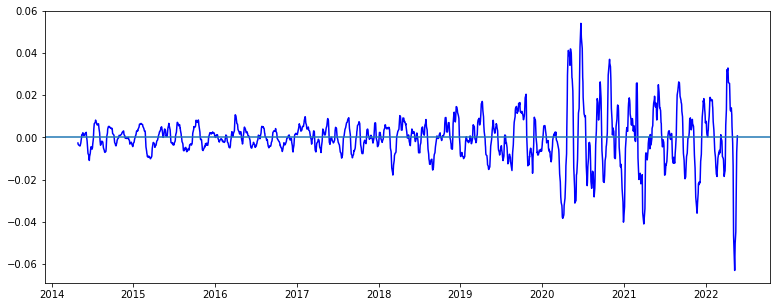

25 30 20 30


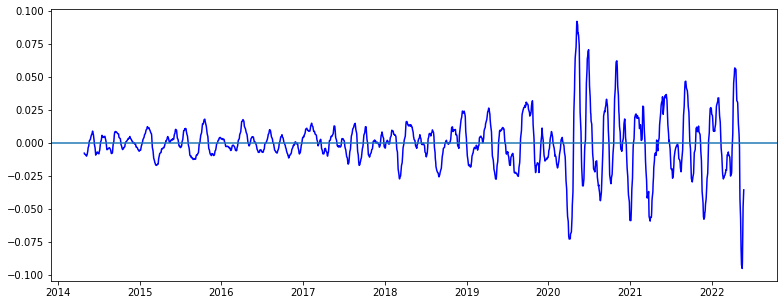

25 30 20 35


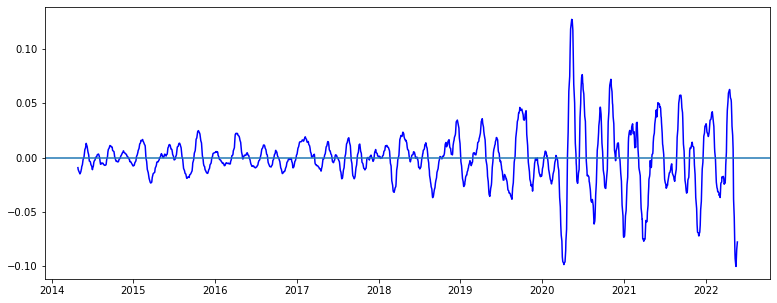

25 30 25 30


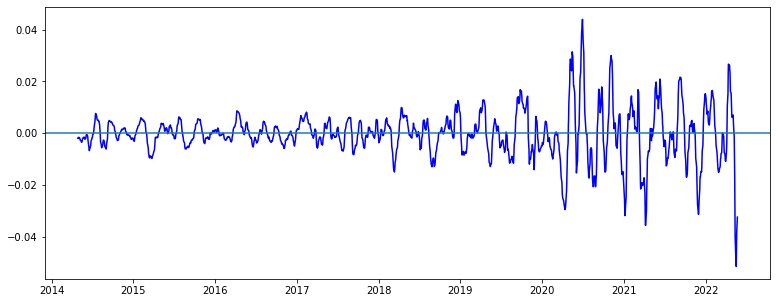

25 30 25 35


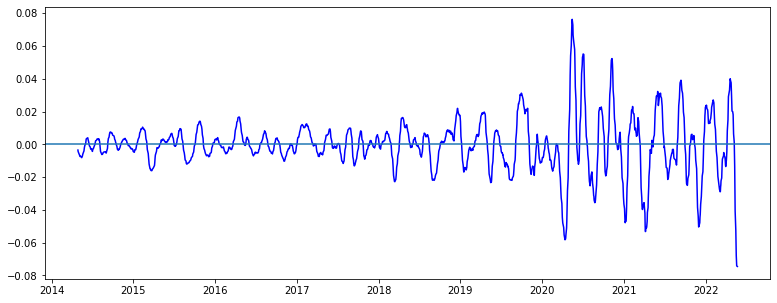

25 30 30 35


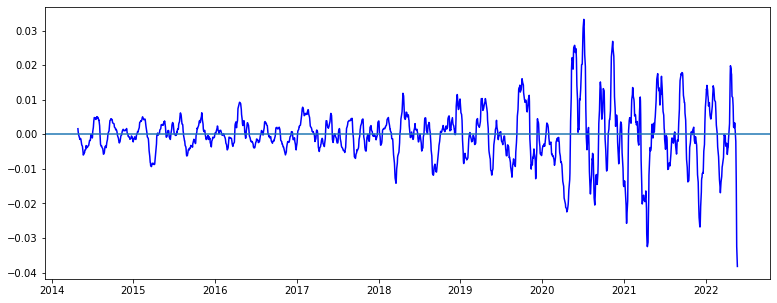

25 35 5 10


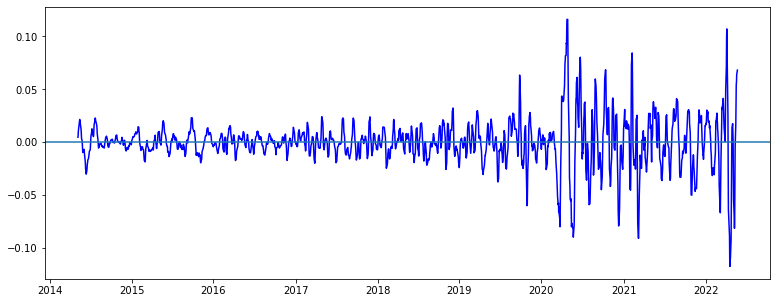

25 35 5 15


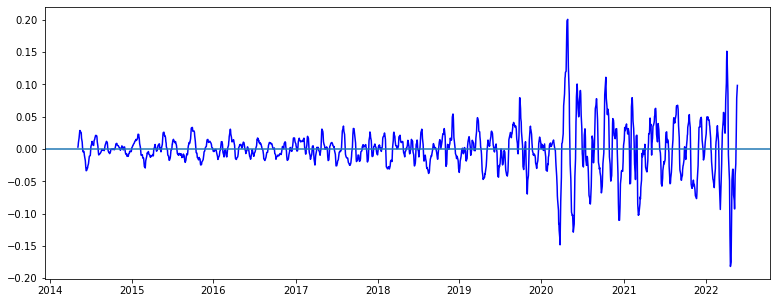

25 35 5 20


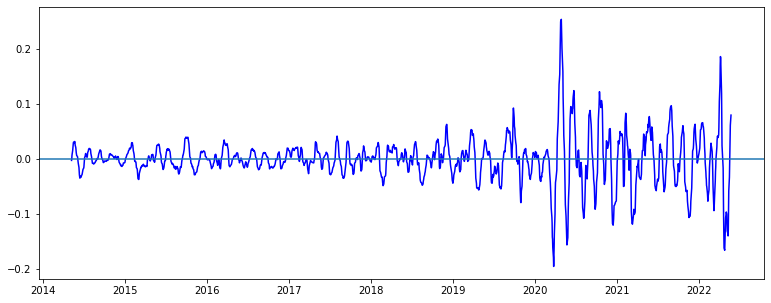

25 35 5 25


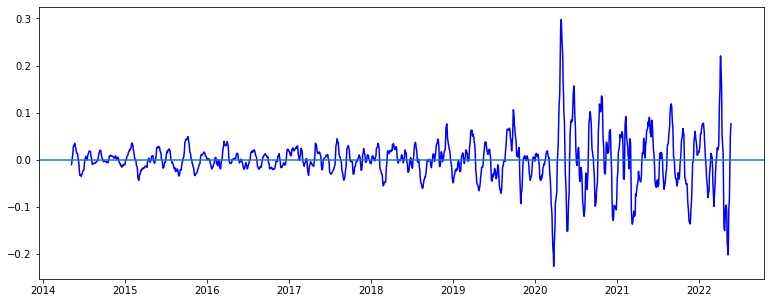

25 35 5 30


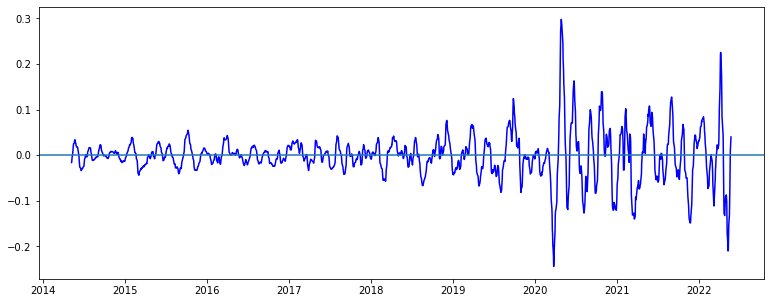

25 35 5 35


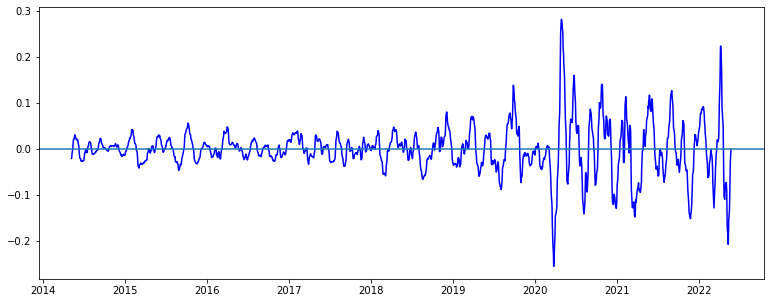

25 35 10 15


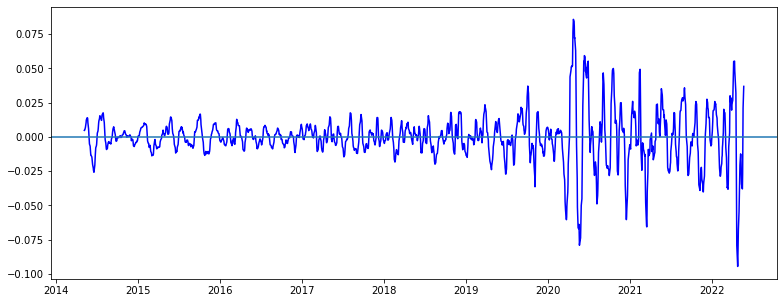

25 35 10 20


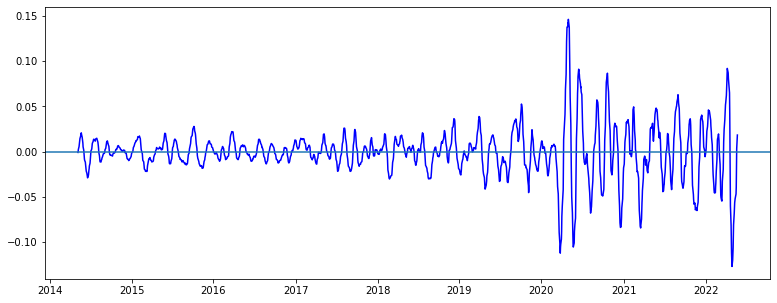

25 35 10 25


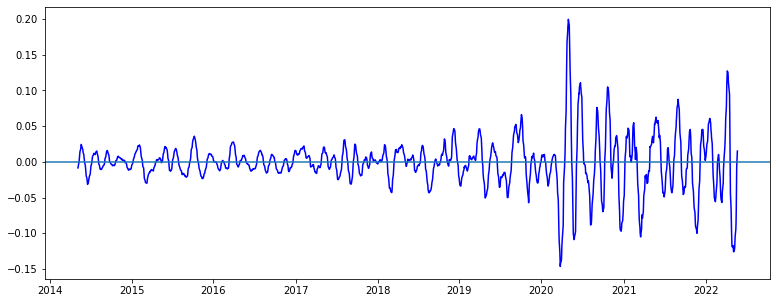

25 35 10 30


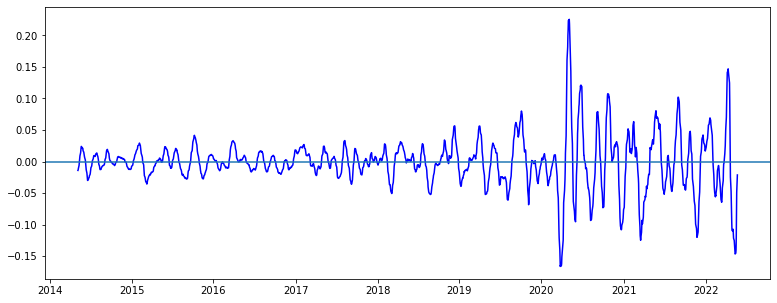

25 35 10 35


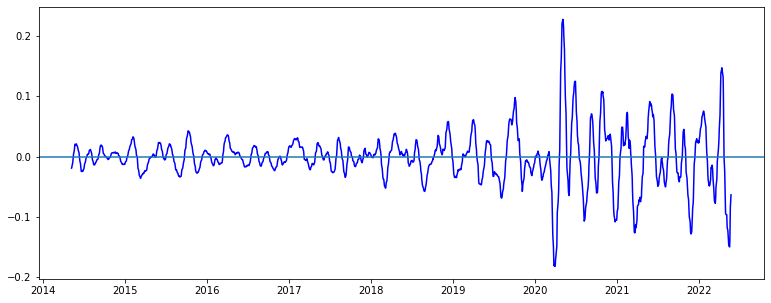

25 35 15 20


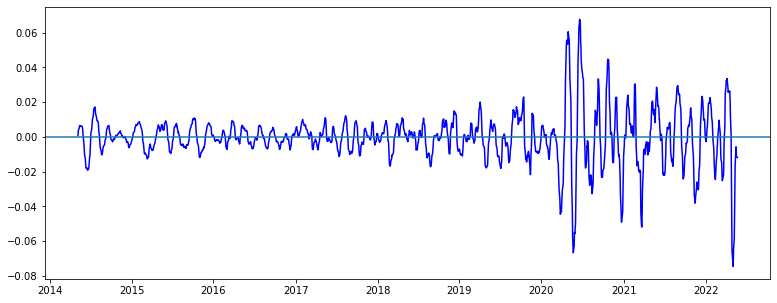

25 35 15 25


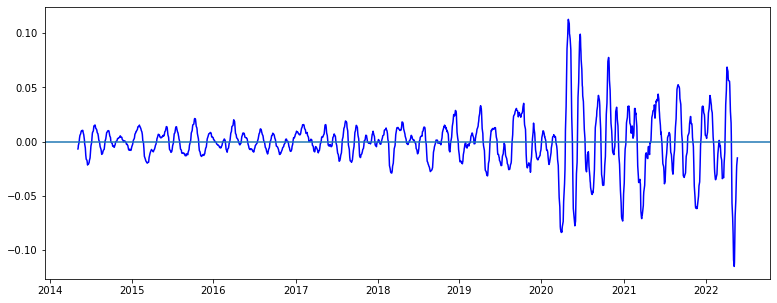

25 35 15 30


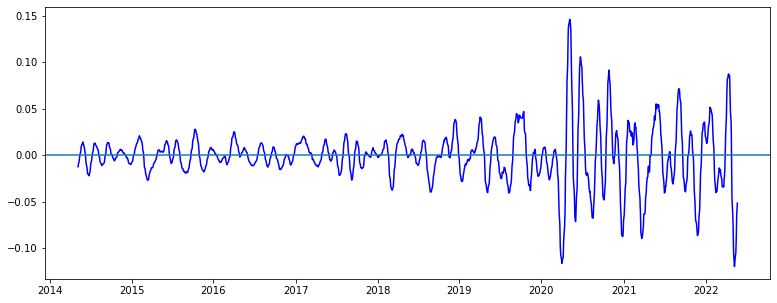

25 35 15 35


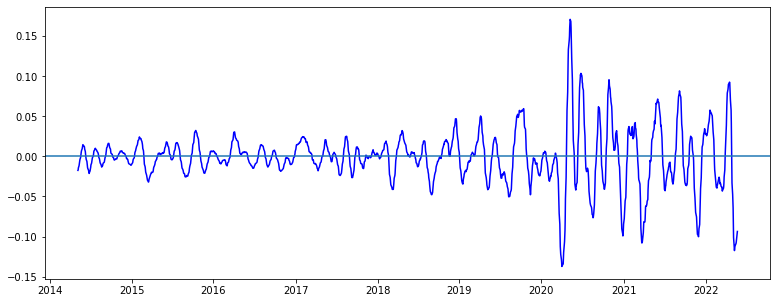

25 35 20 25


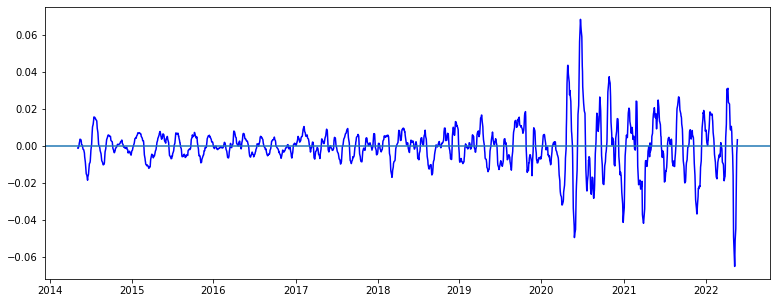

25 35 20 30


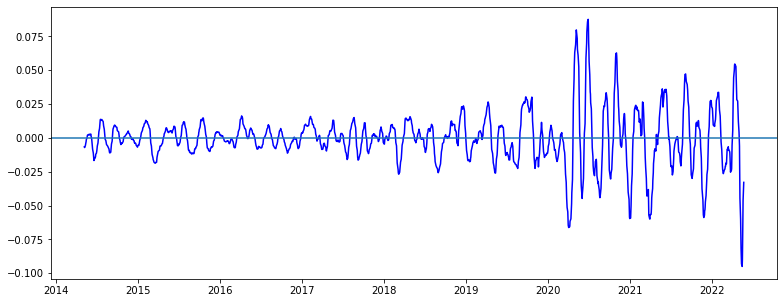

25 35 20 35


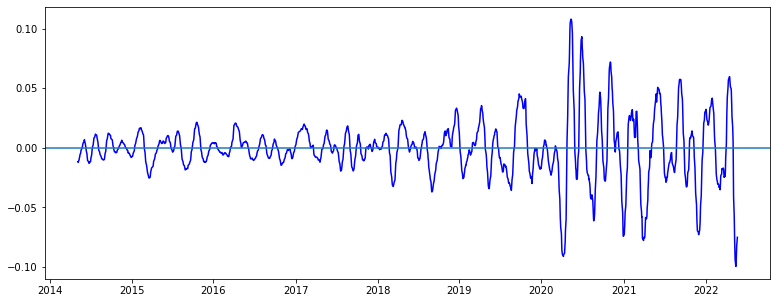

25 35 25 30


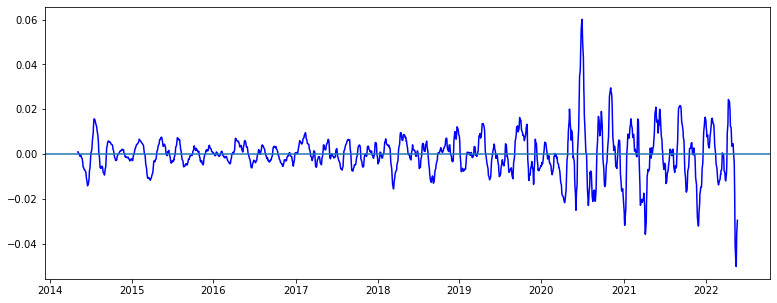

25 35 25 35


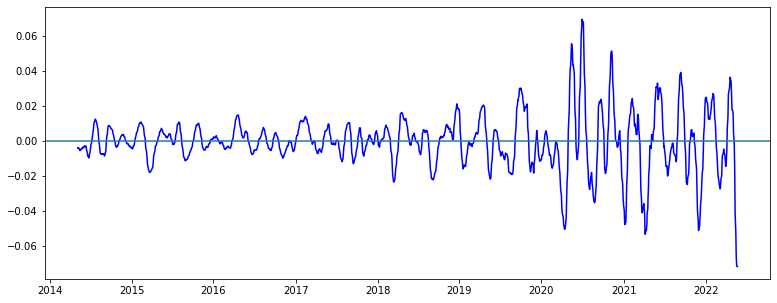

25 35 30 35


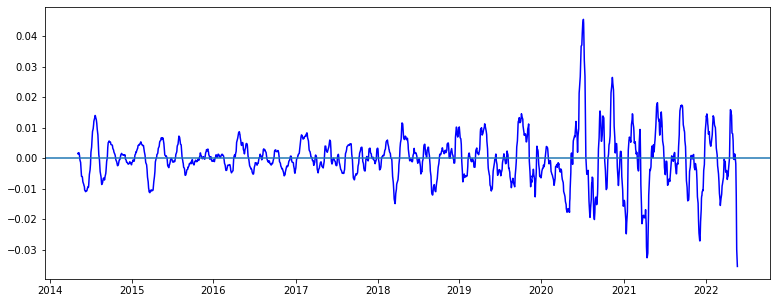

30 35 5 10


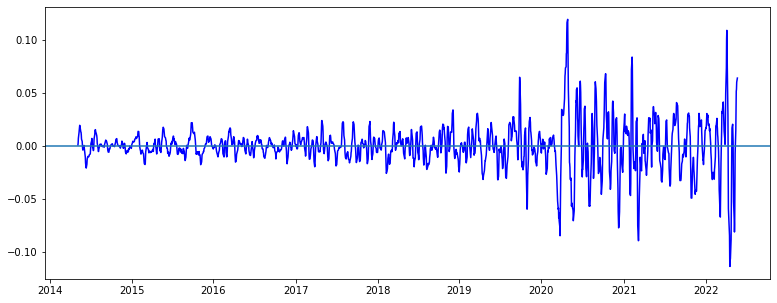

30 35 5 15


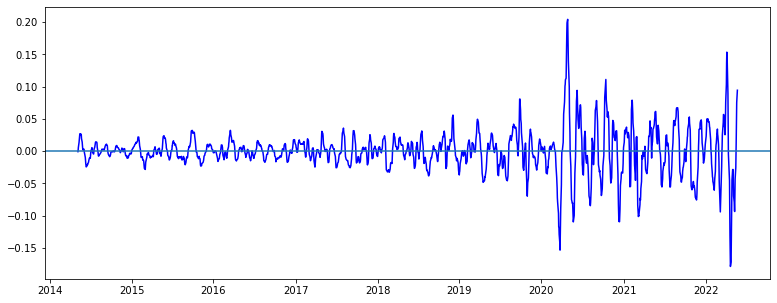

30 35 5 20


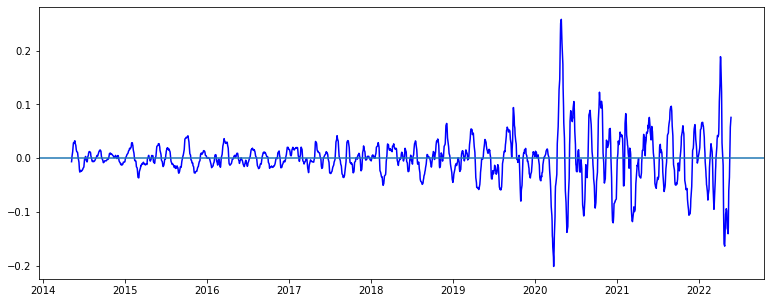

30 35 5 25


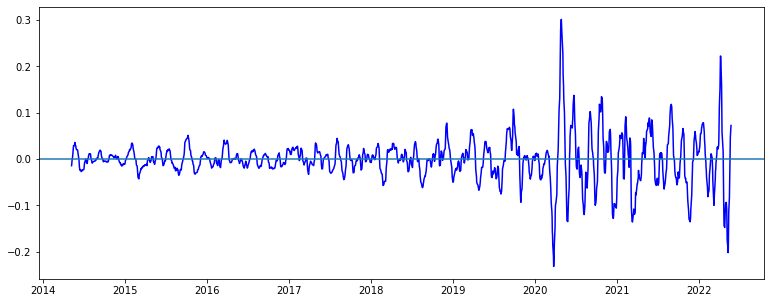

30 35 5 30


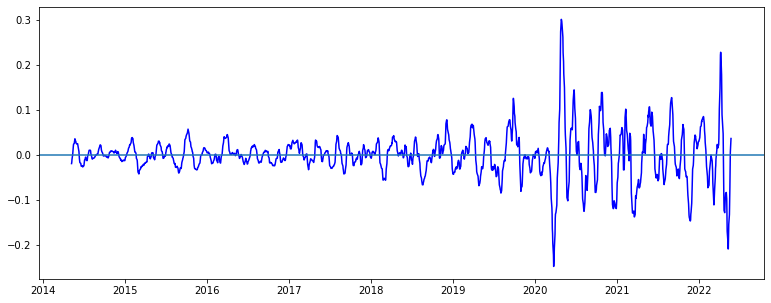

30 35 5 35


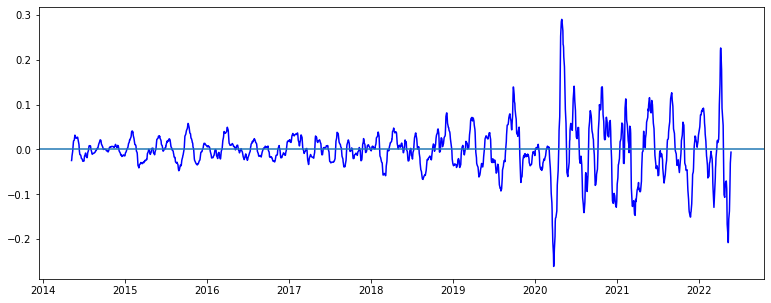

30 35 10 15


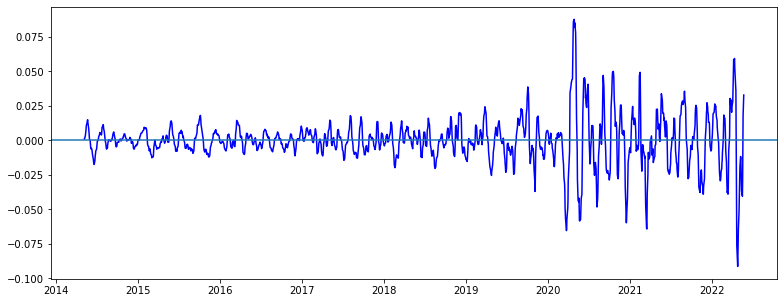

30 35 10 20


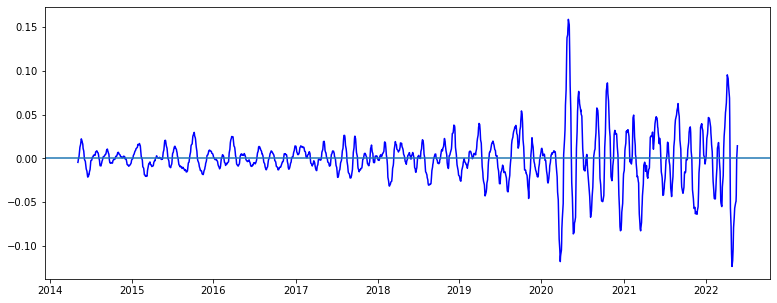

30 35 10 25


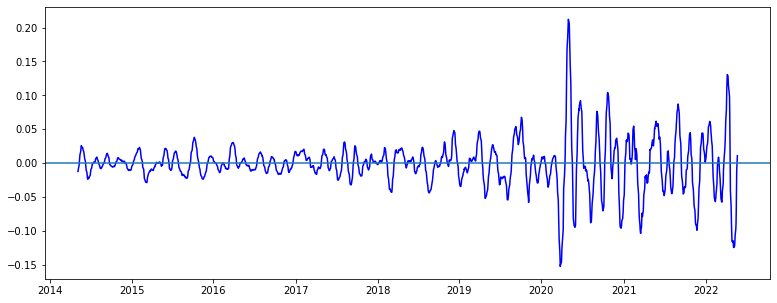

30 35 10 30


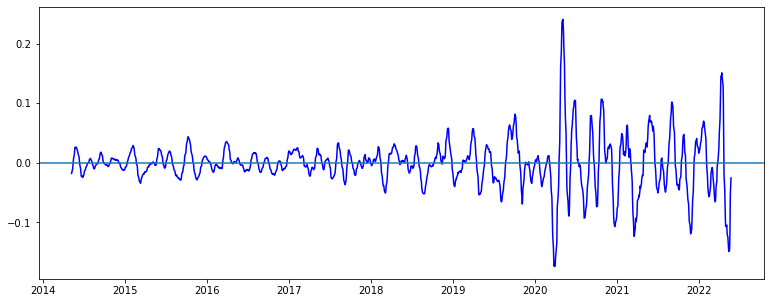

30 35 10 35


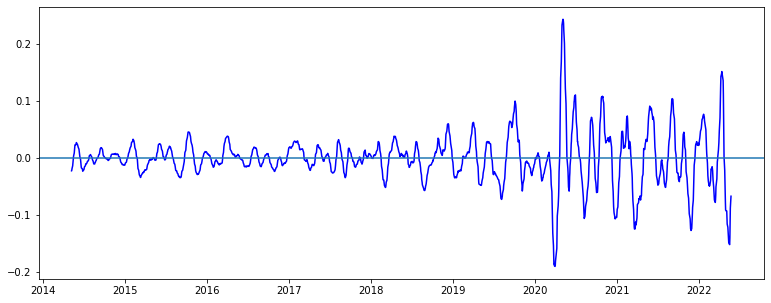

30 35 15 20


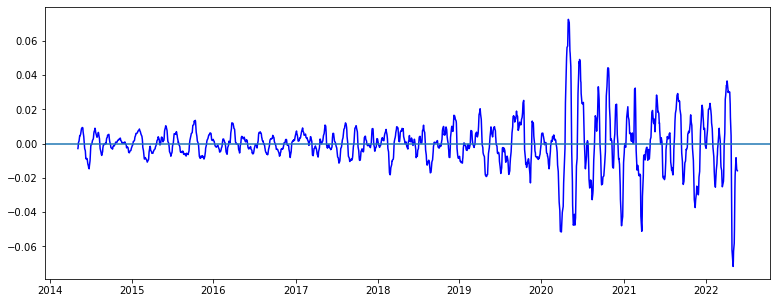

30 35 15 25


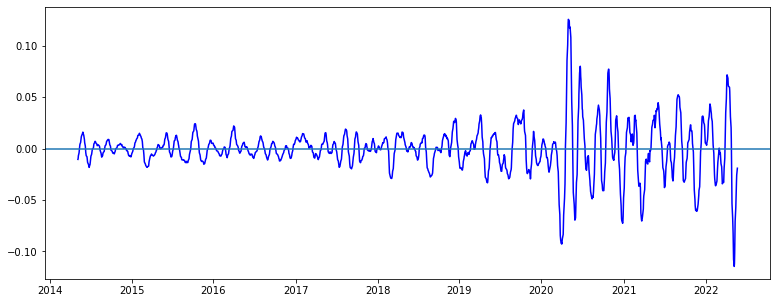

30 35 15 30


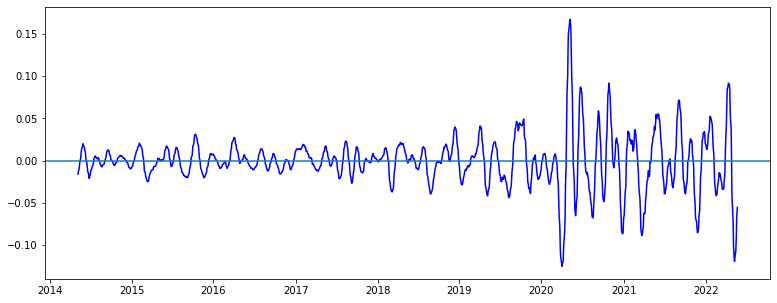

30 35 15 35


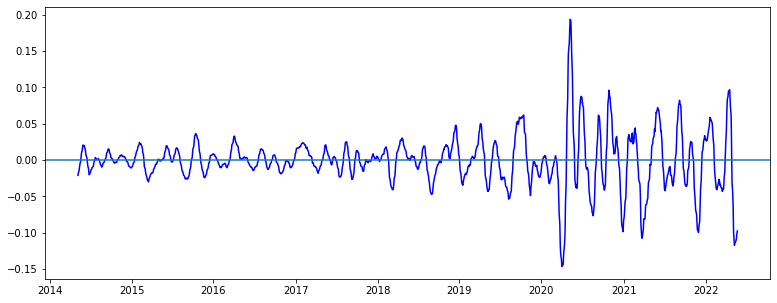

30 35 20 25


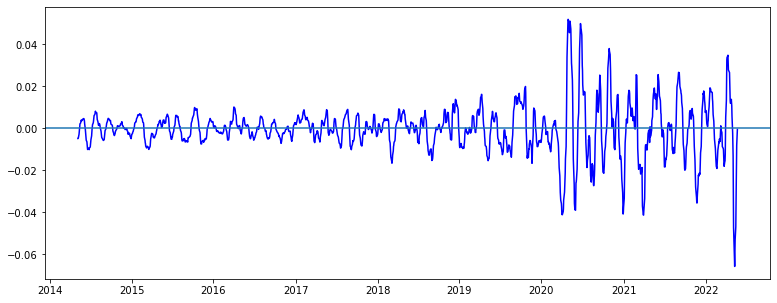

30 35 20 30


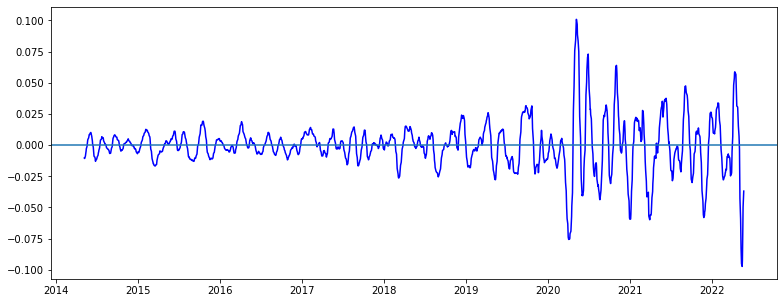

30 35 20 35


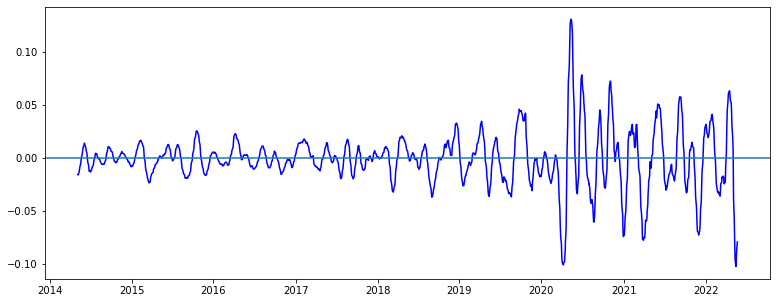

30 35 25 30


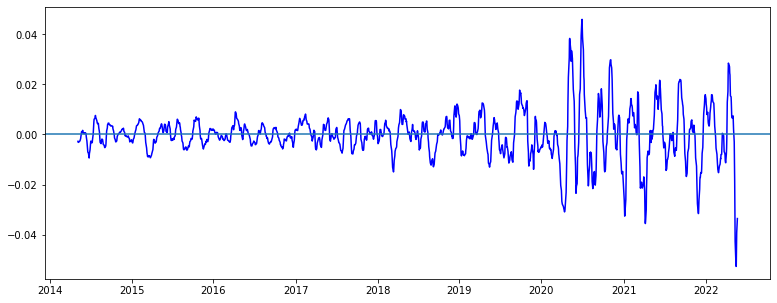

30 35 25 35


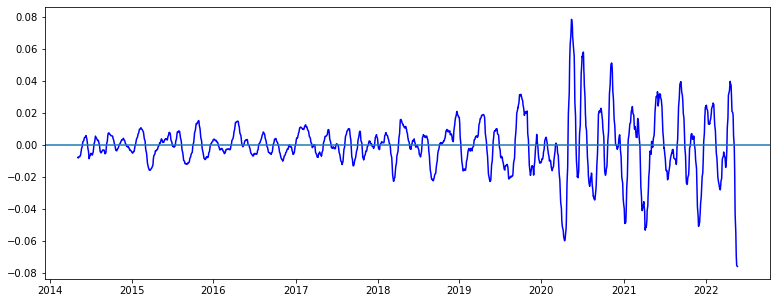

30 35 30 35


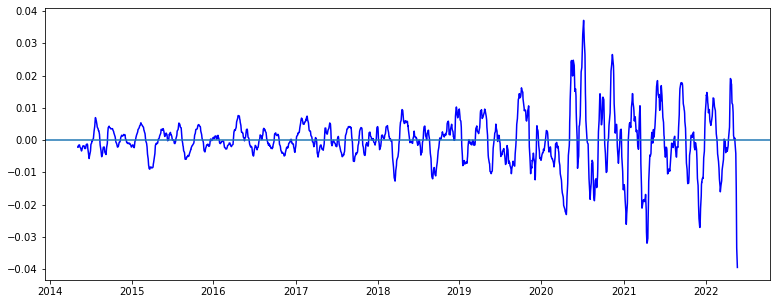

In [7]:
import itertools

vix_sm = np.arange(5,40,5)
vix_sm = list(itertools.combinations(vix_sm, 2))

data_sm = np.arange(5,40,5)
data_sm = list(itertools.combinations(data_sm, 2))
print(data_sm)

strat_opt_final = pd.DataFrame(columns=['short_thres','long_thres','long_ma','short_ma','Final Return',
                                        'vix_s','vix_l','data_s',  'data_l'])
for p in vix_sm:
    vix_s = p[0]
    vix_l = p[1]
    for q in data_sm:

        data_s = q[0]
        data_l = q[1]
        print(vix_s, vix_l, data_s,data_l)
        data_opt = moving_average_opt(VIX, data, vix_s=vix_s, vix_l=vix_l, data_s=data_s, data_l=data_l)
        fig, ax = plt.subplots(figsize=(13, 5))


        ax.plot(data_opt['combined'], color='b')
        ax.axhline(y=0)
        plt.show()
    
        
    

<AxesSubplot:xlabel='date'>

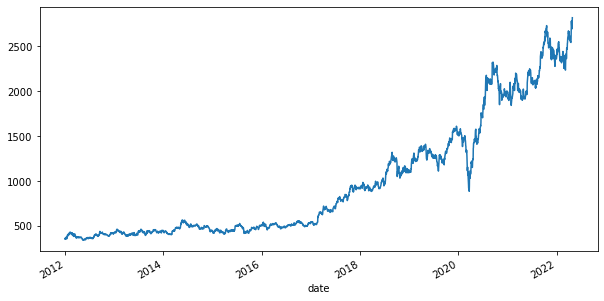

In [32]:
data['close'].plot(figsize=(10,5))

In [8]:
# ## Vix

# # Copy of the API extraction VIX
# VIX1 = VIX.copy()

# # Convert index to datetime
# VIX1.index = pd.to_datetime(VIX1.index)
# VIX1.rename(columns={'Close':'VIX'}, inplace=True)


# # Normalization of VIX
# VIX1 = VIX1.diff()

# # Smooth of VIX
# VIX1 = VIX1.rolling(30).mean()


# # MA crossover of VIX
# VIX1['VIX'] = VIX1['VIX'].rolling(20).mean() - VIX1['VIX'].rolling(30).mean() 
# display(VIX1.head())

# # Stock Price data
# data_anal = data.copy()

# # Merge of Stock Price and VIX
# data_anal = data_anal.merge(VIX1, left_index=True, right_index=True)

# # Drop Open, High, Low, Volume and Turnover
# data_anal.drop(columns=['Open', 'High', 'Low', 'Volume', 'Turnover', 'open', 'high', 'low', 'volume'], inplace=True)



# # data_anal['close'] = data_anal['close'].diff()
# columns = list(data_anal.columns)
# columns.remove('close_target')
# display(columns)

# data_anal[columns] = data_anal[columns].diff()

# data_anal[columns] = data_anal[columns].rolling(20).mean()
# data_anal['close'] = data_anal['close'].rolling(15).mean() - data_anal['close'].rolling(30).mean()
# data_anal['VIX'].plot()
# data_anal['close'].plot()
# plt.show()

# data_anal['combined'] = (data_anal['close']/50) + (data_anal['VIX'])

# data_anal.dropna(inplace=True)


# fig, ax = plt.subplots(figsize=(13, 5))
                       

# ax.plot(data_anal['combined'], color='b')
# ax.axhline(y=0)

#display((data_anal['VIX']['2020':]).plot(figsize=(10,5)))
#display(data_anal['combined']['2019'].plot(figsize=(10,5)))

In [111]:
def momentum_indicator_vix(data, long_threshold, short_threshold, long_ma, short_ma, plot=False):
    
    # Position signals 1 if the MA crossover indicates long, -1 if short, 0 when liquidating positions
    position = []
    
    # Value required for initialization
    history = []
    
    # Used for waiting the next opposite signal when liquidating a position. 
    # Example: if a long position gets liquidated, wait for a short signal to re-enter the strategy
    wait_signal = []
    data_anal = data.copy()
    
    long_threshold  = long_threshold
    short_threshold = short_threshold
    data_anal['long_ma'] = data['combined'].rolling(long_ma).mean()
    data_anal['short_ma'] = data['combined'].rolling(short_ma).mean()
    
    for i in range(len(data_anal)):
        
        #################### Initialization #########################
        if len(history) < 1:
            
            # Position short if short MA crosses Long MA from above
            if data_anal['combined'][i] >= short_threshold:
                position.append(0)
                history.append(1)
            
            # Position Long if short MA crosses Long MA from below
            elif data_anal['combined'][i] <= long_threshold:
                position.append(1)
                history.append(1)
            
            
            # Continue neutral if none of the above applies
            else:
                position.append(0)
                
        #################### Long Rules #########################
        elif (position[-1] == 1) and (len(history) >= 1):

            if (data_anal['combined'][i] < data_anal['short_ma'][i]) & (data_anal['combined'][i] > short_threshold):
                position.append(0)
            
            # Continue long if none of the above applies
            else:
                position.append(1)
                
        #################### Short Rules #########################        
        elif (position[-1] == 0) and (len(history) >= 1):
            

            if (data_anal['combined'][i] > data_anal['long_ma'][i]) & (data_anal['combined'][i] < long_threshold):
                position.append(1)
            
            # Continue short if none of the above applies
            else:
                position.append(0)
        
#         ######## Re-enter strategy after stop-loss liquidation ########
#         elif (position[-1] == 0) and (len(history) >= 1):
            
#             # Wait for long signal
#             if wait_signal[-1] == -1:
#                 if data_anal['ma_long'].iloc[i] < data_anal['ma_short'].iloc[i]:
#                     position.append(1)
#                 else:
#                     position.append(0)
                    
#             # Wait for short signal
#             elif wait_signal[-1] == 1:
#                 if data_anal['ma_long'].iloc[i] > data_anal['ma_short'].iloc[i]:
#                     position.append(-1)
#                 else:
#                     position.append(0)
                    
#             # Break strategy if stop-loss shows an unexpected value
#             else:
#                 print('Something is wrong - Stop Loss')
#                 break
                
        ######## Break strategy if something goes unexpected ########
        else: 
            print('Something is wrong')
            break
    
    # Add strategy's signal to the data_analframe
    data_anal['signals'] = position
    
    # Plotting
    if plot == True:
        #data_anal = data_anal['2018']
        data_anal['signal change'] = data_anal['signals'].eq(data_anal['signals'].shift(1))  # False when current value and previous value are different
        #data_anal['indicator'] = data_anal['ma_short'] - data_anal['ma_long'] # Plot difference between long/short MA 
        
        # Buy and sell dates positioning 
        buy_dates = data_anal[(data_anal['signals'] == 1) & (data_anal['signal change'] == False)] 
        sell_dates = data_anal[(data_anal['signals'] == 0) & (data_anal['signal change'] == False)] 

        
        fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(25, 20))
        
        # Add buy and sell enter pinpoints to plot
        ax[0].plot(buy_dates.index, buy_dates['close_target'], '^', color='green', markersize=10, label='Buy Dates')
        ax[0].plot(sell_dates.index, sell_dates['close_target'], 'v', color='red', markersize=10, label='Sell Dates')

        
        # Plot signals on top of the adjusted close
        ax[0].plot(data_anal.index, data_anal['close_target'], color='blue', label='SPY Adj Close')
#         ax[0].plot(data_anal.index, data_anal['ma_short'], color='green', label='Short MA')
#         ax[0].plot(data_anal.index, data_anal['ma_long'], color='red', label='Long MA')
        ax[0].title.set_text('SPY and MA crossover')
        
        ax[0].legend(loc="upper left")
        
        # Second plor with buy and sell dates on top of the indicator (difference between long and short MA)
        ax[1].plot(buy_dates.index, buy_dates['combined'], '^', color='green', markersize=10, label='Buy Dates')
        ax[1].plot(sell_dates.index, sell_dates['combined'], 'v', color='red', markersize=10, label='Sell Dates')
        ax[1].plot(data_anal.index, data_anal['combined'], color='blue', label= 'Momentum Indicator')
        ax[1].title.set_text('Momentum Indicator')
        ax[1].legend(loc="upper left")
        ax[1].axhline(y=long_threshold)
        ax[1].axhline(y=short_threshold)
        
#         # horizontal line in the 0 value
#         ax[1].axhline(y=0)
        plt.show()
    return data_anal

In [61]:
def momentum_vix_optimizer(df, init_capital, short_range, long_range, long_ma_range, short_ma_range):
    '''This function finds optimal value for MA crossover strategy
    
    df: OHLC dataset with Adjusted Close. Index should be datetime format
    
    ma_short: range of windows for the daily moving average for short MA
    
    ma_long: range of windows for the daily moving average for long MA
    
    stop_loss: range of percentage values for the stop loss
    
    ema: True to use Exponential Moving Average instead of Simple Moving Average'''
    
    data = df.copy()
    
    # Compute daily returns of the SPY
    data['target_returns'] = data['close_target'].pct_change()
    
    # Cummulative return of SPY
    data['buy_and_hold_strat'] = init_capital  * (1 + data['target_returns']).cumprod()
    
    
    return_list = []
    for s in short_range:
        print('Calculating Short {}-MA'.format(s))
        for l in long_range:
            
            # Execute if short MA is lower than long MA
            if s > l:
                for l_ma in long_ma_range:
                    for s_ma in short_ma_range:
                        temp_strat = momentum_indicator_vix(data, short_threshold=s, 
                                                            long_threshold=l, long_ma=l_ma, short_ma=s_ma, plot=False)

                        # Copy daily return of the SPY
                        temp_strat['target_returns'] = data['target_returns'].values

                        # Compute daily returns and cummulative returns of the MA crossover strategy
                        ############# Note: the shift of the signals is crucial to avoid look-ahead bias ###########
                        temp_strat['m_strat_returns'] = data['target_returns'] * temp_strat['signals']
                        temp_strat['m_strat_cumsum'] = init_capital * (1 + temp_strat['m_strat_returns']).cumprod()
                        
                        window=252
                        Roll_Max = temp_strat['m_strat_cumsum'].rolling(window, min_periods=1).max()
                        Daily_Drawdown = temp_strat['m_strat_cumsum']/Roll_Max - 1.0

                        # Next we calculate the minimum (negative) daily drawdown in that window.
                        # Again, use min_periods=1 if you want to allow the expanding window
                        Max_Daily_Drawdown = Daily_Drawdown.rolling(window, min_periods=1).min()
                        Max_Daily_Drawdown = Max_Daily_Drawdown.min() * -1

                        if (Max_Daily_Drawdown == 0.0) or (Max_Daily_Drawdown == -0.0):
                            pass
                        
                        else:
                            calmar_ratio = ((1+temp_strat['m_strat_returns'].mean())**252-1) / (Max_Daily_Drawdown)


                            # Store parameters with final value of the cummulative return
                            return_list.append([s, l , l_ma, s_ma, temp_strat['m_strat_cumsum'].iloc[-1], Max_Daily_Drawdown, calmar_ratio])

            else: 
                pass
    
    # Convert values stored on the return_list to dataframe
    opt_df = pd.DataFrame(return_list, columns=['short_thres', 'long_thres', 'long_ma', 'short_ma', 'Final Return', 'Max_DD', 'calmar_ratio'])
    
    # Sort values to extract the top 5 combination of parameters with best performance based on final value of cummulative return
    opt_df = opt_df.sort_values(by=['Final Return'], ascending=False)
    opt_df = opt_df.iloc[:5,:]
    
    # Convert values stored on the return_list to dataframe
    opt_df2 = pd.DataFrame(return_list, columns=['short_thres', 'long_thres', 'long_ma', 'short_ma', 'Final Return', 'Max_DD', 'calmar_ratio'])
    
    # Sort values to extract the top 5 combination of parameters with best performance based on final value of cummulative return
    opt_df2 = opt_df2[opt_df2['Max_DD'] > 0.10]
    opt_df2 = opt_df2[opt_df2['Max_DD'] < 0.30]
    opt_df2 = opt_df2.sort_values(by=['calmar_ratio'], ascending=False)
    
    opt_df2 = opt_df2.iloc[:5,:]
    
    return opt_df, opt_df2, data
                
    
# strat_opt, b_h = momentum_vix_optimizer(df = data_anal, 
#                                   init_capital = 10000, 
#                                   short_range = np.arange(0, 0.03, 0.002), 
#                                   long_range = np.arange(0, -0.03, -0.01),
#                                   long_ma_range = np.arange(2, 10, 2),
#                                   short_ma_range = np.arange(2, 10, 2))

In [120]:
import itertools

vix_sm = np.arange(5,30,5)
vix_sm = list(itertools.combinations(vix_sm, 2))

data_sm = np.arange(5,30,5)
data_sm = list(itertools.combinations(data_sm, 2))
print(data_sm)

strat_opt_final = pd.DataFrame(columns=['short_thres','long_thres','long_ma','short_ma','Final Return',
                                        'vix_s','vix_l','data_s',  'data_l'])
for p in vix_sm:
    vix_s = p[0]
    vix_l = p[1]
    for q in data_sm:

        data_s = q[0]
        data_l = q[1]
        print(vix_s, vix_l, data_s,data_l)
        data_opt = moving_average_opt(VIX, data, vix_s=vix_s, vix_l=vix_l, data_s=data_s, data_l=data_l)
        strat_opt, dd_opt, b_h = momentum_vix_optimizer(df = data_opt, 
                                  init_capital = 10000, 
                                  short_range = np.arange(0, 0.02, 0.002), 
                                  long_range = np.arange(0, -0.02, -0.002),
                                  long_ma_range = np.arange(2, 10, 2),
                                  short_ma_range = np.arange(2, 10, 2))
        
        strat_opt['vix_s'] = [vix_s for i in range(5)]
        strat_opt['vix_l'] = [vix_l for i in range(5)]
        strat_opt['data_s'] = [data_s for i in range(5)]
        strat_opt['data_l'] = [data_l for i in range(5)]
        strat_opt_final = strat_opt_final.append(strat_opt, ignore_index=True)
        display(strat_opt.head())
        display(dd_opt.head())
        
        
        
    

[(5, 10), (5, 15), (5, 20), (5, 25), (10, 15), (10, 20), (10, 25), (15, 20), (15, 25), (20, 25)]
5 10 5 10
Calculating Short 0.0-MA
Calculating Short 0.002-MA
Calculating Short 0.004-MA
Calculating Short 0.006-MA
Calculating Short 0.008-MA
Calculating Short 0.01-MA
Calculating Short 0.012-MA
Calculating Short 0.014-MA
Calculating Short 0.016-MA
Calculating Short 0.018000000000000002-MA


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio,vix_s,vix_l,data_s,data_l
146,0.002,0.000,2,6,61870.180890,0.483923,0.662209,5,10,5,10
499,0.006,-0.004,2,8,51170.084022,0.522781,0.569864,5,10,5,10
515,0.006,-0.006,2,8,51108.357838,0.522781,0.561456,5,10,5,10
817,0.010,-0.004,2,4,50734.388460,0.507292,0.575314,5,10,5,10
147,0.002,0.000,2,8,49645.139228,0.486161,0.593223,5,10,5,10


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio
1372,0.016,-0.012,8,2,31792.071822,0.172571,1.031864
1373,0.016,-0.012,8,4,31780.665948,0.190783,0.995281
1532,0.018,-0.012,8,2,31896.170674,0.190783,0.993295
894,0.010,-0.012,8,6,27712.528900,0.164943,0.945616
1258,0.014,-0.018,6,6,27297.968176,0.167230,0.899238


5 10 5 15
Calculating Short 0.0-MA
Calculating Short 0.002-MA
Calculating Short 0.004-MA
Calculating Short 0.006-MA
Calculating Short 0.008-MA
Calculating Short 0.01-MA
Calculating Short 0.012-MA
Calculating Short 0.014-MA
Calculating Short 0.016-MA
Calculating Short 0.018000000000000002-MA


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio,vix_s,vix_l,data_s,data_l
835,0.010,-0.006,2,8,63304.669616,0.521635,0.629980,5,10,5,15
834,0.010,-0.006,2,6,57434.414888,0.521141,0.590330,5,10,5,15
675,0.008,-0.006,2,8,56552.568103,0.514819,0.599847,5,10,5,15
1314,0.016,-0.006,2,6,55319.790555,0.539334,0.571535,5,10,5,15
819,0.010,-0.004,2,8,53336.477582,0.542388,0.555793,5,10,5,15


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio
12,0.000,-0.002,8,2,21081.175842,0.285214,0.426924
28,0.000,-0.004,8,2,20862.777619,0.285214,0.420747
622,0.006,-0.018,8,6,15166.815215,0.170366,0.406923
782,0.008,-0.018,8,6,15166.815215,0.170366,0.406923
623,0.006,-0.018,8,8,15498.478205,0.182584,0.397751


5 10 5 20
Calculating Short 0.0-MA
Calculating Short 0.002-MA
Calculating Short 0.004-MA
Calculating Short 0.006-MA
Calculating Short 0.008-MA
Calculating Short 0.01-MA
Calculating Short 0.012-MA
Calculating Short 0.014-MA
Calculating Short 0.016-MA
Calculating Short 0.018000000000000002-MA


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio,vix_s,vix_l,data_s,data_l
1155,0.014,-0.006,2,8,44167.604925,0.532107,0.505660,5,10,5,20
1139,0.014,-0.004,2,8,44167.604925,0.532107,0.505660,5,10,5,20
1313,0.016,-0.006,2,4,43540.141447,0.541975,0.484276,5,10,5,20
1297,0.016,-0.004,2,4,43353.222131,0.541975,0.483045,5,10,5,20
1331,0.016,-0.008,2,8,43029.493393,0.535563,0.498668,5,10,5,20


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio
140,0.0,-0.018,8,2,13045.707812,0.266549,0.195087


5 10 5 25
Calculating Short 0.0-MA
Calculating Short 0.002-MA
Calculating Short 0.004-MA
Calculating Short 0.006-MA
Calculating Short 0.008-MA
Calculating Short 0.01-MA
Calculating Short 0.012-MA
Calculating Short 0.014-MA
Calculating Short 0.016-MA
Calculating Short 0.018000000000000002-MA


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio,vix_s,vix_l,data_s,data_l
1281,0.016,-0.002,2,4,41812.382286,0.539209,0.475360,5,10,5,25
1269,0.016,0.000,4,4,40755.183521,0.530404,0.473675,5,10,5,25
1273,0.016,0.000,6,4,40239.174133,0.539349,0.460799,5,10,5,25
1305,0.016,-0.004,6,4,40111.423663,0.539349,0.455160,5,10,5,25
1297,0.016,-0.004,2,4,39025.840361,0.539209,0.454021,5,10,5,25


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio


5 10 10 15
Calculating Short 0.0-MA
Calculating Short 0.002-MA
Calculating Short 0.004-MA
Calculating Short 0.006-MA
Calculating Short 0.008-MA
Calculating Short 0.01-MA
Calculating Short 0.012-MA
Calculating Short 0.014-MA
Calculating Short 0.016-MA
Calculating Short 0.018000000000000002-MA


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio,vix_s,vix_l,data_s,data_l
1145,0.014,-0.004,6,4,48225.150198,0.534527,0.547246,5,10,10,15
826,0.010,-0.004,6,6,47846.701439,0.512664,0.557924,5,10,10,15
1289,0.016,-0.002,6,4,47705.640756,0.534527,0.553955,5,10,10,15
1273,0.016,0.000,6,4,46976.264889,0.534527,0.549571,5,10,10,15
1305,0.016,-0.004,6,4,46938.876640,0.534527,0.547110,5,10,10,15


,short_thres,long_thres,long_ma,short_ma,Final Return,Max_DD,calmar_ratio
152,0.002,0.000,6,2,36389.843705,0.299741,0.694767
717,0.008,-0.010,8,4,25731.310554,0.239520,0.634748
716,0.008,-0.010,8,2,20027.660742,0.195348,0.564365
411,0.004,-0.012,6,8,19242.518402,0.184956,0.553474
729,0.008,-0.012,6,4,22520.360866,0.250744,0.517369


5 10 10 20
Calculating Short 0.0-MA
Calculating Short 0.002-MA


KeyboardInterrupt: 

In [91]:
VIX.head()

,Open,High,Low,Close,Volume,Turnover
Date,,,,,,
2012-01-02,27.11,28.68,27.11,27.53,NaN,NaN
2012-01-03,27.53,27.53,25.99,26.16,NaN,NaN
2012-01-04,26.16,26.84,25.60,26.41,NaN,NaN
2012-01-05,26.41,26.60,25.72,25.91,NaN,NaN
2012-01-06,25.91,26.44,25.09,25.46,NaN,NaN


In [ ]:
short_thres  long_thres  long_ma  short_ma  Final Return  vix_s  vix_l  data_s  data_l
114        0.005         0.0        2         6  98936.563483     10     25      25      30

In [ ]:
    short_thres  long_thres  long_ma  short_ma  Final Return  vix_s  vix_l  data_s  data_l
118        0.005         0.0        4         6  79729.235382     10     15      15      20

In [47]:
opt_opt.head()

,close,close_target,VIX,combined,long_ma,short_ma,signals,signal change,target_returns,m_strat_returns,m_strat_cumsum,buy_hold_strat
2012-04-18,-0.089833,134.10,-0.007563,-0.009360,NaN,NaN,1,False,NaN,NaN,NaN,NaN
2012-04-19,-0.045792,130.65,-0.005712,-0.006627,-0.007994,-0.007994,1,True,-0.025727,-0.025727,9742.729306,9742.729306
2012-04-20,-0.007125,127.25,-0.003783,-0.003926,-0.005277,-0.005277,1,True,-0.026024,-0.026024,9489.187174,9489.187174
2012-04-23,0.047625,128.65,-0.002702,-0.001749,-0.002837,-0.002837,1,True,0.011002,0.011002,9593.586875,9593.586875
2012-04-24,0.095167,129.65,-0.001968,-0.000065,-0.000907,-0.000907,1,True,0.007773,0.007773,9668.158091,9668.158091


In [ ]:
short_thres	long_thres	long_ma	short_ma	Final Return	Max_DD	vix_s	vix_l	data_s	data_l
0.005	0.0	6	4	73525.618253	-0.450884	5	15	15	20

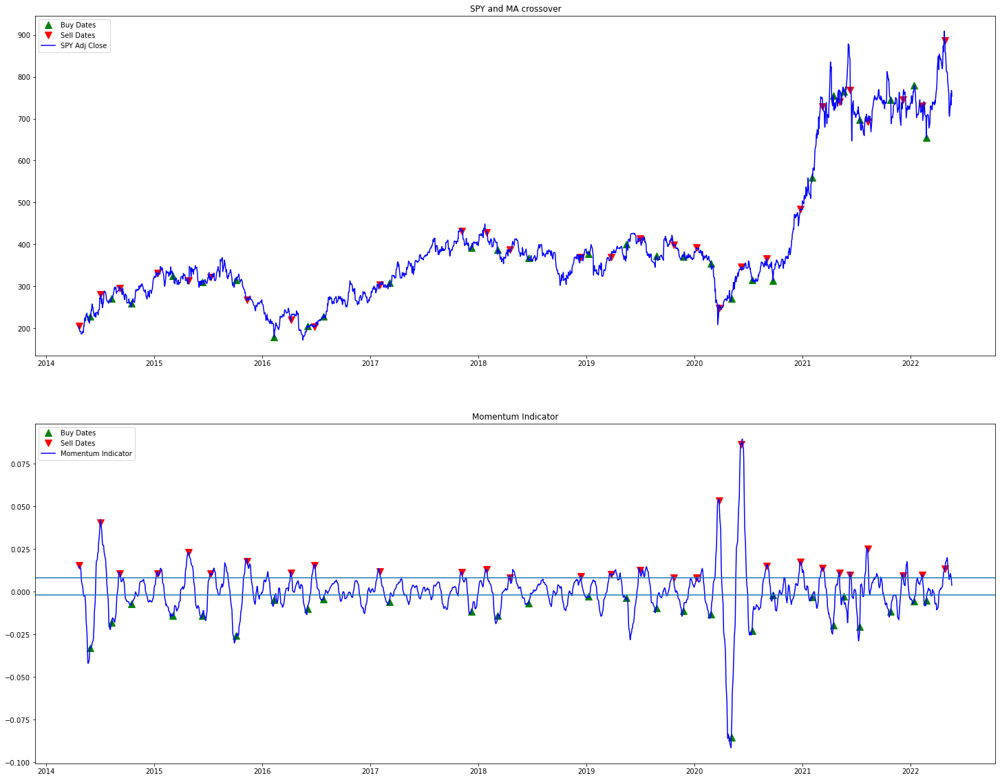

C:\Users\ianaz\AppData\Local\Temp/ipykernel_10556/3010108784.py:15: FutureWarning: Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.
  opt_opt = opt_opt['2022']


In [148]:
# max return
data_opt = moving_average_opt(VIX, data, vix_s=5, vix_l=25, data_s=20, data_l=25)
opt_opt =  momentum_indicator_vix(data_opt, short_threshold=0.008, long_threshold=-0.002, long_ma=8, short_ma=2, plot=True)

# min drawdown
# data_opt = moving_average_opt(VIX, data, vix_s=5, vix_l=15, data_s=15, data_l=20)
# opt_opt =  momentum_indicator_vix(data_opt, short_threshold=0.005, long_threshold=0.0, long_ma=6, short_ma=4, plot=True)

df_backtest = data_opt.copy()
df_backtest['target_returns'] = df_backtest['close_target'].pct_change()

# Compute daily returns and cummulative returns of the MA crossover strategy
############# Note: the shift of the signals is crucial to avoid look-ahead bias ###########

opt_opt = opt_opt['2022']
opt_opt['target_returns'] = df_backtest['target_returns']
opt_opt['m_strat_returns'] = opt_opt['target_returns'] * opt_opt['signals']
opt_opt['m_strat_cumsum'] = 10000 * (1 + opt_opt['m_strat_returns']).cumprod()
opt_opt['buy_hold_strat'] = 10000 * (1 + opt_opt['target_returns']).cumprod()

<AxesSubplot:>

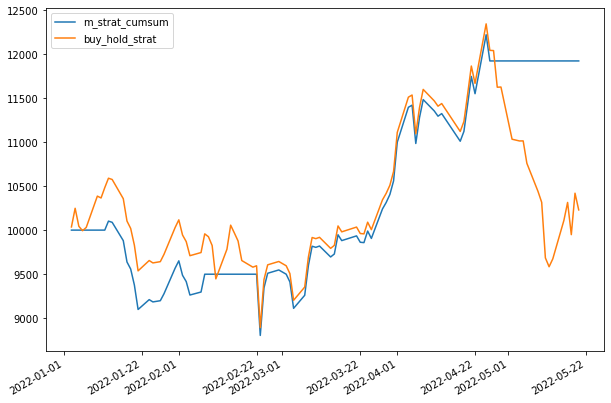

In [149]:
opt_opt[['m_strat_cumsum', 'buy_hold_strat']].plot(figsize=(10,7))

In [128]:
display(len(opt_opt)/len(opt_opt[opt_opt['signal change'] == False]))

35.01754385964912

<AxesSubplot:xlabel='date'>

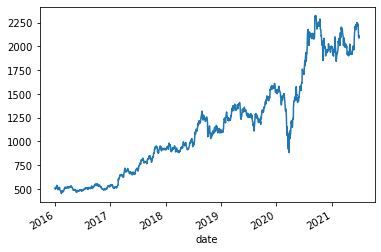

In [43]:
data['close'].plot()

In [131]:
# window=252
# Roll_Max = opt_opt['buy_hold_strat'].rolling(window, min_periods=1).max()
# Daily_Drawdown = opt_opt['buy_hold_strat']/Roll_Max - 1.0

# # Next we calculate the minimum (negative) daily drawdown in that window.
# # Again, use min_periods=1 if you want to allow the expanding window
# Max_Daily_Drawdown = Daily_Drawdown.rolling(window, min_periods=1).min()

In [132]:
# Max_Daily_Drawdown.min()

In [133]:
# df_merge[['m_strat_cumsum', 'buy_and_hold_strat']].plot(figsize=(12,8))
# plt.title('Momentum Strategy with Initial Capital of $10,000 (USD) - 5 Year Return', fontsize=20)
# plt.yticks(size = 15)
# plt.xticks(size = 15)
# plt.show()

In [113]:
df_merge.tail()

,close_x,close_target_x,VIX_x,combined_x,long_ma,short_ma,signals,signal change,target_returns_x,m_strat_returns,m_strat_cumsum,close_y,close_target_y,VIX_y,combined_y,target_returns_y,buy_and_hold_strat
2021-12-24,-0.465750,723.20,0.000070,-0.009245,-0.002643,-0.005312,-1,True,0.001107,-0.001107,102256.420721,0.445550,723.20,0.002353,0.011264,0.001107,37172.963249
2021-12-27,-0.439667,729.25,-0.000789,-0.009583,-0.004769,-0.007582,-1,True,0.008366,-0.008366,101400.984680,0.566617,729.25,0.001403,0.012736,0.008366,37483.937291
2021-12-28,-0.386000,722.75,-0.001722,-0.009442,-0.006712,-0.008811,-1,True,-0.008913,0.008913,102304.798736,0.541850,722.75,0.000333,0.011170,-0.008913,37149.832948
2021-12-29,-0.276417,724.25,-0.002324,-0.007852,-0.007937,-0.009030,-1,True,0.002075,-0.002075,102092.474698,0.417950,724.25,-0.000288,0.008071,0.002075,37226.933950
2021-12-30,-0.243000,730.30,-0.002479,-0.007339,-0.008406,-0.008554,-1,True,0.008353,-0.008353,101239.648365,0.293400,730.30,-0.000494,0.005374,0.008353,37537.907993


### Past Week tasks (done)
- Difference between market price and bulk price
- Filter buy and sell transactions
- Exit signals 
- Optimization on cumulative returns 
- VIX integration

### Week tasks (done)
- Optimize the moving average that smooths the VIX and stock price, also their optimal weighting 
- Optimize for the buying signals, instead of both signals, or use sell signals as neutral signals
- Test on multiple stocks prices
- Test on indexes 

### Further next steps
- Apply similar strategy on intraday data
- Apply metalabeling machine learning layer for size positioning and binary approach 

In [105]:
def gen_stats(data, returns, freq=None, window=None, strategy=False):
    
    target_ret = data[returns]
    pfstats = pd.DataFrame(columns=['Strategy'])
                       
    # Mean / std. dev. of return
    ret_m = target_ret.mean()
    ret_s = target_ret.std()
    
    if freq == 'daily':
        ret_ann = (1+ret_m)**252-1
        ret_vol = ret_s*np.sqrt(252)

    if freq == 'weekly':
        ret_ann = (1+ret_m)**52-1
        ret_vol = ret_s*np.sqrt(52)
        
    pfstats.loc['Ann. Return'] = str(round(ret_ann * 100, 1)) + '%'
    pfstats.loc['Ann. Volatility'] = str(round(ret_vol * 100, 1)) + '%'

    # Sharpe
    sharpe = ret_ann/ret_vol
    
    pfstats.loc['Sharpe Ratio (ann.)'] = sharpe.round(2)

    # Maximum Drawdown rolling
    cum_ret = 1000*(1+target_ret).cumprod()-1
    max_dd = cum_ret/cum_ret.rolling(window).max()-1
    max_dd = max_dd.min()


    if freq == 'weekly':
        max_dd_string = str(window)+'-W'
        pfstats.loc['Max. DD ('+max_dd_string+' rolling)'] = str(round(max_dd * 100, 1)) + '%'
 
    # Skewness
    ret_skew = target_ret.skew()
    ret_skew_ann = ret_skew/np.sqrt(252)
    
    pfstats.loc['Skew (ann.)'] = ret_skew_ann.round(2)
        
    return pfstats


In [114]:
df_merge.tail()

,open_x,high_x,low_x,close_x,volume_x,close_target_x,VIX_x,combined_x,long_ma_x,signals_x,target_returns_x,m_strat_returns_x,m_strat_cumsum_x,signal change_x,open_y,high_y,low_y,close_y,volume_y,close_target_y,VIX_y,combined_y,long_ma_y,signals_y,target_returns_y,m_strat_returns_y,m_strat_cumsum_y,signal change_y,buy_and_hold_strat
2021-12-24,-0.875,-1.5550,-0.0025,0.579250,-163658.85,723.20,0.002183,0.013768,0.020559,-1,0.001107,-0.001107,60990.567290,True,-0.875,-1.5550,-0.0025,0.579250,-163658.85,723.20,0.002183,0.013768,0.016501,-1,0.001107,-0.001107,28768.202511,True,30709.129512
2021-12-27,0.500,0.5725,1.4975,0.566583,-163353.30,729.25,0.001770,0.013101,0.019241,-1,0.008366,-0.008366,60480.344762,True,0.500,0.5725,1.4975,0.566583,-163353.30,729.25,0.001770,0.013101,0.014318,-1,0.008366,-0.008366,28527.539313,True,30966.029724
2021-12-28,1.155,1.3125,2.2900,0.489750,-129330.55,722.75,0.001199,0.010994,0.017849,-1,-0.008913,0.008913,61019.422226,True,1.155,1.3125,2.2900,0.489750,-129330.55,722.75,0.001199,0.010994,0.012621,-1,-0.008913,0.008913,28781.812889,True,30690.021231
2021-12-29,1.700,1.1600,1.8650,0.327417,-159285.45,724.25,0.000869,0.007417,0.016247,-1,0.002075,-0.002075,60892.782125,True,1.700,1.1600,1.8650,0.327417,-159285.45,724.25,0.000869,0.007417,0.010504,-1,0.002075,-0.002075,28722.078929,True,30753.715499
2021-12-30,0.645,-0.8125,0.7075,0.102000,-241205.30,730.30,0.000542,0.002583,0.014002,-1,0.008353,-0.008353,60384.116150,True,0.645,-0.8125,0.7075,0.102000,-241205.30,730.30,0.000542,0.002583,0.006998,-1,0.008353,-0.008353,28482.149930,True,31010.615711


In [150]:
df_pct = opt_opt[['m_strat_cumsum', 'buy_hold_strat']].copy()
df_pct = df_pct.pct_change()

In [151]:
ff_stats = gen_stats(df_pct, 'buy_hold_strat', freq='daily', window=252)
ff_stats.columns = ['Buy and Hold Strategy']

emlc_stats = gen_stats(df_pct, 'm_strat_cumsum', freq='daily', window=252)
emlc_stats.columns = ['Momentum VIX Strategy']

full_stats = pd.concat([ff_stats, emlc_stats], axis=1)
full_stats.fillna('-', inplace=True)

display(full_stats)

,Buy and Hold Strategy,Momentum VIX Strategy
Ann. Return,13.5%,68.3%
Ann. Volatility,38.8%,29.7%
Sharpe Ratio (ann.),0.35,2.3
Skew (ann.),-0.01,-0.0
